!pip install segmentation-models

In [1]:
%load_ext autoreload

%autoreload 2
import numpy as np
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import cv2
import keras
import numpy as np
#import matplotlib.pyplot as plt

import sys
from pathlib import Path
module_folder = os.path.abspath('../gridsaliency-original')
if module_folder not in sys.path:
    sys.path.append(module_folder)
from mnist_generators_simple import gen_texture_mnist, plot_samples
scr_folder = os.path.abspath('../scr')
if scr_folder not in sys.path:
    sys.path.insert(1, scr_folder)
from dataloaders import Cityscapes
from metrics import iou_coef, dice_coef, dice_loss
from unet import csbd_unet, manual_unet, TrainUnet
from training_write import TrainingParameters, TrainingResults
from training_plots import plot_predict_and_gt, plot_loss, plot_metric
from seggradcam import SegGradCAM, SuperRoI, ClassRoI, PixelRoI, BiasRoI
import matplotlib.pyplot as plt
from visualize_sgc import SegGradCAMplot

Using TensorFlow backend.


In [2]:
#Path to the dataset
path = "C:\\Users\\vinograd\\Documents\\GitHub\\Seg-Grad-CAM\\inputs\\cityscapes\\leftImg8bit_trainvaltest\\leftImg8bit"
#path = "../../inputs/cityscapes/leftImg8bit_trainvaltest/leftImg8bit"
BATCH_SIZE = 4
trainparam = TrainingParameters(
epochs = 50,
    scale = 4,
    batch_size = BATCH_SIZE, 
n_train= 10, #2975 max
n_val = 10 # 500 max #"""
,steps_per_epoch = 10 #int(3000/BATCH_SIZE) #1400
    ,validation_steps = 10 # int(500/BATCH_SIZE)
    
    )
#trainparam.saveToJson()

trainset = Cityscapes(n = trainparam.n_train, shuffle = True, scale = trainparam.scale, prefix = "train",normalize=True)
valset = Cityscapes(n = trainparam.n_val, shuffle = False, scale = trainparam.scale, prefix = "val",normalize=True)
#trainset.get_and_save_npz(path)
#valset.get_and_save_npz(path)
trainset.load_npz()
valset.load_npz()

In [3]:
trainset.X[2]

array([[[0.28627452, 0.34901962, 0.28235295],
        [0.29411766, 0.36078432, 0.2901961 ],
        [0.2901961 , 0.3529412 , 0.28235295],
        ...,
        [0.1254902 , 0.19215687, 0.13725491],
        [0.12941177, 0.1882353 , 0.13725491],
        [0.13333334, 0.20392157, 0.13725491]],

       [[0.2901961 , 0.36078432, 0.29411766],
        [0.27450982, 0.3372549 , 0.27450982],
        [0.28235295, 0.34901962, 0.28235295],
        ...,
        [0.10980392, 0.16862746, 0.12156863],
        [0.1254902 , 0.2       , 0.14117648],
        [0.13725491, 0.21176471, 0.15294118]],

       [[0.2901961 , 0.34901962, 0.28235295],
        [0.28627452, 0.34117648, 0.27450982],
        [0.28235295, 0.3372549 , 0.27450982],
        ...,
        [0.12156863, 0.1882353 , 0.12941177],
        [0.13725491, 0.20392157, 0.14509805],
        [0.10980392, 0.16470589, 0.10980392]],

       ...,

       [[0.15686275, 0.21176471, 0.18431373],
        [0.14901961, 0.20784314, 0.18039216],
        [0.16078432, 0

tuple(np.array([trainset.X, trainset.Y]).T)[80].shape

In [4]:
trainset.Y.shape

(10, 256, 512, 8)

In [4]:
import segmentation_models as sm

BACKBONE = 'vgg16'
preprocess_input = sm.get_preprocessing(BACKBONE)

# define network parameters
n_classes = trainparam.n_classes  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights='imagenet')
n_classes

Segmentation Models: using `keras` framework.


8

In [5]:
BATCH_SIZE = 4
#CLASSES = ['car', 'pedestrian']
LR = 0.00045
EPOCHS = 150
"""
train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 320, 320, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 320, 320, n_classes)
"""
# define callbacks for learning rate scheduling and best checkpoints saving
mdir = '../../output/sm_16_07/'
try:
    os.mkdir(mdir)
except OSError as error: 
    print(error) 
callbacks = [
    keras.callbacks.ModelCheckpoint(mdir+'best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]

[WinError 183] Cannot create a file when that file already exists: '../../output/sm_16_07/'


In [6]:
# define optomizer
optim = keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (car: 1.; pedestrian: 2.; background: 0.5;)
dice_loss = sm.losses.DiceLoss()#class_weights=np.array([1, 2, 0.5])) 
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics)

In [9]:
from keras.preprocessing.image import ImageDataGenerator
# train model
datagen = ImageDataGenerator(
            rescale=1. / 255,
            # brightness_range = (.8,1.2),
            horizontal_flip=True)

if trainparam.dataset_name == 'Cityscapes':
            train_input = datagen.flow(trainset.X, trainset.Y, batch_size=BATCH_SIZE)
            val_input = datagen.flow(valset.X, valset.Y, batch_size=BATCH_SIZE) 
history = model.fit_generator(train_input,
                                      validation_data=val_input,
                                      epochs=EPOCHS,
                                      steps_per_epoch=trainparam.steps_per_epoch,
                                      validation_steps=trainparam.validation_steps,
                                      callbacks=callbacks)

Epoch 1/150
127/750 [====>.........................] - ETA: 1:22:21 - loss: 0.9620 - iou_score: 0.0090 - f1-score: 0.017 - ETA: 43:33 - loss: 0.9523 - iou_score: 0.0110 - f1-score: 0.0212  - ETA: 30:36 - loss: 0.9482 - iou_score: 0.0123 - f1-score: 0.023 - ETA: 24:07 - loss: 0.9421 - iou_score: 0.0152 - f1-score: 0.028 - ETA: 20:14 - loss: 0.9366 - iou_score: 0.0188 - f1-score: 0.034 - ETA: 17:38 - loss: 0.9309 - iou_score: 0.0223 - f1-score: 0.040 - ETA: 15:48 - loss: 0.9274 - iou_score: 0.0250 - f1-score: 0.045 - ETA: 14:24 - loss: 0.9219 - iou_score: 0.0296 - f1-score: 0.052 - ETA: 13:18 - loss: 0.9181 - iou_score: 0.0336 - f1-score: 0.058 - ETA: 12:26 - loss: 0.9128 - iou_score: 0.0416 - f1-score: 0.069 - ETA: 11:43 - loss: 0.9069 - iou_score: 0.0495 - f1-score: 0.080 - ETA: 11:07 - loss: 0.9004 - iou_score: 0.0573 - f1-score: 0.090 - ETA: 10:37 - loss: 0.8975 - iou_score: 0.0600 - f1-score: 0.095 - ETA: 10:11 - loss: 0.8922 - iou_score: 0.0674 - f1-score: 0.104 - ETA: 9:48 - loss:

128/750 [====>.........................] - ETA: 4:58 - loss: 0.6184 - iou_score: 0.3309 - f1-score: 0.43 - ETA: 4:51 - loss: 0.5628 - iou_score: 0.3729 - f1-score: 0.48 - ETA: 4:48 - loss: 0.5617 - iou_score: 0.3731 - f1-score: 0.48 - ETA: 4:47 - loss: 0.5789 - iou_score: 0.3566 - f1-score: 0.47 - ETA: 4:50 - loss: 0.5621 - iou_score: 0.3712 - f1-score: 0.49 - ETA: 4:51 - loss: 0.5671 - iou_score: 0.3694 - f1-score: 0.48 - ETA: 4:52 - loss: 0.5366 - iou_score: 0.3975 - f1-score: 0.51 - ETA: 4:52 - loss: 0.5213 - iou_score: 0.4100 - f1-score: 0.52 - ETA: 4:53 - loss: 0.5305 - iou_score: 0.4027 - f1-score: 0.51 - ETA: 4:54 - loss: 0.5191 - iou_score: 0.4122 - f1-score: 0.52 - ETA: 4:54 - loss: 0.5210 - iou_score: 0.4109 - f1-score: 0.52 - ETA: 4:54 - loss: 0.5132 - iou_score: 0.4169 - f1-score: 0.53 - ETA: 4:54 - loss: 0.5073 - iou_score: 0.4213 - f1-score: 0.54 - ETA: 4:54 - loss: 0.5049 - iou_score: 0.4230 - f1-score: 0.54 - ETA: 4:54 - loss: 0.4984 - iou_score: 0.4287 - f1-score: 0.55

750/750 [==============================] - ETA: 43s - loss: 0.4683 - iou_score: 0.4579 - f1-score: 0.579 - ETA: 43s - loss: 0.4683 - iou_score: 0.4578 - f1-score: 0.579 - ETA: 42s - loss: 0.4683 - iou_score: 0.4578 - f1-score: 0.579 - ETA: 42s - loss: 0.4682 - iou_score: 0.4579 - f1-score: 0.579 - ETA: 42s - loss: 0.4684 - iou_score: 0.4578 - f1-score: 0.579 - ETA: 41s - loss: 0.4684 - iou_score: 0.4578 - f1-score: 0.579 - ETA: 41s - loss: 0.4686 - iou_score: 0.4576 - f1-score: 0.578 - ETA: 40s - loss: 0.4687 - iou_score: 0.4575 - f1-score: 0.578 - ETA: 40s - loss: 0.4688 - iou_score: 0.4575 - f1-score: 0.578 - ETA: 40s - loss: 0.4687 - iou_score: 0.4575 - f1-score: 0.578 - ETA: 39s - loss: 0.4685 - iou_score: 0.4577 - f1-score: 0.578 - ETA: 39s - loss: 0.4685 - iou_score: 0.4577 - f1-score: 0.578 - ETA: 38s - loss: 0.4684 - iou_score: 0.4578 - f1-score: 0.578 - ETA: 38s - loss: 0.4686 - iou_score: 0.4577 - f1-score: 0.578 - ETA: 38s - loss: 0.4688 - iou_score: 0.4575 - f1-score: 0.578

128/750 [====>.........................] - ETA: 5:23 - loss: 0.3381 - iou_score: 0.5755 - f1-score: 0.70 - ETA: 5:23 - loss: 0.3595 - iou_score: 0.5529 - f1-score: 0.68 - ETA: 5:21 - loss: 0.3528 - iou_score: 0.5562 - f1-score: 0.68 - ETA: 5:23 - loss: 0.4010 - iou_score: 0.5106 - f1-score: 0.64 - ETA: 5:23 - loss: 0.3804 - iou_score: 0.5345 - f1-score: 0.66 - ETA: 5:23 - loss: 0.3706 - iou_score: 0.5425 - f1-score: 0.67 - ETA: 5:23 - loss: 0.3597 - iou_score: 0.5526 - f1-score: 0.68 - ETA: 5:22 - loss: 0.3593 - iou_score: 0.5536 - f1-score: 0.68 - ETA: 5:22 - loss: 0.3701 - iou_score: 0.5442 - f1-score: 0.67 - ETA: 5:21 - loss: 0.3790 - iou_score: 0.5371 - f1-score: 0.66 - ETA: 5:20 - loss: 0.3913 - iou_score: 0.5261 - f1-score: 0.65 - ETA: 5:19 - loss: 0.3853 - iou_score: 0.5314 - f1-score: 0.65 - ETA: 5:19 - loss: 0.3833 - iou_score: 0.5333 - f1-score: 0.65 - ETA: 5:19 - loss: 0.3975 - iou_score: 0.5206 - f1-score: 0.64 - ETA: 5:18 - loss: 0.4109 - iou_score: 0.5092 - f1-score: 0.63

750/750 [==============================] - ETA: 45s - loss: 0.4380 - iou_score: 0.4860 - f1-score: 0.606 - ETA: 45s - loss: 0.4378 - iou_score: 0.4862 - f1-score: 0.607 - ETA: 44s - loss: 0.4378 - iou_score: 0.4862 - f1-score: 0.607 - ETA: 44s - loss: 0.4375 - iou_score: 0.4865 - f1-score: 0.607 - ETA: 43s - loss: 0.4378 - iou_score: 0.4862 - f1-score: 0.607 - ETA: 43s - loss: 0.4378 - iou_score: 0.4862 - f1-score: 0.607 - ETA: 43s - loss: 0.4377 - iou_score: 0.4863 - f1-score: 0.607 - ETA: 42s - loss: 0.4375 - iou_score: 0.4865 - f1-score: 0.607 - ETA: 42s - loss: 0.4376 - iou_score: 0.4864 - f1-score: 0.607 - ETA: 41s - loss: 0.4378 - iou_score: 0.4862 - f1-score: 0.607 - ETA: 41s - loss: 0.4379 - iou_score: 0.4861 - f1-score: 0.607 - ETA: 41s - loss: 0.4379 - iou_score: 0.4861 - f1-score: 0.607 - ETA: 40s - loss: 0.4377 - iou_score: 0.4863 - f1-score: 0.607 - ETA: 40s - loss: 0.4375 - iou_score: 0.4865 - f1-score: 0.607 - ETA: 39s - loss: 0.4378 - iou_score: 0.4862 - f1-score: 0.607

128/750 [====>.........................] - ETA: 5:16 - loss: 0.5864 - iou_score: 0.3420 - f1-score: 0.48 - ETA: 5:13 - loss: 0.4470 - iou_score: 0.4804 - f1-score: 0.60 - ETA: 5:14 - loss: 0.4086 - iou_score: 0.5120 - f1-score: 0.63 - ETA: 5:13 - loss: 0.4193 - iou_score: 0.5026 - f1-score: 0.62 - ETA: 5:12 - loss: 0.4421 - iou_score: 0.4820 - f1-score: 0.60 - ETA: 5:13 - loss: 0.4446 - iou_score: 0.4779 - f1-score: 0.60 - ETA: 5:12 - loss: 0.4384 - iou_score: 0.4827 - f1-score: 0.60 - ETA: 5:11 - loss: 0.4396 - iou_score: 0.4824 - f1-score: 0.60 - ETA: 5:11 - loss: 0.4386 - iou_score: 0.4819 - f1-score: 0.60 - ETA: 5:10 - loss: 0.4542 - iou_score: 0.4692 - f1-score: 0.59 - ETA: 5:10 - loss: 0.4321 - iou_score: 0.4914 - f1-score: 0.61 - ETA: 5:10 - loss: 0.4355 - iou_score: 0.4884 - f1-score: 0.60 - ETA: 5:09 - loss: 0.4501 - iou_score: 0.4763 - f1-score: 0.59 - ETA: 5:09 - loss: 0.4423 - iou_score: 0.4838 - f1-score: 0.60 - ETA: 5:09 - loss: 0.4375 - iou_score: 0.4869 - f1-score: 0.60

750/750 [==============================] - ETA: 46s - loss: 0.4313 - iou_score: 0.4932 - f1-score: 0.612 - ETA: 45s - loss: 0.4314 - iou_score: 0.4932 - f1-score: 0.612 - ETA: 45s - loss: 0.4315 - iou_score: 0.4931 - f1-score: 0.612 - ETA: 45s - loss: 0.4318 - iou_score: 0.4929 - f1-score: 0.612 - ETA: 44s - loss: 0.4317 - iou_score: 0.4930 - f1-score: 0.612 - ETA: 44s - loss: 0.4319 - iou_score: 0.4928 - f1-score: 0.612 - ETA: 43s - loss: 0.4315 - iou_score: 0.4931 - f1-score: 0.612 - ETA: 43s - loss: 0.4316 - iou_score: 0.4930 - f1-score: 0.612 - ETA: 42s - loss: 0.4320 - iou_score: 0.4927 - f1-score: 0.611 - ETA: 42s - loss: 0.4322 - iou_score: 0.4926 - f1-score: 0.611 - ETA: 42s - loss: 0.4320 - iou_score: 0.4928 - f1-score: 0.611 - ETA: 41s - loss: 0.4321 - iou_score: 0.4926 - f1-score: 0.611 - ETA: 41s - loss: 0.4321 - iou_score: 0.4927 - f1-score: 0.611 - ETA: 40s - loss: 0.4324 - iou_score: 0.4924 - f1-score: 0.611 - ETA: 40s - loss: 0.4320 - iou_score: 0.4928 - f1-score: 0.611

128/750 [====>.........................] - ETA: 5:53 - loss: 0.6324 - iou_score: 0.3197 - f1-score: 0.42 - ETA: 5:49 - loss: 0.5071 - iou_score: 0.4279 - f1-score: 0.54 - ETA: 5:50 - loss: 0.4835 - iou_score: 0.4490 - f1-score: 0.56 - ETA: 5:49 - loss: 0.4529 - iou_score: 0.4726 - f1-score: 0.59 - ETA: 5:49 - loss: 0.4510 - iou_score: 0.4712 - f1-score: 0.59 - ETA: 5:49 - loss: 0.4447 - iou_score: 0.4742 - f1-score: 0.60 - ETA: 5:48 - loss: 0.4341 - iou_score: 0.4831 - f1-score: 0.61 - ETA: 5:47 - loss: 0.4511 - iou_score: 0.4709 - f1-score: 0.59 - ETA: 5:46 - loss: 0.4711 - iou_score: 0.4549 - f1-score: 0.57 - ETA: 5:46 - loss: 0.4519 - iou_score: 0.4714 - f1-score: 0.59 - ETA: 5:45 - loss: 0.4584 - iou_score: 0.4661 - f1-score: 0.58 - ETA: 5:45 - loss: 0.4483 - iou_score: 0.4746 - f1-score: 0.59 - ETA: 5:44 - loss: 0.4518 - iou_score: 0.4720 - f1-score: 0.59 - ETA: 5:44 - loss: 0.4500 - iou_score: 0.4755 - f1-score: 0.59 - ETA: 5:44 - loss: 0.4495 - iou_score: 0.4766 - f1-score: 0.59

750/750 [==============================] - ETA: 45s - loss: 0.4044 - iou_score: 0.5185 - f1-score: 0.637 - ETA: 45s - loss: 0.4044 - iou_score: 0.5185 - f1-score: 0.637 - ETA: 44s - loss: 0.4046 - iou_score: 0.5183 - f1-score: 0.637 - ETA: 44s - loss: 0.4047 - iou_score: 0.5182 - f1-score: 0.637 - ETA: 44s - loss: 0.4047 - iou_score: 0.5181 - f1-score: 0.637 - ETA: 43s - loss: 0.4046 - iou_score: 0.5183 - f1-score: 0.637 - ETA: 43s - loss: 0.4044 - iou_score: 0.5185 - f1-score: 0.637 - ETA: 42s - loss: 0.4044 - iou_score: 0.5185 - f1-score: 0.637 - ETA: 42s - loss: 0.4043 - iou_score: 0.5185 - f1-score: 0.637 - ETA: 41s - loss: 0.4044 - iou_score: 0.5184 - f1-score: 0.637 - ETA: 41s - loss: 0.4044 - iou_score: 0.5184 - f1-score: 0.637 - ETA: 41s - loss: 0.4044 - iou_score: 0.5184 - f1-score: 0.637 - ETA: 40s - loss: 0.4042 - iou_score: 0.5186 - f1-score: 0.637 - ETA: 40s - loss: 0.4043 - iou_score: 0.5185 - f1-score: 0.637 - ETA: 39s - loss: 0.4042 - iou_score: 0.5185 - f1-score: 0.637

128/750 [====>.........................] - ETA: 5:25 - loss: 0.4158 - iou_score: 0.5022 - f1-score: 0.62 - ETA: 5:25 - loss: 0.3920 - iou_score: 0.5250 - f1-score: 0.64 - ETA: 5:23 - loss: 0.3616 - iou_score: 0.5542 - f1-score: 0.67 - ETA: 5:25 - loss: 0.3282 - iou_score: 0.5908 - f1-score: 0.70 - ETA: 5:24 - loss: 0.3586 - iou_score: 0.5595 - f1-score: 0.67 - ETA: 5:23 - loss: 0.3931 - iou_score: 0.5273 - f1-score: 0.64 - ETA: 5:23 - loss: 0.4013 - iou_score: 0.5198 - f1-score: 0.63 - ETA: 5:22 - loss: 0.4079 - iou_score: 0.5120 - f1-score: 0.63 - ETA: 5:21 - loss: 0.4093 - iou_score: 0.5092 - f1-score: 0.63 - ETA: 5:21 - loss: 0.4232 - iou_score: 0.4992 - f1-score: 0.62 - ETA: 5:21 - loss: 0.4367 - iou_score: 0.4869 - f1-score: 0.60 - ETA: 5:21 - loss: 0.4401 - iou_score: 0.4836 - f1-score: 0.60 - ETA: 5:21 - loss: 0.4331 - iou_score: 0.4895 - f1-score: 0.61 - ETA: 5:20 - loss: 0.4377 - iou_score: 0.4841 - f1-score: 0.60 - ETA: 5:19 - loss: 0.4208 - iou_score: 0.5013 - f1-score: 0.62

750/750 [==============================] - ETA: 45s - loss: 0.4098 - iou_score: 0.5130 - f1-score: 0.632 - ETA: 44s - loss: 0.4097 - iou_score: 0.5131 - f1-score: 0.632 - ETA: 44s - loss: 0.4094 - iou_score: 0.5133 - f1-score: 0.632 - ETA: 44s - loss: 0.4091 - iou_score: 0.5137 - f1-score: 0.633 - ETA: 43s - loss: 0.4091 - iou_score: 0.5137 - f1-score: 0.633 - ETA: 43s - loss: 0.4087 - iou_score: 0.5141 - f1-score: 0.633 - ETA: 42s - loss: 0.4087 - iou_score: 0.5141 - f1-score: 0.633 - ETA: 42s - loss: 0.4085 - iou_score: 0.5143 - f1-score: 0.633 - ETA: 41s - loss: 0.4085 - iou_score: 0.5143 - f1-score: 0.633 - ETA: 41s - loss: 0.4082 - iou_score: 0.5146 - f1-score: 0.633 - ETA: 41s - loss: 0.4080 - iou_score: 0.5147 - f1-score: 0.634 - ETA: 40s - loss: 0.4080 - iou_score: 0.5147 - f1-score: 0.634 - ETA: 40s - loss: 0.4084 - iou_score: 0.5144 - f1-score: 0.633 - ETA: 39s - loss: 0.4083 - iou_score: 0.5145 - f1-score: 0.633 - ETA: 39s - loss: 0.4082 - iou_score: 0.5146 - f1-score: 0.633

128/750 [====>.........................] - ETA: 5:18 - loss: 0.3036 - iou_score: 0.6182 - f1-score: 0.72 - ETA: 5:15 - loss: 0.2928 - iou_score: 0.6227 - f1-score: 0.73 - ETA: 5:15 - loss: 0.3328 - iou_score: 0.5804 - f1-score: 0.70 - ETA: 5:15 - loss: 0.3173 - iou_score: 0.5936 - f1-score: 0.71 - ETA: 5:15 - loss: 0.3293 - iou_score: 0.5837 - f1-score: 0.70 - ETA: 5:15 - loss: 0.3258 - iou_score: 0.5873 - f1-score: 0.70 - ETA: 5:15 - loss: 0.3356 - iou_score: 0.5749 - f1-score: 0.69 - ETA: 5:15 - loss: 0.3229 - iou_score: 0.5880 - f1-score: 0.71 - ETA: 5:14 - loss: 0.3312 - iou_score: 0.5800 - f1-score: 0.70 - ETA: 5:14 - loss: 0.3267 - iou_score: 0.5852 - f1-score: 0.70 - ETA: 5:13 - loss: 0.3370 - iou_score: 0.5749 - f1-score: 0.69 - ETA: 5:12 - loss: 0.3362 - iou_score: 0.5747 - f1-score: 0.69 - ETA: 5:12 - loss: 0.3436 - iou_score: 0.5678 - f1-score: 0.69 - ETA: 5:12 - loss: 0.3367 - iou_score: 0.5750 - f1-score: 0.69 - ETA: 5:11 - loss: 0.3525 - iou_score: 0.5600 - f1-score: 0.68

750/750 [==============================] - ETA: 45s - loss: 0.3878 - iou_score: 0.5341 - f1-score: 0.652 - ETA: 44s - loss: 0.3879 - iou_score: 0.5340 - f1-score: 0.652 - ETA: 44s - loss: 0.3881 - iou_score: 0.5338 - f1-score: 0.651 - ETA: 43s - loss: 0.3885 - iou_score: 0.5335 - f1-score: 0.651 - ETA: 43s - loss: 0.3885 - iou_score: 0.5335 - f1-score: 0.651 - ETA: 43s - loss: 0.3882 - iou_score: 0.5338 - f1-score: 0.651 - ETA: 42s - loss: 0.3882 - iou_score: 0.5337 - f1-score: 0.651 - ETA: 42s - loss: 0.3883 - iou_score: 0.5336 - f1-score: 0.651 - ETA: 41s - loss: 0.3884 - iou_score: 0.5335 - f1-score: 0.651 - ETA: 41s - loss: 0.3884 - iou_score: 0.5335 - f1-score: 0.651 - ETA: 41s - loss: 0.3883 - iou_score: 0.5336 - f1-score: 0.651 - ETA: 40s - loss: 0.3886 - iou_score: 0.5333 - f1-score: 0.651 - ETA: 40s - loss: 0.3885 - iou_score: 0.5334 - f1-score: 0.651 - ETA: 39s - loss: 0.3883 - iou_score: 0.5336 - f1-score: 0.651 - ETA: 39s - loss: 0.3880 - iou_score: 0.5338 - f1-score: 0.652

128/750 [====>.........................] - ETA: 5:10 - loss: 0.4238 - iou_score: 0.4929 - f1-score: 0.61 - ETA: 5:07 - loss: 0.3098 - iou_score: 0.6105 - f1-score: 0.72 - ETA: 5:08 - loss: 0.3114 - iou_score: 0.6067 - f1-score: 0.72 - ETA: 5:09 - loss: 0.3524 - iou_score: 0.5628 - f1-score: 0.69 - ETA: 5:08 - loss: 0.3330 - iou_score: 0.5819 - f1-score: 0.70 - ETA: 5:33 - loss: 0.3371 - iou_score: 0.5775 - f1-score: 0.70 - ETA: 6:07 - loss: 0.3448 - iou_score: 0.5685 - f1-score: 0.69 - ETA: 6:06 - loss: 0.3491 - iou_score: 0.5638 - f1-score: 0.68 - ETA: 6:07 - loss: 0.3362 - iou_score: 0.5769 - f1-score: 0.70 - ETA: 6:01 - loss: 0.3401 - iou_score: 0.5737 - f1-score: 0.69 - ETA: 5:56 - loss: 0.3536 - iou_score: 0.5604 - f1-score: 0.68 - ETA: 5:52 - loss: 0.3629 - iou_score: 0.5516 - f1-score: 0.67 - ETA: 5:48 - loss: 0.3463 - iou_score: 0.5699 - f1-score: 0.69 - ETA: 5:45 - loss: 0.3563 - iou_score: 0.5604 - f1-score: 0.68 - ETA: 5:43 - loss: 0.3574 - iou_score: 0.5585 - f1-score: 0.68

750/750 [==============================] - ETA: 45s - loss: 0.3725 - iou_score: 0.5459 - f1-score: 0.664 - ETA: 44s - loss: 0.3724 - iou_score: 0.5460 - f1-score: 0.664 - ETA: 44s - loss: 0.3722 - iou_score: 0.5462 - f1-score: 0.664 - ETA: 44s - loss: 0.3720 - iou_score: 0.5464 - f1-score: 0.664 - ETA: 43s - loss: 0.3717 - iou_score: 0.5468 - f1-score: 0.665 - ETA: 43s - loss: 0.3716 - iou_score: 0.5468 - f1-score: 0.665 - ETA: 42s - loss: 0.3718 - iou_score: 0.5466 - f1-score: 0.664 - ETA: 42s - loss: 0.3716 - iou_score: 0.5468 - f1-score: 0.665 - ETA: 42s - loss: 0.3716 - iou_score: 0.5468 - f1-score: 0.665 - ETA: 41s - loss: 0.3715 - iou_score: 0.5469 - f1-score: 0.665 - ETA: 41s - loss: 0.3714 - iou_score: 0.5470 - f1-score: 0.665 - ETA: 40s - loss: 0.3717 - iou_score: 0.5467 - f1-score: 0.665 - ETA: 40s - loss: 0.3720 - iou_score: 0.5464 - f1-score: 0.664 - ETA: 39s - loss: 0.3718 - iou_score: 0.5466 - f1-score: 0.664 - ETA: 39s - loss: 0.3720 - iou_score: 0.5465 - f1-score: 0.664

128/750 [====>.........................] - ETA: 5:10 - loss: 0.4583 - iou_score: 0.4811 - f1-score: 0.58 - ETA: 5:05 - loss: 0.4483 - iou_score: 0.4768 - f1-score: 0.58 - ETA: 5:07 - loss: 0.5066 - iou_score: 0.4294 - f1-score: 0.53 - ETA: 5:07 - loss: 0.4794 - iou_score: 0.4474 - f1-score: 0.56 - ETA: 5:06 - loss: 0.4565 - iou_score: 0.4662 - f1-score: 0.58 - ETA: 5:05 - loss: 0.4313 - iou_score: 0.4867 - f1-score: 0.60 - ETA: 5:05 - loss: 0.4386 - iou_score: 0.4793 - f1-score: 0.60 - ETA: 5:04 - loss: 0.4285 - iou_score: 0.4890 - f1-score: 0.60 - ETA: 5:03 - loss: 0.4085 - iou_score: 0.5086 - f1-score: 0.62 - ETA: 5:04 - loss: 0.4155 - iou_score: 0.5022 - f1-score: 0.62 - ETA: 5:03 - loss: 0.4091 - iou_score: 0.5068 - f1-score: 0.62 - ETA: 5:02 - loss: 0.4045 - iou_score: 0.5108 - f1-score: 0.63 - ETA: 5:02 - loss: 0.3976 - iou_score: 0.5177 - f1-score: 0.63 - ETA: 5:02 - loss: 0.4072 - iou_score: 0.5082 - f1-score: 0.62 - ETA: 5:01 - loss: 0.3948 - iou_score: 0.5198 - f1-score: 0.64

750/750 [==============================] - ETA: 46s - loss: 0.3648 - iou_score: 0.5510 - f1-score: 0.669 - ETA: 45s - loss: 0.3651 - iou_score: 0.5507 - f1-score: 0.669 - ETA: 45s - loss: 0.3650 - iou_score: 0.5508 - f1-score: 0.669 - ETA: 45s - loss: 0.3651 - iou_score: 0.5507 - f1-score: 0.669 - ETA: 44s - loss: 0.3648 - iou_score: 0.5510 - f1-score: 0.669 - ETA: 44s - loss: 0.3650 - iou_score: 0.5509 - f1-score: 0.669 - ETA: 43s - loss: 0.3649 - iou_score: 0.5509 - f1-score: 0.669 - ETA: 43s - loss: 0.3648 - iou_score: 0.5509 - f1-score: 0.669 - ETA: 42s - loss: 0.3647 - iou_score: 0.5510 - f1-score: 0.669 - ETA: 42s - loss: 0.3646 - iou_score: 0.5512 - f1-score: 0.669 - ETA: 42s - loss: 0.3645 - iou_score: 0.5513 - f1-score: 0.669 - ETA: 41s - loss: 0.3645 - iou_score: 0.5513 - f1-score: 0.669 - ETA: 41s - loss: 0.3644 - iou_score: 0.5514 - f1-score: 0.669 - ETA: 40s - loss: 0.3643 - iou_score: 0.5514 - f1-score: 0.670 - ETA: 40s - loss: 0.3643 - iou_score: 0.5514 - f1-score: 0.670

128/750 [====>.........................] - ETA: 5:18 - loss: 0.2513 - iou_score: 0.6462 - f1-score: 0.77 - ETA: 5:15 - loss: 0.3165 - iou_score: 0.5969 - f1-score: 0.70 - ETA: 5:15 - loss: 0.3286 - iou_score: 0.5833 - f1-score: 0.69 - ETA: 5:16 - loss: 0.4037 - iou_score: 0.5230 - f1-score: 0.63 - ETA: 5:15 - loss: 0.4134 - iou_score: 0.5122 - f1-score: 0.62 - ETA: 5:14 - loss: 0.3702 - iou_score: 0.5557 - f1-score: 0.66 - ETA: 5:14 - loss: 0.3856 - iou_score: 0.5379 - f1-score: 0.65 - ETA: 5:14 - loss: 0.3632 - iou_score: 0.5602 - f1-score: 0.67 - ETA: 5:13 - loss: 0.3465 - iou_score: 0.5750 - f1-score: 0.68 - ETA: 5:12 - loss: 0.3368 - iou_score: 0.5842 - f1-score: 0.69 - ETA: 5:12 - loss: 0.3322 - iou_score: 0.5868 - f1-score: 0.70 - ETA: 5:11 - loss: 0.3418 - iou_score: 0.5764 - f1-score: 0.69 - ETA: 5:11 - loss: 0.3442 - iou_score: 0.5740 - f1-score: 0.68 - ETA: 5:11 - loss: 0.3296 - iou_score: 0.5896 - f1-score: 0.70 - ETA: 5:10 - loss: 0.3363 - iou_score: 0.5819 - f1-score: 0.69

750/750 [==============================] - ETA: 46s - loss: 0.3570 - iou_score: 0.5586 - f1-score: 0.676 - ETA: 46s - loss: 0.3570 - iou_score: 0.5585 - f1-score: 0.676 - ETA: 45s - loss: 0.3571 - iou_score: 0.5585 - f1-score: 0.676 - ETA: 45s - loss: 0.3571 - iou_score: 0.5584 - f1-score: 0.676 - ETA: 44s - loss: 0.3572 - iou_score: 0.5583 - f1-score: 0.676 - ETA: 44s - loss: 0.3569 - iou_score: 0.5586 - f1-score: 0.676 - ETA: 43s - loss: 0.3571 - iou_score: 0.5585 - f1-score: 0.676 - ETA: 43s - loss: 0.3569 - iou_score: 0.5587 - f1-score: 0.676 - ETA: 43s - loss: 0.3567 - iou_score: 0.5589 - f1-score: 0.677 - ETA: 42s - loss: 0.3568 - iou_score: 0.5587 - f1-score: 0.676 - ETA: 42s - loss: 0.3566 - iou_score: 0.5590 - f1-score: 0.677 - ETA: 41s - loss: 0.3564 - iou_score: 0.5591 - f1-score: 0.677 - ETA: 41s - loss: 0.3563 - iou_score: 0.5592 - f1-score: 0.677 - ETA: 40s - loss: 0.3562 - iou_score: 0.5593 - f1-score: 0.677 - ETA: 40s - loss: 0.3563 - iou_score: 0.5592 - f1-score: 0.677

128/750 [====>.........................] - ETA: 4:54 - loss: 0.2846 - iou_score: 0.6116 - f1-score: 0.74 - ETA: 4:53 - loss: 0.3508 - iou_score: 0.5604 - f1-score: 0.67 - ETA: 4:53 - loss: 0.3386 - iou_score: 0.5703 - f1-score: 0.69 - ETA: 4:51 - loss: 0.3860 - iou_score: 0.5271 - f1-score: 0.64 - ETA: 4:50 - loss: 0.4101 - iou_score: 0.5076 - f1-score: 0.62 - ETA: 4:49 - loss: 0.4203 - iou_score: 0.4981 - f1-score: 0.61 - ETA: 4:49 - loss: 0.4111 - iou_score: 0.5062 - f1-score: 0.62 - ETA: 4:48 - loss: 0.4188 - iou_score: 0.4971 - f1-score: 0.61 - ETA: 4:47 - loss: 0.4135 - iou_score: 0.5027 - f1-score: 0.62 - ETA: 4:47 - loss: 0.3985 - iou_score: 0.5170 - f1-score: 0.63 - ETA: 4:46 - loss: 0.3968 - iou_score: 0.5181 - f1-score: 0.63 - ETA: 4:45 - loss: 0.3922 - iou_score: 0.5220 - f1-score: 0.64 - ETA: 4:45 - loss: 0.3885 - iou_score: 0.5243 - f1-score: 0.64 - ETA: 4:44 - loss: 0.3758 - iou_score: 0.5371 - f1-score: 0.65 - ETA: 4:44 - loss: 0.3752 - iou_score: 0.5372 - f1-score: 0.65

750/750 [==============================] - ETA: 42s - loss: 0.3430 - iou_score: 0.5721 - f1-score: 0.689 - ETA: 41s - loss: 0.3433 - iou_score: 0.5718 - f1-score: 0.689 - ETA: 41s - loss: 0.3434 - iou_score: 0.5717 - f1-score: 0.689 - ETA: 41s - loss: 0.3433 - iou_score: 0.5718 - f1-score: 0.689 - ETA: 40s - loss: 0.3433 - iou_score: 0.5718 - f1-score: 0.689 - ETA: 40s - loss: 0.3433 - iou_score: 0.5718 - f1-score: 0.689 - ETA: 39s - loss: 0.3435 - iou_score: 0.5716 - f1-score: 0.689 - ETA: 39s - loss: 0.3438 - iou_score: 0.5713 - f1-score: 0.688 - ETA: 39s - loss: 0.3438 - iou_score: 0.5712 - f1-score: 0.688 - ETA: 38s - loss: 0.3440 - iou_score: 0.5711 - f1-score: 0.688 - ETA: 38s - loss: 0.3440 - iou_score: 0.5711 - f1-score: 0.688 - ETA: 37s - loss: 0.3440 - iou_score: 0.5711 - f1-score: 0.688 - ETA: 37s - loss: 0.3439 - iou_score: 0.5712 - f1-score: 0.688 - ETA: 37s - loss: 0.3441 - iou_score: 0.5710 - f1-score: 0.688 - ETA: 36s - loss: 0.3440 - iou_score: 0.5711 - f1-score: 0.688

128/750 [====>.........................] - ETA: 4:54 - loss: 0.4722 - iou_score: 0.4594 - f1-score: 0.56 - ETA: 4:50 - loss: 0.5394 - iou_score: 0.3918 - f1-score: 0.50 - ETA: 4:49 - loss: 0.4456 - iou_score: 0.4785 - f1-score: 0.59 - ETA: 4:49 - loss: 0.4241 - iou_score: 0.5002 - f1-score: 0.61 - ETA: 4:48 - loss: 0.4147 - iou_score: 0.5050 - f1-score: 0.62 - ETA: 4:47 - loss: 0.3979 - iou_score: 0.5185 - f1-score: 0.63 - ETA: 4:47 - loss: 0.3714 - iou_score: 0.5439 - f1-score: 0.66 - ETA: 4:46 - loss: 0.3557 - iou_score: 0.5587 - f1-score: 0.67 - ETA: 4:46 - loss: 0.3615 - iou_score: 0.5525 - f1-score: 0.67 - ETA: 4:45 - loss: 0.3681 - iou_score: 0.5448 - f1-score: 0.66 - ETA: 4:45 - loss: 0.3523 - iou_score: 0.5614 - f1-score: 0.68 - ETA: 4:44 - loss: 0.3388 - iou_score: 0.5746 - f1-score: 0.69 - ETA: 4:44 - loss: 0.3518 - iou_score: 0.5639 - f1-score: 0.68 - ETA: 4:44 - loss: 0.3504 - iou_score: 0.5634 - f1-score: 0.68 - ETA: 4:43 - loss: 0.3390 - iou_score: 0.5752 - f1-score: 0.69

750/750 [==============================] - ETA: 42s - loss: 0.3410 - iou_score: 0.5744 - f1-score: 0.691 - ETA: 42s - loss: 0.3410 - iou_score: 0.5744 - f1-score: 0.691 - ETA: 41s - loss: 0.3409 - iou_score: 0.5746 - f1-score: 0.691 - ETA: 41s - loss: 0.3407 - iou_score: 0.5748 - f1-score: 0.692 - ETA: 40s - loss: 0.3409 - iou_score: 0.5746 - f1-score: 0.691 - ETA: 40s - loss: 0.3408 - iou_score: 0.5746 - f1-score: 0.691 - ETA: 40s - loss: 0.3409 - iou_score: 0.5746 - f1-score: 0.691 - ETA: 39s - loss: 0.3408 - iou_score: 0.5747 - f1-score: 0.692 - ETA: 39s - loss: 0.3408 - iou_score: 0.5746 - f1-score: 0.691 - ETA: 38s - loss: 0.3406 - iou_score: 0.5748 - f1-score: 0.692 - ETA: 38s - loss: 0.3404 - iou_score: 0.5750 - f1-score: 0.692 - ETA: 38s - loss: 0.3402 - iou_score: 0.5752 - f1-score: 0.692 - ETA: 37s - loss: 0.3399 - iou_score: 0.5756 - f1-score: 0.692 - ETA: 37s - loss: 0.3399 - iou_score: 0.5756 - f1-score: 0.692 - ETA: 37s - loss: 0.3402 - iou_score: 0.5754 - f1-score: 0.692

128/750 [====>.........................] - ETA: 4:52 - loss: 0.3963 - iou_score: 0.5331 - f1-score: 0.63 - ETA: 4:53 - loss: 0.4211 - iou_score: 0.5048 - f1-score: 0.61 - ETA: 4:53 - loss: 0.3375 - iou_score: 0.5893 - f1-score: 0.69 - ETA: 4:51 - loss: 0.3086 - iou_score: 0.6168 - f1-score: 0.71 - ETA: 4:50 - loss: 0.3207 - iou_score: 0.6081 - f1-score: 0.70 - ETA: 4:49 - loss: 0.3211 - iou_score: 0.6071 - f1-score: 0.70 - ETA: 4:48 - loss: 0.3326 - iou_score: 0.5916 - f1-score: 0.69 - ETA: 4:48 - loss: 0.3159 - iou_score: 0.6070 - f1-score: 0.71 - ETA: 4:48 - loss: 0.3230 - iou_score: 0.6001 - f1-score: 0.70 - ETA: 4:48 - loss: 0.3209 - iou_score: 0.6001 - f1-score: 0.70 - ETA: 4:48 - loss: 0.3367 - iou_score: 0.5857 - f1-score: 0.69 - ETA: 4:48 - loss: 0.3447 - iou_score: 0.5755 - f1-score: 0.68 - ETA: 4:47 - loss: 0.3519 - iou_score: 0.5681 - f1-score: 0.67 - ETA: 4:47 - loss: 0.3629 - iou_score: 0.5578 - f1-score: 0.66 - ETA: 4:47 - loss: 0.3616 - iou_score: 0.5575 - f1-score: 0.67

750/750 [==============================] - ETA: 42s - loss: 0.3292 - iou_score: 0.5860 - f1-score: 0.702 - ETA: 42s - loss: 0.3291 - iou_score: 0.5861 - f1-score: 0.702 - ETA: 41s - loss: 0.3289 - iou_score: 0.5864 - f1-score: 0.702 - ETA: 41s - loss: 0.3290 - iou_score: 0.5863 - f1-score: 0.702 - ETA: 41s - loss: 0.3289 - iou_score: 0.5864 - f1-score: 0.702 - ETA: 40s - loss: 0.3291 - iou_score: 0.5862 - f1-score: 0.702 - ETA: 40s - loss: 0.3293 - iou_score: 0.5860 - f1-score: 0.701 - ETA: 39s - loss: 0.3293 - iou_score: 0.5859 - f1-score: 0.701 - ETA: 39s - loss: 0.3294 - iou_score: 0.5858 - f1-score: 0.701 - ETA: 39s - loss: 0.3295 - iou_score: 0.5858 - f1-score: 0.701 - ETA: 38s - loss: 0.3293 - iou_score: 0.5860 - f1-score: 0.702 - ETA: 38s - loss: 0.3293 - iou_score: 0.5859 - f1-score: 0.701 - ETA: 37s - loss: 0.3294 - iou_score: 0.5858 - f1-score: 0.701 - ETA: 37s - loss: 0.3296 - iou_score: 0.5856 - f1-score: 0.701 - ETA: 37s - loss: 0.3294 - iou_score: 0.5858 - f1-score: 0.701

128/750 [====>.........................] - ETA: 4:51 - loss: 0.1966 - iou_score: 0.7108 - f1-score: 0.81 - ETA: 4:49 - loss: 0.2483 - iou_score: 0.6595 - f1-score: 0.78 - ETA: 4:49 - loss: 0.2652 - iou_score: 0.6427 - f1-score: 0.76 - ETA: 4:49 - loss: 0.2457 - iou_score: 0.6637 - f1-score: 0.78 - ETA: 4:48 - loss: 0.2706 - iou_score: 0.6429 - f1-score: 0.75 - ETA: 4:48 - loss: 0.2758 - iou_score: 0.6359 - f1-score: 0.75 - ETA: 4:47 - loss: 0.2924 - iou_score: 0.6179 - f1-score: 0.73 - ETA: 4:46 - loss: 0.2952 - iou_score: 0.6142 - f1-score: 0.73 - ETA: 4:46 - loss: 0.3005 - iou_score: 0.6091 - f1-score: 0.73 - ETA: 4:46 - loss: 0.3064 - iou_score: 0.6018 - f1-score: 0.72 - ETA: 4:45 - loss: 0.3056 - iou_score: 0.6019 - f1-score: 0.72 - ETA: 4:45 - loss: 0.2899 - iou_score: 0.6204 - f1-score: 0.73 - ETA: 4:44 - loss: 0.2947 - iou_score: 0.6151 - f1-score: 0.73 - ETA: 4:44 - loss: 0.3072 - iou_score: 0.6047 - f1-score: 0.72 - ETA: 4:44 - loss: 0.3026 - iou_score: 0.6105 - f1-score: 0.72

750/750 [==============================] - ETA: 42s - loss: 0.3076 - iou_score: 0.6078 - f1-score: 0.721 - ETA: 42s - loss: 0.3075 - iou_score: 0.6079 - f1-score: 0.722 - ETA: 42s - loss: 0.3076 - iou_score: 0.6078 - f1-score: 0.721 - ETA: 41s - loss: 0.3078 - iou_score: 0.6076 - f1-score: 0.721 - ETA: 41s - loss: 0.3078 - iou_score: 0.6075 - f1-score: 0.721 - ETA: 41s - loss: 0.3077 - iou_score: 0.6076 - f1-score: 0.721 - ETA: 40s - loss: 0.3075 - iou_score: 0.6079 - f1-score: 0.722 - ETA: 40s - loss: 0.3074 - iou_score: 0.6079 - f1-score: 0.722 - ETA: 39s - loss: 0.3074 - iou_score: 0.6079 - f1-score: 0.722 - ETA: 39s - loss: 0.3074 - iou_score: 0.6080 - f1-score: 0.722 - ETA: 39s - loss: 0.3074 - iou_score: 0.6080 - f1-score: 0.722 - ETA: 38s - loss: 0.3072 - iou_score: 0.6082 - f1-score: 0.722 - ETA: 38s - loss: 0.3072 - iou_score: 0.6081 - f1-score: 0.722 - ETA: 37s - loss: 0.3073 - iou_score: 0.6080 - f1-score: 0.722 - ETA: 37s - loss: 0.3072 - iou_score: 0.6082 - f1-score: 0.722

128/750 [====>.........................] - ETA: 4:55 - loss: 0.2236 - iou_score: 0.6838 - f1-score: 0.80 - ETA: 4:49 - loss: 0.3132 - iou_score: 0.5965 - f1-score: 0.72 - ETA: 4:48 - loss: 0.3267 - iou_score: 0.5823 - f1-score: 0.70 - ETA: 4:48 - loss: 0.2871 - iou_score: 0.6252 - f1-score: 0.74 - ETA: 4:47 - loss: 0.2667 - iou_score: 0.6453 - f1-score: 0.76 - ETA: 4:47 - loss: 0.2508 - iou_score: 0.6633 - f1-score: 0.77 - ETA: 4:47 - loss: 0.2575 - iou_score: 0.6533 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2826 - iou_score: 0.6268 - f1-score: 0.74 - ETA: 4:45 - loss: 0.2920 - iou_score: 0.6172 - f1-score: 0.73 - ETA: 4:44 - loss: 0.2827 - iou_score: 0.6270 - f1-score: 0.74 - ETA: 4:44 - loss: 0.2814 - iou_score: 0.6275 - f1-score: 0.74 - ETA: 4:44 - loss: 0.2798 - iou_score: 0.6310 - f1-score: 0.74 - ETA: 4:44 - loss: 0.2688 - iou_score: 0.6436 - f1-score: 0.75 - ETA: 4:43 - loss: 0.2789 - iou_score: 0.6335 - f1-score: 0.74 - ETA: 4:43 - loss: 0.2723 - iou_score: 0.6404 - f1-score: 0.75

750/750 [==============================] - ETA: 42s - loss: 0.3002 - iou_score: 0.6151 - f1-score: 0.728 - ETA: 42s - loss: 0.3000 - iou_score: 0.6154 - f1-score: 0.729 - ETA: 42s - loss: 0.2997 - iou_score: 0.6157 - f1-score: 0.729 - ETA: 41s - loss: 0.2998 - iou_score: 0.6156 - f1-score: 0.729 - ETA: 41s - loss: 0.2998 - iou_score: 0.6156 - f1-score: 0.729 - ETA: 40s - loss: 0.2996 - iou_score: 0.6157 - f1-score: 0.729 - ETA: 40s - loss: 0.2996 - iou_score: 0.6158 - f1-score: 0.729 - ETA: 40s - loss: 0.2996 - iou_score: 0.6157 - f1-score: 0.729 - ETA: 39s - loss: 0.2998 - iou_score: 0.6156 - f1-score: 0.729 - ETA: 39s - loss: 0.3000 - iou_score: 0.6154 - f1-score: 0.729 - ETA: 38s - loss: 0.3000 - iou_score: 0.6154 - f1-score: 0.729 - ETA: 38s - loss: 0.3000 - iou_score: 0.6154 - f1-score: 0.729 - ETA: 38s - loss: 0.3001 - iou_score: 0.6153 - f1-score: 0.729 - ETA: 37s - loss: 0.3000 - iou_score: 0.6154 - f1-score: 0.729 - ETA: 37s - loss: 0.2997 - iou_score: 0.6158 - f1-score: 0.729

128/750 [====>.........................] - ETA: 4:58 - loss: 0.2416 - iou_score: 0.6818 - f1-score: 0.77 - ETA: 4:53 - loss: 0.2474 - iou_score: 0.6681 - f1-score: 0.77 - ETA: 4:52 - loss: 0.2236 - iou_score: 0.6933 - f1-score: 0.79 - ETA: 4:51 - loss: 0.2659 - iou_score: 0.6538 - f1-score: 0.75 - ETA: 4:51 - loss: 0.2636 - iou_score: 0.6545 - f1-score: 0.75 - ETA: 4:50 - loss: 0.2602 - iou_score: 0.6553 - f1-score: 0.76 - ETA: 4:48 - loss: 0.2530 - iou_score: 0.6634 - f1-score: 0.76 - ETA: 4:47 - loss: 0.2559 - iou_score: 0.6586 - f1-score: 0.76 - ETA: 4:47 - loss: 0.2626 - iou_score: 0.6498 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2635 - iou_score: 0.6478 - f1-score: 0.75 - ETA: 4:46 - loss: 0.2582 - iou_score: 0.6540 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2646 - iou_score: 0.6467 - f1-score: 0.75 - ETA: 4:45 - loss: 0.2655 - iou_score: 0.6446 - f1-score: 0.75 - ETA: 4:45 - loss: 0.2630 - iou_score: 0.6478 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2761 - iou_score: 0.6361 - f1-score: 0.74

750/750 [==============================] - ETA: 42s - loss: 0.2968 - iou_score: 0.6191 - f1-score: 0.731 - ETA: 42s - loss: 0.2968 - iou_score: 0.6192 - f1-score: 0.731 - ETA: 42s - loss: 0.2968 - iou_score: 0.6192 - f1-score: 0.731 - ETA: 41s - loss: 0.2968 - iou_score: 0.6191 - f1-score: 0.731 - ETA: 41s - loss: 0.2970 - iou_score: 0.6189 - f1-score: 0.731 - ETA: 40s - loss: 0.2970 - iou_score: 0.6188 - f1-score: 0.731 - ETA: 40s - loss: 0.2971 - iou_score: 0.6188 - f1-score: 0.731 - ETA: 40s - loss: 0.2970 - iou_score: 0.6188 - f1-score: 0.731 - ETA: 39s - loss: 0.2967 - iou_score: 0.6191 - f1-score: 0.731 - ETA: 39s - loss: 0.2965 - iou_score: 0.6194 - f1-score: 0.732 - ETA: 38s - loss: 0.2966 - iou_score: 0.6193 - f1-score: 0.732 - ETA: 38s - loss: 0.2968 - iou_score: 0.6190 - f1-score: 0.731 - ETA: 38s - loss: 0.2970 - iou_score: 0.6189 - f1-score: 0.731 - ETA: 37s - loss: 0.2970 - iou_score: 0.6189 - f1-score: 0.731 - ETA: 37s - loss: 0.2969 - iou_score: 0.6189 - f1-score: 0.731

128/750 [====>.........................] - ETA: 4:55 - loss: 0.3932 - iou_score: 0.5035 - f1-score: 0.64 - ETA: 4:52 - loss: 0.2773 - iou_score: 0.6374 - f1-score: 0.74 - ETA: 4:50 - loss: 0.2456 - iou_score: 0.6719 - f1-score: 0.77 - ETA: 4:49 - loss: 0.3045 - iou_score: 0.6168 - f1-score: 0.72 - ETA: 4:48 - loss: 0.2932 - iou_score: 0.6238 - f1-score: 0.73 - ETA: 4:47 - loss: 0.3170 - iou_score: 0.5987 - f1-score: 0.71 - ETA: 4:46 - loss: 0.3260 - iou_score: 0.5901 - f1-score: 0.70 - ETA: 4:46 - loss: 0.3390 - iou_score: 0.5773 - f1-score: 0.69 - ETA: 4:45 - loss: 0.3338 - iou_score: 0.5819 - f1-score: 0.69 - ETA: 4:46 - loss: 0.3224 - iou_score: 0.5930 - f1-score: 0.70 - ETA: 4:45 - loss: 0.3050 - iou_score: 0.6120 - f1-score: 0.72 - ETA: 4:45 - loss: 0.2967 - iou_score: 0.6203 - f1-score: 0.73 - ETA: 4:44 - loss: 0.2974 - iou_score: 0.6196 - f1-score: 0.73 - ETA: 4:44 - loss: 0.2967 - iou_score: 0.6194 - f1-score: 0.73 - ETA: 4:44 - loss: 0.2949 - iou_score: 0.6205 - f1-score: 0.73

750/750 [==============================] - ETA: 43s - loss: 0.2943 - iou_score: 0.6217 - f1-score: 0.734 - ETA: 42s - loss: 0.2941 - iou_score: 0.6218 - f1-score: 0.734 - ETA: 42s - loss: 0.2942 - iou_score: 0.6217 - f1-score: 0.734 - ETA: 41s - loss: 0.2943 - iou_score: 0.6216 - f1-score: 0.734 - ETA: 41s - loss: 0.2943 - iou_score: 0.6216 - f1-score: 0.734 - ETA: 41s - loss: 0.2941 - iou_score: 0.6218 - f1-score: 0.734 - ETA: 40s - loss: 0.2941 - iou_score: 0.6219 - f1-score: 0.734 - ETA: 40s - loss: 0.2941 - iou_score: 0.6219 - f1-score: 0.734 - ETA: 39s - loss: 0.2943 - iou_score: 0.6217 - f1-score: 0.734 - ETA: 39s - loss: 0.2942 - iou_score: 0.6218 - f1-score: 0.734 - ETA: 39s - loss: 0.2941 - iou_score: 0.6218 - f1-score: 0.734 - ETA: 38s - loss: 0.2940 - iou_score: 0.6219 - f1-score: 0.734 - ETA: 38s - loss: 0.2939 - iou_score: 0.6220 - f1-score: 0.734 - ETA: 37s - loss: 0.2938 - iou_score: 0.6222 - f1-score: 0.734 - ETA: 37s - loss: 0.2940 - iou_score: 0.6220 - f1-score: 0.734

128/750 [====>.........................] - ETA: 4:50 - loss: 0.2650 - iou_score: 0.6413 - f1-score: 0.76 - ETA: 4:51 - loss: 0.2375 - iou_score: 0.6699 - f1-score: 0.78 - ETA: 4:50 - loss: 0.2545 - iou_score: 0.6522 - f1-score: 0.77 - ETA: 4:50 - loss: 0.2760 - iou_score: 0.6309 - f1-score: 0.75 - ETA: 4:49 - loss: 0.2692 - iou_score: 0.6401 - f1-score: 0.75 - ETA: 4:48 - loss: 0.2831 - iou_score: 0.6259 - f1-score: 0.74 - ETA: 4:48 - loss: 0.2577 - iou_score: 0.6561 - f1-score: 0.76 - ETA: 4:47 - loss: 0.2471 - iou_score: 0.6683 - f1-score: 0.77 - ETA: 4:47 - loss: 0.2530 - iou_score: 0.6632 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2560 - iou_score: 0.6600 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2438 - iou_score: 0.6740 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2545 - iou_score: 0.6635 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2562 - iou_score: 0.6625 - f1-score: 0.76 - ETA: 4:44 - loss: 0.2521 - iou_score: 0.6661 - f1-score: 0.77 - ETA: 4:44 - loss: 0.2473 - iou_score: 0.6710 - f1-score: 0.77

750/750 [==============================] - ETA: 42s - loss: 0.2818 - iou_score: 0.6346 - f1-score: 0.745 - ETA: 42s - loss: 0.2817 - iou_score: 0.6347 - f1-score: 0.745 - ETA: 42s - loss: 0.2817 - iou_score: 0.6347 - f1-score: 0.745 - ETA: 41s - loss: 0.2815 - iou_score: 0.6349 - f1-score: 0.745 - ETA: 41s - loss: 0.2814 - iou_score: 0.6350 - f1-score: 0.746 - ETA: 40s - loss: 0.2814 - iou_score: 0.6350 - f1-score: 0.746 - ETA: 40s - loss: 0.2814 - iou_score: 0.6350 - f1-score: 0.746 - ETA: 40s - loss: 0.2814 - iou_score: 0.6349 - f1-score: 0.746 - ETA: 39s - loss: 0.2816 - iou_score: 0.6348 - f1-score: 0.745 - ETA: 39s - loss: 0.2817 - iou_score: 0.6347 - f1-score: 0.745 - ETA: 39s - loss: 0.2816 - iou_score: 0.6347 - f1-score: 0.745 - ETA: 38s - loss: 0.2815 - iou_score: 0.6348 - f1-score: 0.745 - ETA: 38s - loss: 0.2819 - iou_score: 0.6345 - f1-score: 0.745 - ETA: 37s - loss: 0.2817 - iou_score: 0.6348 - f1-score: 0.745 - ETA: 37s - loss: 0.2815 - iou_score: 0.6350 - f1-score: 0.745

128/750 [====>.........................] - ETA: 4:56 - loss: 0.1442 - iou_score: 0.7806 - f1-score: 0.87 - ETA: 4:53 - loss: 0.2573 - iou_score: 0.6582 - f1-score: 0.76 - ETA: 4:51 - loss: 0.3133 - iou_score: 0.5985 - f1-score: 0.72 - ETA: 4:51 - loss: 0.3240 - iou_score: 0.5904 - f1-score: 0.70 - ETA: 4:51 - loss: 0.2903 - iou_score: 0.6268 - f1-score: 0.73 - ETA: 4:50 - loss: 0.2734 - iou_score: 0.6424 - f1-score: 0.75 - ETA: 4:50 - loss: 0.2789 - iou_score: 0.6386 - f1-score: 0.74 - ETA: 4:49 - loss: 0.2833 - iou_score: 0.6327 - f1-score: 0.74 - ETA: 4:49 - loss: 0.3085 - iou_score: 0.6082 - f1-score: 0.72 - ETA: 4:49 - loss: 0.3072 - iou_score: 0.6105 - f1-score: 0.72 - ETA: 4:48 - loss: 0.2912 - iou_score: 0.6277 - f1-score: 0.73 - ETA: 4:48 - loss: 0.2810 - iou_score: 0.6396 - f1-score: 0.74 - ETA: 4:48 - loss: 0.2806 - iou_score: 0.6405 - f1-score: 0.74 - ETA: 4:47 - loss: 0.2819 - iou_score: 0.6384 - f1-score: 0.74 - ETA: 4:47 - loss: 0.2737 - iou_score: 0.6471 - f1-score: 0.75

750/750 [==============================] - ETA: 42s - loss: 0.2785 - iou_score: 0.6387 - f1-score: 0.748 - ETA: 42s - loss: 0.2786 - iou_score: 0.6386 - f1-score: 0.748 - ETA: 41s - loss: 0.2788 - iou_score: 0.6385 - f1-score: 0.748 - ETA: 41s - loss: 0.2786 - iou_score: 0.6387 - f1-score: 0.748 - ETA: 41s - loss: 0.2787 - iou_score: 0.6386 - f1-score: 0.748 - ETA: 40s - loss: 0.2789 - iou_score: 0.6383 - f1-score: 0.748 - ETA: 40s - loss: 0.2790 - iou_score: 0.6383 - f1-score: 0.748 - ETA: 40s - loss: 0.2791 - iou_score: 0.6382 - f1-score: 0.748 - ETA: 39s - loss: 0.2792 - iou_score: 0.6381 - f1-score: 0.747 - ETA: 39s - loss: 0.2792 - iou_score: 0.6381 - f1-score: 0.747 - ETA: 38s - loss: 0.2791 - iou_score: 0.6381 - f1-score: 0.748 - ETA: 38s - loss: 0.2794 - iou_score: 0.6379 - f1-score: 0.747 - ETA: 38s - loss: 0.2795 - iou_score: 0.6377 - f1-score: 0.747 - ETA: 37s - loss: 0.2797 - iou_score: 0.6376 - f1-score: 0.747 - ETA: 37s - loss: 0.2796 - iou_score: 0.6377 - f1-score: 0.747

128/750 [====>.........................] - ETA: 4:51 - loss: 0.3145 - iou_score: 0.5836 - f1-score: 0.71 - ETA: 4:52 - loss: 0.2949 - iou_score: 0.6022 - f1-score: 0.73 - ETA: 4:51 - loss: 0.2445 - iou_score: 0.6633 - f1-score: 0.77 - ETA: 4:49 - loss: 0.2415 - iou_score: 0.6696 - f1-score: 0.78 - ETA: 4:47 - loss: 0.2445 - iou_score: 0.6680 - f1-score: 0.77 - ETA: 4:47 - loss: 0.2597 - iou_score: 0.6571 - f1-score: 0.76 - ETA: 4:47 - loss: 0.2580 - iou_score: 0.6584 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2466 - iou_score: 0.6709 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2511 - iou_score: 0.6668 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2539 - iou_score: 0.6618 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2600 - iou_score: 0.6544 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2571 - iou_score: 0.6572 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2563 - iou_score: 0.6583 - f1-score: 0.76 - ETA: 4:44 - loss: 0.2501 - iou_score: 0.6651 - f1-score: 0.77 - ETA: 4:43 - loss: 0.2522 - iou_score: 0.6633 - f1-score: 0.77

750/750 [==============================] - ETA: 42s - loss: 0.2775 - iou_score: 0.6393 - f1-score: 0.749 - ETA: 42s - loss: 0.2776 - iou_score: 0.6392 - f1-score: 0.749 - ETA: 42s - loss: 0.2775 - iou_score: 0.6393 - f1-score: 0.749 - ETA: 41s - loss: 0.2776 - iou_score: 0.6392 - f1-score: 0.749 - ETA: 41s - loss: 0.2775 - iou_score: 0.6392 - f1-score: 0.749 - ETA: 40s - loss: 0.2776 - iou_score: 0.6392 - f1-score: 0.749 - ETA: 40s - loss: 0.2775 - iou_score: 0.6393 - f1-score: 0.749 - ETA: 40s - loss: 0.2775 - iou_score: 0.6392 - f1-score: 0.749 - ETA: 39s - loss: 0.2776 - iou_score: 0.6392 - f1-score: 0.749 - ETA: 39s - loss: 0.2774 - iou_score: 0.6394 - f1-score: 0.749 - ETA: 38s - loss: 0.2773 - iou_score: 0.6394 - f1-score: 0.749 - ETA: 38s - loss: 0.2772 - iou_score: 0.6396 - f1-score: 0.749 - ETA: 38s - loss: 0.2774 - iou_score: 0.6394 - f1-score: 0.749 - ETA: 37s - loss: 0.2773 - iou_score: 0.6395 - f1-score: 0.749 - ETA: 37s - loss: 0.2773 - iou_score: 0.6396 - f1-score: 0.749

128/750 [====>.........................] - ETA: 4:53 - loss: 0.2876 - iou_score: 0.6108 - f1-score: 0.73 - ETA: 4:51 - loss: 0.2579 - iou_score: 0.6479 - f1-score: 0.77 - ETA: 4:49 - loss: 0.2553 - iou_score: 0.6502 - f1-score: 0.77 - ETA: 4:48 - loss: 0.2295 - iou_score: 0.6809 - f1-score: 0.79 - ETA: 4:47 - loss: 0.2125 - iou_score: 0.7021 - f1-score: 0.80 - ETA: 4:47 - loss: 0.2047 - iou_score: 0.7104 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2323 - iou_score: 0.6803 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2349 - iou_score: 0.6777 - f1-score: 0.78 - ETA: 4:46 - loss: 0.2458 - iou_score: 0.6658 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2605 - iou_score: 0.6526 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2626 - iou_score: 0.6505 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2576 - iou_score: 0.6559 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2496 - iou_score: 0.6648 - f1-score: 0.77 - ETA: 4:44 - loss: 0.2399 - iou_score: 0.6760 - f1-score: 0.78 - ETA: 4:44 - loss: 0.2336 - iou_score: 0.6836 - f1-score: 0.78

750/750 [==============================] - ETA: 42s - loss: 0.2770 - iou_score: 0.6397 - f1-score: 0.750 - ETA: 42s - loss: 0.2772 - iou_score: 0.6396 - f1-score: 0.749 - ETA: 42s - loss: 0.2770 - iou_score: 0.6397 - f1-score: 0.750 - ETA: 41s - loss: 0.2773 - iou_score: 0.6394 - f1-score: 0.749 - ETA: 41s - loss: 0.2775 - iou_score: 0.6393 - f1-score: 0.749 - ETA: 40s - loss: 0.2773 - iou_score: 0.6394 - f1-score: 0.749 - ETA: 40s - loss: 0.2774 - iou_score: 0.6393 - f1-score: 0.749 - ETA: 40s - loss: 0.2773 - iou_score: 0.6395 - f1-score: 0.749 - ETA: 39s - loss: 0.2773 - iou_score: 0.6394 - f1-score: 0.749 - ETA: 39s - loss: 0.2771 - iou_score: 0.6396 - f1-score: 0.750 - ETA: 39s - loss: 0.2773 - iou_score: 0.6395 - f1-score: 0.749 - ETA: 38s - loss: 0.2773 - iou_score: 0.6395 - f1-score: 0.749 - ETA: 38s - loss: 0.2772 - iou_score: 0.6396 - f1-score: 0.749 - ETA: 37s - loss: 0.2775 - iou_score: 0.6394 - f1-score: 0.749 - ETA: 37s - loss: 0.2777 - iou_score: 0.6391 - f1-score: 0.749

128/750 [====>.........................] - ETA: 4:53 - loss: 0.2121 - iou_score: 0.7050 - f1-score: 0.80 - ETA: 4:50 - loss: 0.2817 - iou_score: 0.6400 - f1-score: 0.74 - ETA: 4:49 - loss: 0.3345 - iou_score: 0.5866 - f1-score: 0.69 - ETA: 4:48 - loss: 0.3266 - iou_score: 0.5937 - f1-score: 0.70 - ETA: 4:49 - loss: 0.2969 - iou_score: 0.6235 - f1-score: 0.72 - ETA: 4:48 - loss: 0.2951 - iou_score: 0.6221 - f1-score: 0.73 - ETA: 4:48 - loss: 0.2732 - iou_score: 0.6455 - f1-score: 0.75 - ETA: 4:47 - loss: 0.2768 - iou_score: 0.6409 - f1-score: 0.74 - ETA: 4:47 - loss: 0.2630 - iou_score: 0.6560 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2493 - iou_score: 0.6712 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2474 - iou_score: 0.6721 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2627 - iou_score: 0.6585 - f1-score: 0.76 - ETA: 4:44 - loss: 0.2639 - iou_score: 0.6556 - f1-score: 0.76 - ETA: 4:44 - loss: 0.2744 - iou_score: 0.6452 - f1-score: 0.75 - ETA: 4:44 - loss: 0.2770 - iou_score: 0.6430 - f1-score: 0.74

750/750 [==============================] - ETA: 43s - loss: 0.2658 - iou_score: 0.6525 - f1-score: 0.760 - ETA: 42s - loss: 0.2657 - iou_score: 0.6526 - f1-score: 0.760 - ETA: 42s - loss: 0.2660 - iou_score: 0.6523 - f1-score: 0.759 - ETA: 42s - loss: 0.2660 - iou_score: 0.6523 - f1-score: 0.759 - ETA: 41s - loss: 0.2658 - iou_score: 0.6525 - f1-score: 0.760 - ETA: 41s - loss: 0.2658 - iou_score: 0.6525 - f1-score: 0.760 - ETA: 40s - loss: 0.2655 - iou_score: 0.6528 - f1-score: 0.760 - ETA: 40s - loss: 0.2657 - iou_score: 0.6526 - f1-score: 0.760 - ETA: 40s - loss: 0.2655 - iou_score: 0.6528 - f1-score: 0.760 - ETA: 39s - loss: 0.2656 - iou_score: 0.6527 - f1-score: 0.760 - ETA: 39s - loss: 0.2655 - iou_score: 0.6528 - f1-score: 0.760 - ETA: 38s - loss: 0.2652 - iou_score: 0.6531 - f1-score: 0.760 - ETA: 38s - loss: 0.2653 - iou_score: 0.6530 - f1-score: 0.760 - ETA: 38s - loss: 0.2653 - iou_score: 0.6530 - f1-score: 0.760 - ETA: 37s - loss: 0.2653 - iou_score: 0.6530 - f1-score: 0.760

128/750 [====>.........................] - ETA: 4:52 - loss: 0.2719 - iou_score: 0.6469 - f1-score: 0.74 - ETA: 4:52 - loss: 0.2558 - iou_score: 0.6617 - f1-score: 0.76 - ETA: 4:50 - loss: 0.2766 - iou_score: 0.6446 - f1-score: 0.74 - ETA: 4:49 - loss: 0.2507 - iou_score: 0.6711 - f1-score: 0.76 - ETA: 4:48 - loss: 0.2286 - iou_score: 0.6947 - f1-score: 0.79 - ETA: 4:48 - loss: 0.2197 - iou_score: 0.7036 - f1-score: 0.80 - ETA: 4:48 - loss: 0.2106 - iou_score: 0.7120 - f1-score: 0.80 - ETA: 4:49 - loss: 0.2065 - iou_score: 0.7155 - f1-score: 0.81 - ETA: 4:48 - loss: 0.2042 - iou_score: 0.7181 - f1-score: 0.81 - ETA: 4:47 - loss: 0.2030 - iou_score: 0.7199 - f1-score: 0.81 - ETA: 4:47 - loss: 0.2058 - iou_score: 0.7161 - f1-score: 0.81 - ETA: 4:47 - loss: 0.2150 - iou_score: 0.7054 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2073 - iou_score: 0.7140 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2152 - iou_score: 0.7051 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2082 - iou_score: 0.7134 - f1-score: 0.81

750/750 [==============================] - ETA: 43s - loss: 0.2531 - iou_score: 0.6663 - f1-score: 0.771 - ETA: 43s - loss: 0.2530 - iou_score: 0.6663 - f1-score: 0.771 - ETA: 42s - loss: 0.2531 - iou_score: 0.6662 - f1-score: 0.771 - ETA: 42s - loss: 0.2532 - iou_score: 0.6661 - f1-score: 0.771 - ETA: 42s - loss: 0.2533 - iou_score: 0.6660 - f1-score: 0.771 - ETA: 41s - loss: 0.2534 - iou_score: 0.6659 - f1-score: 0.771 - ETA: 41s - loss: 0.2535 - iou_score: 0.6658 - f1-score: 0.771 - ETA: 40s - loss: 0.2535 - iou_score: 0.6657 - f1-score: 0.771 - ETA: 40s - loss: 0.2534 - iou_score: 0.6659 - f1-score: 0.771 - ETA: 40s - loss: 0.2535 - iou_score: 0.6657 - f1-score: 0.771 - ETA: 39s - loss: 0.2537 - iou_score: 0.6656 - f1-score: 0.770 - ETA: 39s - loss: 0.2537 - iou_score: 0.6655 - f1-score: 0.770 - ETA: 38s - loss: 0.2537 - iou_score: 0.6656 - f1-score: 0.770 - ETA: 38s - loss: 0.2536 - iou_score: 0.6657 - f1-score: 0.771 - ETA: 38s - loss: 0.2537 - iou_score: 0.6656 - f1-score: 0.770

128/750 [====>.........................] - ETA: 4:53 - loss: 0.2104 - iou_score: 0.7079 - f1-score: 0.80 - ETA: 4:51 - loss: 0.2949 - iou_score: 0.6253 - f1-score: 0.72 - ETA: 4:49 - loss: 0.2601 - iou_score: 0.6683 - f1-score: 0.75 - ETA: 4:48 - loss: 0.2619 - iou_score: 0.6592 - f1-score: 0.75 - ETA: 4:47 - loss: 0.2466 - iou_score: 0.6751 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2642 - iou_score: 0.6579 - f1-score: 0.75 - ETA: 4:46 - loss: 0.2677 - iou_score: 0.6545 - f1-score: 0.75 - ETA: 4:46 - loss: 0.2603 - iou_score: 0.6625 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2798 - iou_score: 0.6434 - f1-score: 0.74 - ETA: 4:46 - loss: 0.2799 - iou_score: 0.6421 - f1-score: 0.74 - ETA: 4:45 - loss: 0.2639 - iou_score: 0.6600 - f1-score: 0.75 - ETA: 4:44 - loss: 0.2601 - iou_score: 0.6625 - f1-score: 0.76 - ETA: 4:44 - loss: 0.2699 - iou_score: 0.6527 - f1-score: 0.75 - ETA: 4:43 - loss: 0.2667 - iou_score: 0.6553 - f1-score: 0.75 - ETA: 4:43 - loss: 0.2631 - iou_score: 0.6599 - f1-score: 0.76

750/750 [==============================] - ETA: 43s - loss: 0.2539 - iou_score: 0.6666 - f1-score: 0.770 - ETA: 42s - loss: 0.2539 - iou_score: 0.6666 - f1-score: 0.770 - ETA: 42s - loss: 0.2537 - iou_score: 0.6668 - f1-score: 0.770 - ETA: 41s - loss: 0.2536 - iou_score: 0.6669 - f1-score: 0.770 - ETA: 41s - loss: 0.2534 - iou_score: 0.6671 - f1-score: 0.770 - ETA: 41s - loss: 0.2533 - iou_score: 0.6673 - f1-score: 0.771 - ETA: 40s - loss: 0.2534 - iou_score: 0.6671 - f1-score: 0.770 - ETA: 40s - loss: 0.2533 - iou_score: 0.6672 - f1-score: 0.771 - ETA: 40s - loss: 0.2533 - iou_score: 0.6672 - f1-score: 0.771 - ETA: 39s - loss: 0.2536 - iou_score: 0.6669 - f1-score: 0.770 - ETA: 39s - loss: 0.2536 - iou_score: 0.6669 - f1-score: 0.770 - ETA: 38s - loss: 0.2537 - iou_score: 0.6668 - f1-score: 0.770 - ETA: 38s - loss: 0.2536 - iou_score: 0.6669 - f1-score: 0.770 - ETA: 38s - loss: 0.2535 - iou_score: 0.6669 - f1-score: 0.770 - ETA: 37s - loss: 0.2534 - iou_score: 0.6671 - f1-score: 0.771

128/750 [====>.........................] - ETA: 4:57 - loss: 0.1091 - iou_score: 0.8315 - f1-score: 0.90 - ETA: 4:53 - loss: 0.1508 - iou_score: 0.7822 - f1-score: 0.86 - ETA: 4:52 - loss: 0.1909 - iou_score: 0.7476 - f1-score: 0.84 - ETA: 4:51 - loss: 0.2157 - iou_score: 0.7225 - f1-score: 0.81 - ETA: 4:49 - loss: 0.2368 - iou_score: 0.6962 - f1-score: 0.79 - ETA: 4:49 - loss: 0.2283 - iou_score: 0.7030 - f1-score: 0.79 - ETA: 4:48 - loss: 0.2260 - iou_score: 0.7038 - f1-score: 0.80 - ETA: 4:47 - loss: 0.2316 - iou_score: 0.6950 - f1-score: 0.79 - ETA: 4:47 - loss: 0.2307 - iou_score: 0.6950 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2234 - iou_score: 0.7041 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2148 - iou_score: 0.7132 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2078 - iou_score: 0.7211 - f1-score: 0.81 - ETA: 4:44 - loss: 0.2024 - iou_score: 0.7266 - f1-score: 0.82 - ETA: 4:44 - loss: 0.2013 - iou_score: 0.7263 - f1-score: 0.82 - ETA: 4:44 - loss: 0.2147 - iou_score: 0.7121 - f1-score: 0.80

750/750 [==============================] - ETA: 42s - loss: 0.2421 - iou_score: 0.6789 - f1-score: 0.781 - ETA: 42s - loss: 0.2423 - iou_score: 0.6787 - f1-score: 0.781 - ETA: 42s - loss: 0.2421 - iou_score: 0.6790 - f1-score: 0.781 - ETA: 41s - loss: 0.2422 - iou_score: 0.6789 - f1-score: 0.781 - ETA: 41s - loss: 0.2421 - iou_score: 0.6790 - f1-score: 0.781 - ETA: 40s - loss: 0.2422 - iou_score: 0.6788 - f1-score: 0.781 - ETA: 40s - loss: 0.2424 - iou_score: 0.6786 - f1-score: 0.781 - ETA: 40s - loss: 0.2425 - iou_score: 0.6786 - f1-score: 0.781 - ETA: 39s - loss: 0.2424 - iou_score: 0.6787 - f1-score: 0.781 - ETA: 39s - loss: 0.2423 - iou_score: 0.6788 - f1-score: 0.781 - ETA: 38s - loss: 0.2422 - iou_score: 0.6789 - f1-score: 0.781 - ETA: 38s - loss: 0.2423 - iou_score: 0.6788 - f1-score: 0.781 - ETA: 38s - loss: 0.2423 - iou_score: 0.6788 - f1-score: 0.781 - ETA: 37s - loss: 0.2423 - iou_score: 0.6788 - f1-score: 0.781 - ETA: 37s - loss: 0.2421 - iou_score: 0.6790 - f1-score: 0.781

128/750 [====>.........................] - ETA: 4:54 - loss: 0.1400 - iou_score: 0.7888 - f1-score: 0.87 - ETA: 4:52 - loss: 0.1503 - iou_score: 0.7773 - f1-score: 0.86 - ETA: 4:53 - loss: 0.2126 - iou_score: 0.7069 - f1-score: 0.80 - ETA: 4:52 - loss: 0.2111 - iou_score: 0.7053 - f1-score: 0.81 - ETA: 4:50 - loss: 0.2201 - iou_score: 0.6952 - f1-score: 0.80 - ETA: 4:49 - loss: 0.2327 - iou_score: 0.6814 - f1-score: 0.78 - ETA: 4:48 - loss: 0.2506 - iou_score: 0.6633 - f1-score: 0.77 - ETA: 4:47 - loss: 0.2447 - iou_score: 0.6697 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2357 - iou_score: 0.6794 - f1-score: 0.78 - ETA: 4:46 - loss: 0.2365 - iou_score: 0.6775 - f1-score: 0.78 - ETA: 4:46 - loss: 0.2456 - iou_score: 0.6697 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2457 - iou_score: 0.6709 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2392 - iou_score: 0.6783 - f1-score: 0.78 - ETA: 4:44 - loss: 0.2467 - iou_score: 0.6709 - f1-score: 0.77 - ETA: 4:44 - loss: 0.2489 - iou_score: 0.6701 - f1-score: 0.77

750/750 [==============================] - ETA: 43s - loss: 0.2400 - iou_score: 0.6813 - f1-score: 0.783 - ETA: 42s - loss: 0.2400 - iou_score: 0.6813 - f1-score: 0.783 - ETA: 42s - loss: 0.2400 - iou_score: 0.6813 - f1-score: 0.783 - ETA: 41s - loss: 0.2399 - iou_score: 0.6814 - f1-score: 0.783 - ETA: 41s - loss: 0.2399 - iou_score: 0.6813 - f1-score: 0.783 - ETA: 41s - loss: 0.2399 - iou_score: 0.6814 - f1-score: 0.783 - ETA: 40s - loss: 0.2398 - iou_score: 0.6814 - f1-score: 0.783 - ETA: 40s - loss: 0.2399 - iou_score: 0.6814 - f1-score: 0.783 - ETA: 39s - loss: 0.2402 - iou_score: 0.6810 - f1-score: 0.783 - ETA: 39s - loss: 0.2403 - iou_score: 0.6810 - f1-score: 0.783 - ETA: 39s - loss: 0.2402 - iou_score: 0.6811 - f1-score: 0.783 - ETA: 38s - loss: 0.2400 - iou_score: 0.6813 - f1-score: 0.783 - ETA: 38s - loss: 0.2399 - iou_score: 0.6814 - f1-score: 0.783 - ETA: 37s - loss: 0.2402 - iou_score: 0.6811 - f1-score: 0.783 - ETA: 37s - loss: 0.2404 - iou_score: 0.6809 - f1-score: 0.783

128/750 [====>.........................] - ETA: 4:51 - loss: 0.1499 - iou_score: 0.7769 - f1-score: 0.86 - ETA: 4:49 - loss: 0.1381 - iou_score: 0.7920 - f1-score: 0.87 - ETA: 4:49 - loss: 0.1764 - iou_score: 0.7493 - f1-score: 0.84 - ETA: 4:49 - loss: 0.1633 - iou_score: 0.7665 - f1-score: 0.85 - ETA: 4:48 - loss: 0.1820 - iou_score: 0.7498 - f1-score: 0.83 - ETA: 4:49 - loss: 0.1979 - iou_score: 0.7297 - f1-score: 0.82 - ETA: 4:48 - loss: 0.2102 - iou_score: 0.7143 - f1-score: 0.81 - ETA: 4:48 - loss: 0.2196 - iou_score: 0.7024 - f1-score: 0.80 - ETA: 4:47 - loss: 0.2285 - iou_score: 0.6939 - f1-score: 0.79 - ETA: 4:47 - loss: 0.2237 - iou_score: 0.6985 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2210 - iou_score: 0.7011 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2194 - iou_score: 0.7016 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2200 - iou_score: 0.7001 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2299 - iou_score: 0.6894 - f1-score: 0.79 - ETA: 4:43 - loss: 0.2392 - iou_score: 0.6820 - f1-score: 0.78

750/750 [==============================] - ETA: 43s - loss: 0.2363 - iou_score: 0.6847 - f1-score: 0.787 - ETA: 42s - loss: 0.2363 - iou_score: 0.6847 - f1-score: 0.787 - ETA: 42s - loss: 0.2366 - iou_score: 0.6844 - f1-score: 0.786 - ETA: 41s - loss: 0.2365 - iou_score: 0.6845 - f1-score: 0.787 - ETA: 41s - loss: 0.2366 - iou_score: 0.6844 - f1-score: 0.787 - ETA: 41s - loss: 0.2364 - iou_score: 0.6847 - f1-score: 0.787 - ETA: 40s - loss: 0.2362 - iou_score: 0.6849 - f1-score: 0.787 - ETA: 40s - loss: 0.2363 - iou_score: 0.6847 - f1-score: 0.787 - ETA: 39s - loss: 0.2362 - iou_score: 0.6848 - f1-score: 0.787 - ETA: 39s - loss: 0.2363 - iou_score: 0.6847 - f1-score: 0.787 - ETA: 39s - loss: 0.2364 - iou_score: 0.6847 - f1-score: 0.787 - ETA: 38s - loss: 0.2362 - iou_score: 0.6848 - f1-score: 0.787 - ETA: 38s - loss: 0.2365 - iou_score: 0.6845 - f1-score: 0.787 - ETA: 37s - loss: 0.2367 - iou_score: 0.6844 - f1-score: 0.786 - ETA: 37s - loss: 0.2366 - iou_score: 0.6844 - f1-score: 0.786

128/750 [====>.........................] - ETA: 4:51 - loss: 0.2793 - iou_score: 0.6518 - f1-score: 0.73 - ETA: 4:47 - loss: 0.2632 - iou_score: 0.6558 - f1-score: 0.75 - ETA: 4:48 - loss: 0.2956 - iou_score: 0.6200 - f1-score: 0.73 - ETA: 4:49 - loss: 0.2856 - iou_score: 0.6306 - f1-score: 0.74 - ETA: 4:48 - loss: 0.2805 - iou_score: 0.6383 - f1-score: 0.74 - ETA: 4:48 - loss: 0.2731 - iou_score: 0.6465 - f1-score: 0.75 - ETA: 4:47 - loss: 0.2642 - iou_score: 0.6544 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2441 - iou_score: 0.6775 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2308 - iou_score: 0.6920 - f1-score: 0.79 - ETA: 4:45 - loss: 0.2194 - iou_score: 0.7052 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2227 - iou_score: 0.7012 - f1-score: 0.79 - ETA: 4:44 - loss: 0.2192 - iou_score: 0.7038 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2198 - iou_score: 0.7027 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2248 - iou_score: 0.6972 - f1-score: 0.79 - ETA: 4:43 - loss: 0.2295 - iou_score: 0.6925 - f1-score: 0.79

750/750 [==============================] - ETA: 42s - loss: 0.2399 - iou_score: 0.6817 - f1-score: 0.783 - ETA: 42s - loss: 0.2401 - iou_score: 0.6815 - f1-score: 0.783 - ETA: 42s - loss: 0.2402 - iou_score: 0.6814 - f1-score: 0.783 - ETA: 41s - loss: 0.2404 - iou_score: 0.6812 - f1-score: 0.783 - ETA: 41s - loss: 0.2405 - iou_score: 0.6811 - f1-score: 0.783 - ETA: 40s - loss: 0.2405 - iou_score: 0.6811 - f1-score: 0.783 - ETA: 40s - loss: 0.2403 - iou_score: 0.6813 - f1-score: 0.783 - ETA: 40s - loss: 0.2403 - iou_score: 0.6813 - f1-score: 0.783 - ETA: 39s - loss: 0.2404 - iou_score: 0.6811 - f1-score: 0.783 - ETA: 39s - loss: 0.2403 - iou_score: 0.6813 - f1-score: 0.783 - ETA: 38s - loss: 0.2404 - iou_score: 0.6812 - f1-score: 0.783 - ETA: 38s - loss: 0.2404 - iou_score: 0.6812 - f1-score: 0.783 - ETA: 38s - loss: 0.2406 - iou_score: 0.6810 - f1-score: 0.783 - ETA: 37s - loss: 0.2405 - iou_score: 0.6810 - f1-score: 0.783 - ETA: 37s - loss: 0.2405 - iou_score: 0.6811 - f1-score: 0.783

128/750 [====>.........................] - ETA: 4:57 - loss: 0.2109 - iou_score: 0.7121 - f1-score: 0.80 - ETA: 4:52 - loss: 0.1825 - iou_score: 0.7426 - f1-score: 0.83 - ETA: 4:50 - loss: 0.1793 - iou_score: 0.7446 - f1-score: 0.83 - ETA: 4:51 - loss: 0.1744 - iou_score: 0.7500 - f1-score: 0.84 - ETA: 4:51 - loss: 0.1853 - iou_score: 0.7370 - f1-score: 0.83 - ETA: 4:50 - loss: 0.1905 - iou_score: 0.7294 - f1-score: 0.82 - ETA: 4:51 - loss: 0.1964 - iou_score: 0.7236 - f1-score: 0.82 - ETA: 4:50 - loss: 0.1971 - iou_score: 0.7220 - f1-score: 0.82 - ETA: 4:49 - loss: 0.1999 - iou_score: 0.7191 - f1-score: 0.82 - ETA: 4:49 - loss: 0.1931 - iou_score: 0.7274 - f1-score: 0.82 - ETA: 4:48 - loss: 0.1900 - iou_score: 0.7312 - f1-score: 0.82 - ETA: 4:47 - loss: 0.1923 - iou_score: 0.7280 - f1-score: 0.82 - ETA: 4:47 - loss: 0.1938 - iou_score: 0.7263 - f1-score: 0.82 - ETA: 4:47 - loss: 0.1930 - iou_score: 0.7272 - f1-score: 0.82 - ETA: 4:46 - loss: 0.1909 - iou_score: 0.7297 - f1-score: 0.82

750/750 [==============================] - ETA: 42s - loss: 0.2324 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 42s - loss: 0.2323 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 42s - loss: 0.2322 - iou_score: 0.6896 - f1-score: 0.791 - ETA: 41s - loss: 0.2322 - iou_score: 0.6896 - f1-score: 0.791 - ETA: 41s - loss: 0.2322 - iou_score: 0.6896 - f1-score: 0.791 - ETA: 40s - loss: 0.2321 - iou_score: 0.6898 - f1-score: 0.791 - ETA: 40s - loss: 0.2322 - iou_score: 0.6896 - f1-score: 0.791 - ETA: 40s - loss: 0.2323 - iou_score: 0.6895 - f1-score: 0.791 - ETA: 39s - loss: 0.2321 - iou_score: 0.6897 - f1-score: 0.791 - ETA: 39s - loss: 0.2321 - iou_score: 0.6897 - f1-score: 0.791 - ETA: 38s - loss: 0.2323 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 38s - loss: 0.2322 - iou_score: 0.6896 - f1-score: 0.791 - ETA: 38s - loss: 0.2324 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 37s - loss: 0.2325 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 37s - loss: 0.2326 - iou_score: 0.6892 - f1-score: 0.790

128/750 [====>.........................] - ETA: 4:51 - loss: 0.2284 - iou_score: 0.6874 - f1-score: 0.80 - ETA: 4:52 - loss: 0.2734 - iou_score: 0.6375 - f1-score: 0.75 - ETA: 4:50 - loss: 0.2506 - iou_score: 0.6618 - f1-score: 0.77 - ETA: 4:49 - loss: 0.2359 - iou_score: 0.6755 - f1-score: 0.79 - ETA: 4:48 - loss: 0.2143 - iou_score: 0.7022 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2148 - iou_score: 0.7013 - f1-score: 0.80 - ETA: 4:47 - loss: 0.1994 - iou_score: 0.7209 - f1-score: 0.82 - ETA: 4:46 - loss: 0.2095 - iou_score: 0.7093 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2089 - iou_score: 0.7090 - f1-score: 0.81 - ETA: 4:45 - loss: 0.1992 - iou_score: 0.7204 - f1-score: 0.82 - ETA: 4:44 - loss: 0.2088 - iou_score: 0.7089 - f1-score: 0.81 - ETA: 4:45 - loss: 0.2143 - iou_score: 0.7022 - f1-score: 0.81 - ETA: 4:44 - loss: 0.2220 - iou_score: 0.6943 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2193 - iou_score: 0.6972 - f1-score: 0.80 - ETA: 4:43 - loss: 0.2129 - iou_score: 0.7050 - f1-score: 0.81

750/750 [==============================] - ETA: 43s - loss: 0.2345 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 42s - loss: 0.2345 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 42s - loss: 0.2346 - iou_score: 0.6869 - f1-score: 0.788 - ETA: 41s - loss: 0.2347 - iou_score: 0.6868 - f1-score: 0.788 - ETA: 41s - loss: 0.2347 - iou_score: 0.6869 - f1-score: 0.788 - ETA: 41s - loss: 0.2347 - iou_score: 0.6869 - f1-score: 0.788 - ETA: 40s - loss: 0.2345 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 40s - loss: 0.2343 - iou_score: 0.6873 - f1-score: 0.788 - ETA: 39s - loss: 0.2344 - iou_score: 0.6872 - f1-score: 0.788 - ETA: 39s - loss: 0.2344 - iou_score: 0.6872 - f1-score: 0.788 - ETA: 39s - loss: 0.2345 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 38s - loss: 0.2344 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 38s - loss: 0.2344 - iou_score: 0.6872 - f1-score: 0.788 - ETA: 37s - loss: 0.2342 - iou_score: 0.6874 - f1-score: 0.788 - ETA: 37s - loss: 0.2341 - iou_score: 0.6874 - f1-score: 0.789

128/750 [====>.........................] - ETA: 4:49 - loss: 0.2205 - iou_score: 0.6877 - f1-score: 0.80 - ETA: 4:49 - loss: 0.2222 - iou_score: 0.6933 - f1-score: 0.80 - ETA: 4:48 - loss: 0.2377 - iou_score: 0.6716 - f1-score: 0.78 - ETA: 4:47 - loss: 0.2572 - iou_score: 0.6530 - f1-score: 0.77 - ETA: 4:47 - loss: 0.2309 - iou_score: 0.6842 - f1-score: 0.79 - ETA: 4:47 - loss: 0.2491 - iou_score: 0.6657 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2424 - iou_score: 0.6739 - f1-score: 0.78 - ETA: 4:45 - loss: 0.2350 - iou_score: 0.6818 - f1-score: 0.78 - ETA: 4:45 - loss: 0.2287 - iou_score: 0.6878 - f1-score: 0.79 - ETA: 4:45 - loss: 0.2220 - iou_score: 0.6956 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2275 - iou_score: 0.6901 - f1-score: 0.79 - ETA: 4:45 - loss: 0.2420 - iou_score: 0.6747 - f1-score: 0.78 - ETA: 4:45 - loss: 0.2413 - iou_score: 0.6760 - f1-score: 0.78 - ETA: 4:44 - loss: 0.2406 - iou_score: 0.6764 - f1-score: 0.78 - ETA: 4:44 - loss: 0.2453 - iou_score: 0.6710 - f1-score: 0.77

750/750 [==============================] - ETA: 43s - loss: 0.2326 - iou_score: 0.6889 - f1-score: 0.790 - ETA: 42s - loss: 0.2327 - iou_score: 0.6887 - f1-score: 0.790 - ETA: 42s - loss: 0.2326 - iou_score: 0.6888 - f1-score: 0.790 - ETA: 41s - loss: 0.2326 - iou_score: 0.6889 - f1-score: 0.790 - ETA: 41s - loss: 0.2327 - iou_score: 0.6888 - f1-score: 0.790 - ETA: 41s - loss: 0.2324 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 40s - loss: 0.2325 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 40s - loss: 0.2324 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 39s - loss: 0.2324 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 39s - loss: 0.2325 - iou_score: 0.6890 - f1-score: 0.790 - ETA: 39s - loss: 0.2326 - iou_score: 0.6889 - f1-score: 0.790 - ETA: 38s - loss: 0.2325 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 38s - loss: 0.2325 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 37s - loss: 0.2323 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 37s - loss: 0.2325 - iou_score: 0.6891 - f1-score: 0.790

128/750 [====>.........................] - ETA: 4:59 - loss: 0.2905 - iou_score: 0.6279 - f1-score: 0.73 - ETA: 4:55 - loss: 0.2852 - iou_score: 0.6264 - f1-score: 0.74 - ETA: 4:54 - loss: 0.2810 - iou_score: 0.6384 - f1-score: 0.74 - ETA: 4:53 - loss: 0.2772 - iou_score: 0.6397 - f1-score: 0.74 - ETA: 4:53 - loss: 0.2567 - iou_score: 0.6618 - f1-score: 0.76 - ETA: 4:53 - loss: 0.2475 - iou_score: 0.6728 - f1-score: 0.77 - ETA: 4:52 - loss: 0.2480 - iou_score: 0.6699 - f1-score: 0.77 - ETA: 4:52 - loss: 0.2510 - iou_score: 0.6661 - f1-score: 0.77 - ETA: 4:51 - loss: 0.2396 - iou_score: 0.6788 - f1-score: 0.78 - ETA: 4:51 - loss: 0.2338 - iou_score: 0.6863 - f1-score: 0.78 - ETA: 4:50 - loss: 0.2272 - iou_score: 0.6937 - f1-score: 0.79 - ETA: 4:50 - loss: 0.2222 - iou_score: 0.6986 - f1-score: 0.79 - ETA: 4:49 - loss: 0.2267 - iou_score: 0.6932 - f1-score: 0.79 - ETA: 4:49 - loss: 0.2199 - iou_score: 0.7008 - f1-score: 0.80 - ETA: 4:48 - loss: 0.2194 - iou_score: 0.7022 - f1-score: 0.80

750/750 [==============================] - ETA: 43s - loss: 0.2324 - iou_score: 0.6896 - f1-score: 0.790 - ETA: 42s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 42s - loss: 0.2325 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 41s - loss: 0.2325 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 41s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 41s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 40s - loss: 0.2329 - iou_score: 0.6890 - f1-score: 0.790 - ETA: 40s - loss: 0.2329 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 39s - loss: 0.2328 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 39s - loss: 0.2327 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 39s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 38s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 38s - loss: 0.2325 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 37s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 37s - loss: 0.2324 - iou_score: 0.6895 - f1-score: 0.790

128/750 [====>.........................] - ETA: 4:49 - loss: 0.2270 - iou_score: 0.6771 - f1-score: 0.79 - ETA: 4:50 - loss: 0.1919 - iou_score: 0.7244 - f1-score: 0.82 - ETA: 4:48 - loss: 0.2294 - iou_score: 0.6830 - f1-score: 0.79 - ETA: 4:47 - loss: 0.1995 - iou_score: 0.7201 - f1-score: 0.82 - ETA: 4:48 - loss: 0.2098 - iou_score: 0.7130 - f1-score: 0.81 - ETA: 4:47 - loss: 0.2017 - iou_score: 0.7208 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2088 - iou_score: 0.7127 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2065 - iou_score: 0.7133 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2160 - iou_score: 0.7021 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2049 - iou_score: 0.7156 - f1-score: 0.81 - ETA: 4:45 - loss: 0.1970 - iou_score: 0.7255 - f1-score: 0.82 - ETA: 4:45 - loss: 0.1875 - iou_score: 0.7373 - f1-score: 0.83 - ETA: 4:45 - loss: 0.1868 - iou_score: 0.7372 - f1-score: 0.83 - ETA: 4:44 - loss: 0.1862 - iou_score: 0.7381 - f1-score: 0.83 - ETA: 4:44 - loss: 0.1815 - iou_score: 0.7436 - f1-score: 0.83

750/750 [==============================] - ETA: 43s - loss: 0.2348 - iou_score: 0.6875 - f1-score: 0.788 - ETA: 42s - loss: 0.2348 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 42s - loss: 0.2347 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 41s - loss: 0.2346 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 41s - loss: 0.2345 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 41s - loss: 0.2346 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 40s - loss: 0.2347 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 40s - loss: 0.2346 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 39s - loss: 0.2345 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 39s - loss: 0.2347 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 39s - loss: 0.2347 - iou_score: 0.6875 - f1-score: 0.788 - ETA: 38s - loss: 0.2347 - iou_score: 0.6875 - f1-score: 0.788 - ETA: 38s - loss: 0.2346 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 37s - loss: 0.2347 - iou_score: 0.6875 - f1-score: 0.788 - ETA: 37s - loss: 0.2348 - iou_score: 0.6874 - f1-score: 0.788

128/750 [====>.........................] - ETA: 4:52 - loss: 0.2434 - iou_score: 0.6711 - f1-score: 0.79 - ETA: 4:49 - loss: 0.3092 - iou_score: 0.6000 - f1-score: 0.72 - ETA: 4:49 - loss: 0.3399 - iou_score: 0.5701 - f1-score: 0.69 - ETA: 4:47 - loss: 0.3258 - iou_score: 0.5815 - f1-score: 0.70 - ETA: 4:46 - loss: 0.2889 - iou_score: 0.6221 - f1-score: 0.74 - ETA: 4:46 - loss: 0.2716 - iou_score: 0.6405 - f1-score: 0.75 - ETA: 4:46 - loss: 0.2693 - iou_score: 0.6416 - f1-score: 0.76 - ETA: 4:46 - loss: 0.2776 - iou_score: 0.6341 - f1-score: 0.75 - ETA: 4:46 - loss: 0.2718 - iou_score: 0.6395 - f1-score: 0.75 - ETA: 4:45 - loss: 0.2691 - iou_score: 0.6433 - f1-score: 0.75 - ETA: 4:45 - loss: 0.2595 - iou_score: 0.6553 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2583 - iou_score: 0.6566 - f1-score: 0.76 - ETA: 4:44 - loss: 0.2472 - iou_score: 0.6698 - f1-score: 0.77 - ETA: 4:44 - loss: 0.2458 - iou_score: 0.6704 - f1-score: 0.78 - ETA: 4:43 - loss: 0.2470 - iou_score: 0.6697 - f1-score: 0.77

750/750 [==============================] - ETA: 42s - loss: 0.2308 - iou_score: 0.6923 - f1-score: 0.792 - ETA: 42s - loss: 0.2306 - iou_score: 0.6924 - f1-score: 0.792 - ETA: 42s - loss: 0.2305 - iou_score: 0.6925 - f1-score: 0.792 - ETA: 41s - loss: 0.2304 - iou_score: 0.6926 - f1-score: 0.792 - ETA: 41s - loss: 0.2305 - iou_score: 0.6925 - f1-score: 0.792 - ETA: 40s - loss: 0.2306 - iou_score: 0.6923 - f1-score: 0.792 - ETA: 40s - loss: 0.2306 - iou_score: 0.6923 - f1-score: 0.792 - ETA: 40s - loss: 0.2307 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 39s - loss: 0.2309 - iou_score: 0.6921 - f1-score: 0.792 - ETA: 39s - loss: 0.2312 - iou_score: 0.6918 - f1-score: 0.792 - ETA: 38s - loss: 0.2311 - iou_score: 0.6919 - f1-score: 0.792 - ETA: 38s - loss: 0.2313 - iou_score: 0.6917 - f1-score: 0.792 - ETA: 38s - loss: 0.2313 - iou_score: 0.6916 - f1-score: 0.792 - ETA: 37s - loss: 0.2313 - iou_score: 0.6916 - f1-score: 0.792 - ETA: 37s - loss: 0.2312 - iou_score: 0.6918 - f1-score: 0.792

128/750 [====>.........................] - ETA: 4:52 - loss: 0.2236 - iou_score: 0.6957 - f1-score: 0.79 - ETA: 4:50 - loss: 0.2193 - iou_score: 0.6985 - f1-score: 0.80 - ETA: 4:50 - loss: 0.2324 - iou_score: 0.6794 - f1-score: 0.79 - ETA: 4:48 - loss: 0.2342 - iou_score: 0.6796 - f1-score: 0.78 - ETA: 4:47 - loss: 0.2378 - iou_score: 0.6766 - f1-score: 0.78 - ETA: 4:47 - loss: 0.2320 - iou_score: 0.6828 - f1-score: 0.79 - ETA: 4:47 - loss: 0.2190 - iou_score: 0.6981 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2272 - iou_score: 0.6882 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2161 - iou_score: 0.7011 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2178 - iou_score: 0.6994 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2233 - iou_score: 0.6950 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2178 - iou_score: 0.7014 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2140 - iou_score: 0.7055 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2189 - iou_score: 0.6995 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2214 - iou_score: 0.6959 - f1-score: 0.80

750/750 [==============================] - ETA: 42s - loss: 0.2363 - iou_score: 0.6859 - f1-score: 0.787 - ETA: 42s - loss: 0.2365 - iou_score: 0.6857 - f1-score: 0.786 - ETA: 42s - loss: 0.2366 - iou_score: 0.6856 - f1-score: 0.786 - ETA: 41s - loss: 0.2367 - iou_score: 0.6856 - f1-score: 0.786 - ETA: 41s - loss: 0.2367 - iou_score: 0.6855 - f1-score: 0.786 - ETA: 40s - loss: 0.2369 - iou_score: 0.6853 - f1-score: 0.786 - ETA: 40s - loss: 0.2368 - iou_score: 0.6854 - f1-score: 0.786 - ETA: 40s - loss: 0.2371 - iou_score: 0.6851 - f1-score: 0.786 - ETA: 39s - loss: 0.2368 - iou_score: 0.6854 - f1-score: 0.786 - ETA: 39s - loss: 0.2368 - iou_score: 0.6854 - f1-score: 0.786 - ETA: 38s - loss: 0.2367 - iou_score: 0.6856 - f1-score: 0.786 - ETA: 38s - loss: 0.2366 - iou_score: 0.6856 - f1-score: 0.786 - ETA: 38s - loss: 0.2368 - iou_score: 0.6853 - f1-score: 0.786 - ETA: 37s - loss: 0.2370 - iou_score: 0.6852 - f1-score: 0.786 - ETA: 37s - loss: 0.2371 - iou_score: 0.6851 - f1-score: 0.786

128/750 [====>.........................] - ETA: 4:54 - loss: 0.2707 - iou_score: 0.6675 - f1-score: 0.74 - ETA: 4:52 - loss: 0.1987 - iou_score: 0.7432 - f1-score: 0.81 - ETA: 4:50 - loss: 0.2096 - iou_score: 0.7278 - f1-score: 0.80 - ETA: 4:50 - loss: 0.2439 - iou_score: 0.6919 - f1-score: 0.77 - ETA: 4:50 - loss: 0.2418 - iou_score: 0.6915 - f1-score: 0.77 - ETA: 4:48 - loss: 0.2573 - iou_score: 0.6780 - f1-score: 0.76 - ETA: 4:48 - loss: 0.2549 - iou_score: 0.6766 - f1-score: 0.76 - ETA: 4:48 - loss: 0.2399 - iou_score: 0.6914 - f1-score: 0.78 - ETA: 4:47 - loss: 0.2323 - iou_score: 0.6974 - f1-score: 0.78 - ETA: 4:47 - loss: 0.2295 - iou_score: 0.6983 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2402 - iou_score: 0.6866 - f1-score: 0.78 - ETA: 4:46 - loss: 0.2526 - iou_score: 0.6753 - f1-score: 0.76 - ETA: 4:45 - loss: 0.2510 - iou_score: 0.6757 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2497 - iou_score: 0.6758 - f1-score: 0.77 - ETA: 4:44 - loss: 0.2474 - iou_score: 0.6765 - f1-score: 0.77

750/750 [==============================] - ETA: 42s - loss: 0.2330 - iou_score: 0.6889 - f1-score: 0.790 - ETA: 42s - loss: 0.2330 - iou_score: 0.6888 - f1-score: 0.789 - ETA: 42s - loss: 0.2329 - iou_score: 0.6890 - f1-score: 0.790 - ETA: 41s - loss: 0.2327 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 41s - loss: 0.2328 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 40s - loss: 0.2328 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 40s - loss: 0.2327 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 40s - loss: 0.2326 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 39s - loss: 0.2326 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 39s - loss: 0.2326 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 38s - loss: 0.2325 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 38s - loss: 0.2323 - iou_score: 0.6896 - f1-score: 0.790 - ETA: 38s - loss: 0.2324 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 37s - loss: 0.2325 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 37s - loss: 0.2325 - iou_score: 0.6893 - f1-score: 0.790

128/750 [====>.........................] - ETA: 5:02 - loss: 0.1756 - iou_score: 0.7496 - f1-score: 0.84 - ETA: 4:56 - loss: 0.2527 - iou_score: 0.6640 - f1-score: 0.77 - ETA: 4:55 - loss: 0.2348 - iou_score: 0.6894 - f1-score: 0.79 - ETA: 4:54 - loss: 0.2351 - iou_score: 0.6851 - f1-score: 0.79 - ETA: 4:53 - loss: 0.2451 - iou_score: 0.6742 - f1-score: 0.78 - ETA: 4:52 - loss: 0.2429 - iou_score: 0.6781 - f1-score: 0.78 - ETA: 4:53 - loss: 0.2472 - iou_score: 0.6721 - f1-score: 0.78 - ETA: 4:53 - loss: 0.2380 - iou_score: 0.6818 - f1-score: 0.78 - ETA: 4:52 - loss: 0.2327 - iou_score: 0.6889 - f1-score: 0.79 - ETA: 4:51 - loss: 0.2194 - iou_score: 0.7043 - f1-score: 0.80 - ETA: 4:51 - loss: 0.2125 - iou_score: 0.7118 - f1-score: 0.81 - ETA: 4:50 - loss: 0.2168 - iou_score: 0.7067 - f1-score: 0.80 - ETA: 4:49 - loss: 0.2147 - iou_score: 0.7083 - f1-score: 0.80 - ETA: 4:49 - loss: 0.2183 - iou_score: 0.7037 - f1-score: 0.80 - ETA: 4:48 - loss: 0.2110 - iou_score: 0.7122 - f1-score: 0.81

750/750 [==============================] - ETA: 42s - loss: 0.2322 - iou_score: 0.6897 - f1-score: 0.790 - ETA: 42s - loss: 0.2324 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 42s - loss: 0.2324 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 41s - loss: 0.2325 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 41s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 40s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 40s - loss: 0.2328 - iou_score: 0.6891 - f1-score: 0.790 - ETA: 40s - loss: 0.2327 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 39s - loss: 0.2327 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 39s - loss: 0.2326 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 38s - loss: 0.2327 - iou_score: 0.6892 - f1-score: 0.790 - ETA: 38s - loss: 0.2325 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 38s - loss: 0.2325 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 37s - loss: 0.2323 - iou_score: 0.6896 - f1-score: 0.790 - ETA: 37s - loss: 0.2324 - iou_score: 0.6895 - f1-score: 0.790

128/750 [====>.........................] - ETA: 4:57 - loss: 0.1149 - iou_score: 0.8212 - f1-score: 0.89 - ETA: 4:57 - loss: 0.1747 - iou_score: 0.7506 - f1-score: 0.84 - ETA: 4:58 - loss: 0.1962 - iou_score: 0.7267 - f1-score: 0.82 - ETA: 4:57 - loss: 0.1873 - iou_score: 0.7370 - f1-score: 0.83 - ETA: 4:55 - loss: 0.1823 - iou_score: 0.7420 - f1-score: 0.83 - ETA: 4:55 - loss: 0.1683 - iou_score: 0.7593 - f1-score: 0.84 - ETA: 4:54 - loss: 0.1844 - iou_score: 0.7409 - f1-score: 0.83 - ETA: 4:54 - loss: 0.1954 - iou_score: 0.7265 - f1-score: 0.82 - ETA: 4:53 - loss: 0.2035 - iou_score: 0.7173 - f1-score: 0.81 - ETA: 4:53 - loss: 0.2095 - iou_score: 0.7097 - f1-score: 0.81 - ETA: 4:53 - loss: 0.2026 - iou_score: 0.7183 - f1-score: 0.82 - ETA: 4:52 - loss: 0.2042 - iou_score: 0.7194 - f1-score: 0.81 - ETA: 4:52 - loss: 0.2038 - iou_score: 0.7195 - f1-score: 0.81 - ETA: 4:51 - loss: 0.2032 - iou_score: 0.7198 - f1-score: 0.81 - ETA: 4:51 - loss: 0.2031 - iou_score: 0.7195 - f1-score: 0.81

750/750 [==============================] - ETA: 42s - loss: 0.2372 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 42s - loss: 0.2372 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 42s - loss: 0.2372 - iou_score: 0.6846 - f1-score: 0.786 - ETA: 41s - loss: 0.2371 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 41s - loss: 0.2370 - iou_score: 0.6849 - f1-score: 0.786 - ETA: 40s - loss: 0.2371 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 40s - loss: 0.2371 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 40s - loss: 0.2372 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 39s - loss: 0.2371 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 39s - loss: 0.2370 - iou_score: 0.6849 - f1-score: 0.786 - ETA: 38s - loss: 0.2371 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 38s - loss: 0.2371 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 38s - loss: 0.2372 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 37s - loss: 0.2372 - iou_score: 0.6846 - f1-score: 0.786 - ETA: 37s - loss: 0.2374 - iou_score: 0.6845 - f1-score: 0.785

128/750 [====>.........................] - ETA: 4:49 - loss: 0.1617 - iou_score: 0.7643 - f1-score: 0.85 - ETA: 4:46 - loss: 0.1842 - iou_score: 0.7313 - f1-score: 0.83 - ETA: 4:47 - loss: 0.2173 - iou_score: 0.7056 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2257 - iou_score: 0.6956 - f1-score: 0.79 - ETA: 4:47 - loss: 0.2130 - iou_score: 0.7091 - f1-score: 0.80 - ETA: 4:48 - loss: 0.2329 - iou_score: 0.6867 - f1-score: 0.79 - ETA: 4:47 - loss: 0.2286 - iou_score: 0.6927 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2170 - iou_score: 0.7054 - f1-score: 0.80 - ETA: 4:46 - loss: 0.2160 - iou_score: 0.7060 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2109 - iou_score: 0.7120 - f1-score: 0.81 - ETA: 4:45 - loss: 0.2184 - iou_score: 0.7038 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2150 - iou_score: 0.7072 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2313 - iou_score: 0.6920 - f1-score: 0.79 - ETA: 4:44 - loss: 0.2264 - iou_score: 0.6972 - f1-score: 0.79 - ETA: 4:43 - loss: 0.2329 - iou_score: 0.6889 - f1-score: 0.79

750/750 [==============================] - ETA: 42s - loss: 0.2392 - iou_score: 0.6828 - f1-score: 0.784 - ETA: 42s - loss: 0.2393 - iou_score: 0.6828 - f1-score: 0.784 - ETA: 41s - loss: 0.2391 - iou_score: 0.6829 - f1-score: 0.784 - ETA: 41s - loss: 0.2392 - iou_score: 0.6829 - f1-score: 0.784 - ETA: 41s - loss: 0.2391 - iou_score: 0.6829 - f1-score: 0.784 - ETA: 40s - loss: 0.2390 - iou_score: 0.6830 - f1-score: 0.784 - ETA: 40s - loss: 0.2392 - iou_score: 0.6828 - f1-score: 0.784 - ETA: 40s - loss: 0.2392 - iou_score: 0.6829 - f1-score: 0.784 - ETA: 39s - loss: 0.2391 - iou_score: 0.6829 - f1-score: 0.784 - ETA: 39s - loss: 0.2389 - iou_score: 0.6832 - f1-score: 0.784 - ETA: 38s - loss: 0.2387 - iou_score: 0.6834 - f1-score: 0.784 - ETA: 38s - loss: 0.2386 - iou_score: 0.6835 - f1-score: 0.784 - ETA: 38s - loss: 0.2385 - iou_score: 0.6836 - f1-score: 0.784 - ETA: 37s - loss: 0.2386 - iou_score: 0.6835 - f1-score: 0.784 - ETA: 37s - loss: 0.2385 - iou_score: 0.6836 - f1-score: 0.784

128/750 [====>.........................] - ETA: 4:52 - loss: 0.1322 - iou_score: 0.7970 - f1-score: 0.88 - ETA: 4:49 - loss: 0.1507 - iou_score: 0.7728 - f1-score: 0.86 - ETA: 4:48 - loss: 0.1894 - iou_score: 0.7316 - f1-score: 0.83 - ETA: 4:48 - loss: 0.2435 - iou_score: 0.6790 - f1-score: 0.78 - ETA: 4:48 - loss: 0.2597 - iou_score: 0.6625 - f1-score: 0.76 - ETA: 4:51 - loss: 0.2845 - iou_score: 0.6393 - f1-score: 0.74 - ETA: 4:53 - loss: 0.2631 - iou_score: 0.6616 - f1-score: 0.76 - ETA: 4:53 - loss: 0.2616 - iou_score: 0.6614 - f1-score: 0.76 - ETA: 4:52 - loss: 0.2613 - iou_score: 0.6606 - f1-score: 0.76 - ETA: 4:52 - loss: 0.2709 - iou_score: 0.6512 - f1-score: 0.75 - ETA: 4:51 - loss: 0.2760 - iou_score: 0.6461 - f1-score: 0.75 - ETA: 4:50 - loss: 0.2774 - iou_score: 0.6440 - f1-score: 0.74 - ETA: 4:50 - loss: 0.2665 - iou_score: 0.6558 - f1-score: 0.75 - ETA: 4:49 - loss: 0.2640 - iou_score: 0.6579 - f1-score: 0.76 - ETA: 4:49 - loss: 0.2708 - iou_score: 0.6517 - f1-score: 0.75

750/750 [==============================] - ETA: 42s - loss: 0.2337 - iou_score: 0.6882 - f1-score: 0.789 - ETA: 42s - loss: 0.2335 - iou_score: 0.6884 - f1-score: 0.789 - ETA: 42s - loss: 0.2333 - iou_score: 0.6887 - f1-score: 0.789 - ETA: 41s - loss: 0.2331 - iou_score: 0.6889 - f1-score: 0.790 - ETA: 41s - loss: 0.2330 - iou_score: 0.6890 - f1-score: 0.790 - ETA: 40s - loss: 0.2332 - iou_score: 0.6888 - f1-score: 0.789 - ETA: 40s - loss: 0.2332 - iou_score: 0.6887 - f1-score: 0.789 - ETA: 40s - loss: 0.2331 - iou_score: 0.6889 - f1-score: 0.790 - ETA: 39s - loss: 0.2331 - iou_score: 0.6889 - f1-score: 0.790 - ETA: 39s - loss: 0.2331 - iou_score: 0.6889 - f1-score: 0.790 - ETA: 38s - loss: 0.2333 - iou_score: 0.6887 - f1-score: 0.789 - ETA: 38s - loss: 0.2332 - iou_score: 0.6887 - f1-score: 0.789 - ETA: 38s - loss: 0.2333 - iou_score: 0.6886 - f1-score: 0.789 - ETA: 37s - loss: 0.2331 - iou_score: 0.6888 - f1-score: 0.789 - ETA: 37s - loss: 0.2331 - iou_score: 0.6889 - f1-score: 0.790

128/750 [====>.........................] - ETA: 4:55 - loss: 0.2027 - iou_score: 0.7097 - f1-score: 0.81 - ETA: 4:53 - loss: 0.2179 - iou_score: 0.6922 - f1-score: 0.80 - ETA: 4:50 - loss: 0.2494 - iou_score: 0.6651 - f1-score: 0.77 - ETA: 4:50 - loss: 0.2370 - iou_score: 0.6779 - f1-score: 0.78 - ETA: 4:50 - loss: 0.2592 - iou_score: 0.6562 - f1-score: 0.76 - ETA: 4:50 - loss: 0.2531 - iou_score: 0.6628 - f1-score: 0.77 - ETA: 4:50 - loss: 0.2398 - iou_score: 0.6771 - f1-score: 0.78 - ETA: 4:49 - loss: 0.2523 - iou_score: 0.6650 - f1-score: 0.77 - ETA: 4:48 - loss: 0.2420 - iou_score: 0.6766 - f1-score: 0.78 - ETA: 4:48 - loss: 0.2343 - iou_score: 0.6849 - f1-score: 0.79 - ETA: 4:48 - loss: 0.2261 - iou_score: 0.6940 - f1-score: 0.79 - ETA: 4:47 - loss: 0.2279 - iou_score: 0.6911 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2297 - iou_score: 0.6896 - f1-score: 0.79 - ETA: 4:46 - loss: 0.2322 - iou_score: 0.6866 - f1-score: 0.79 - ETA: 4:45 - loss: 0.2293 - iou_score: 0.6892 - f1-score: 0.79

750/750 [==============================] - ETA: 42s - loss: 0.2352 - iou_score: 0.6868 - f1-score: 0.788 - ETA: 42s - loss: 0.2351 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 41s - loss: 0.2352 - iou_score: 0.6868 - f1-score: 0.788 - ETA: 41s - loss: 0.2351 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 41s - loss: 0.2350 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 40s - loss: 0.2353 - iou_score: 0.6867 - f1-score: 0.788 - ETA: 40s - loss: 0.2354 - iou_score: 0.6867 - f1-score: 0.788 - ETA: 40s - loss: 0.2353 - iou_score: 0.6868 - f1-score: 0.788 - ETA: 39s - loss: 0.2353 - iou_score: 0.6868 - f1-score: 0.788 - ETA: 39s - loss: 0.2352 - iou_score: 0.6868 - f1-score: 0.788 - ETA: 38s - loss: 0.2353 - iou_score: 0.6868 - f1-score: 0.788 - ETA: 38s - loss: 0.2355 - iou_score: 0.6865 - f1-score: 0.787 - ETA: 38s - loss: 0.2354 - iou_score: 0.6866 - f1-score: 0.787 - ETA: 37s - loss: 0.2355 - iou_score: 0.6865 - f1-score: 0.787 - ETA: 37s - loss: 0.2354 - iou_score: 0.6867 - f1-score: 0.788

128/750 [====>.........................] - ETA: 4:55 - loss: 0.1206 - iou_score: 0.8195 - f1-score: 0.89 - ETA: 4:52 - loss: 0.1763 - iou_score: 0.7496 - f1-score: 0.84 - ETA: 4:50 - loss: 0.2352 - iou_score: 0.6871 - f1-score: 0.78 - ETA: 4:48 - loss: 0.2216 - iou_score: 0.7014 - f1-score: 0.79 - ETA: 4:47 - loss: 0.1985 - iou_score: 0.7281 - f1-score: 0.82 - ETA: 4:47 - loss: 0.2083 - iou_score: 0.7184 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2010 - iou_score: 0.7261 - f1-score: 0.81 - ETA: 4:46 - loss: 0.2037 - iou_score: 0.7228 - f1-score: 0.81 - ETA: 4:45 - loss: 0.2289 - iou_score: 0.6975 - f1-score: 0.79 - ETA: 4:45 - loss: 0.2293 - iou_score: 0.6952 - f1-score: 0.79 - ETA: 4:45 - loss: 0.2201 - iou_score: 0.7053 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2152 - iou_score: 0.7101 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2046 - iou_score: 0.7231 - f1-score: 0.81 - ETA: 4:44 - loss: 0.2001 - iou_score: 0.7278 - f1-score: 0.82 - ETA: 4:43 - loss: 0.1952 - iou_score: 0.7329 - f1-score: 0.82

750/750 [==============================] - ETA: 42s - loss: 0.2342 - iou_score: 0.6887 - f1-score: 0.789 - ETA: 42s - loss: 0.2343 - iou_score: 0.6886 - f1-score: 0.789 - ETA: 42s - loss: 0.2343 - iou_score: 0.6886 - f1-score: 0.789 - ETA: 41s - loss: 0.2341 - iou_score: 0.6888 - f1-score: 0.789 - ETA: 41s - loss: 0.2343 - iou_score: 0.6886 - f1-score: 0.789 - ETA: 40s - loss: 0.2343 - iou_score: 0.6886 - f1-score: 0.789 - ETA: 40s - loss: 0.2345 - iou_score: 0.6884 - f1-score: 0.788 - ETA: 40s - loss: 0.2346 - iou_score: 0.6883 - f1-score: 0.788 - ETA: 39s - loss: 0.2345 - iou_score: 0.6883 - f1-score: 0.788 - ETA: 39s - loss: 0.2344 - iou_score: 0.6885 - f1-score: 0.788 - ETA: 38s - loss: 0.2344 - iou_score: 0.6885 - f1-score: 0.788 - ETA: 38s - loss: 0.2343 - iou_score: 0.6885 - f1-score: 0.788 - ETA: 38s - loss: 0.2344 - iou_score: 0.6885 - f1-score: 0.788 - ETA: 37s - loss: 0.2346 - iou_score: 0.6884 - f1-score: 0.788 - ETA: 37s - loss: 0.2346 - iou_score: 0.6883 - f1-score: 0.788

128/750 [====>.........................] - ETA: 6:15 - loss: 0.2312 - iou_score: 0.6794 - f1-score: 0.79 - ETA: 6:08 - loss: 0.2280 - iou_score: 0.6887 - f1-score: 0.79 - ETA: 6:09 - loss: 0.2121 - iou_score: 0.7077 - f1-score: 0.81 - ETA: 6:07 - loss: 0.2134 - iou_score: 0.7067 - f1-score: 0.80 - ETA: 6:05 - loss: 0.2103 - iou_score: 0.7102 - f1-score: 0.81 - ETA: 6:06 - loss: 0.2105 - iou_score: 0.7095 - f1-score: 0.81 - ETA: 6:04 - loss: 0.2264 - iou_score: 0.6947 - f1-score: 0.79 - ETA: 6:05 - loss: 0.2156 - iou_score: 0.7066 - f1-score: 0.80 - ETA: 6:04 - loss: 0.2157 - iou_score: 0.7053 - f1-score: 0.80 - ETA: 6:04 - loss: 0.2320 - iou_score: 0.6879 - f1-score: 0.79 - ETA: 6:03 - loss: 0.2290 - iou_score: 0.6920 - f1-score: 0.79 - ETA: 6:03 - loss: 0.2314 - iou_score: 0.6890 - f1-score: 0.79 - ETA: 6:03 - loss: 0.2395 - iou_score: 0.6818 - f1-score: 0.78 - ETA: 6:03 - loss: 0.2293 - iou_score: 0.6940 - f1-score: 0.79 - ETA: 6:03 - loss: 0.2295 - iou_score: 0.6936 - f1-score: 0.79

750/750 [==============================] - ETA: 47s - loss: 0.2365 - iou_score: 0.6858 - f1-score: 0.787 - ETA: 47s - loss: 0.2364 - iou_score: 0.6859 - f1-score: 0.787 - ETA: 46s - loss: 0.2364 - iou_score: 0.6859 - f1-score: 0.787 - ETA: 46s - loss: 0.2363 - iou_score: 0.6861 - f1-score: 0.787 - ETA: 46s - loss: 0.2363 - iou_score: 0.6860 - f1-score: 0.787 - ETA: 45s - loss: 0.2363 - iou_score: 0.6860 - f1-score: 0.787 - ETA: 45s - loss: 0.2362 - iou_score: 0.6861 - f1-score: 0.787 - ETA: 44s - loss: 0.2361 - iou_score: 0.6862 - f1-score: 0.787 - ETA: 44s - loss: 0.2363 - iou_score: 0.6860 - f1-score: 0.787 - ETA: 43s - loss: 0.2364 - iou_score: 0.6859 - f1-score: 0.787 - ETA: 43s - loss: 0.2362 - iou_score: 0.6861 - f1-score: 0.787 - ETA: 42s - loss: 0.2363 - iou_score: 0.6861 - f1-score: 0.787 - ETA: 42s - loss: 0.2362 - iou_score: 0.6862 - f1-score: 0.787 - ETA: 42s - loss: 0.2363 - iou_score: 0.6861 - f1-score: 0.787 - ETA: 41s - loss: 0.2361 - iou_score: 0.6863 - f1-score: 0.787

128/750 [====>.........................] - ETA: 5:59 - loss: 0.1709 - iou_score: 0.7580 - f1-score: 0.84 - ETA: 5:59 - loss: 0.1990 - iou_score: 0.7248 - f1-score: 0.82 - ETA: 5:59 - loss: 0.2092 - iou_score: 0.7145 - f1-score: 0.81 - ETA: 5:57 - loss: 0.2473 - iou_score: 0.6753 - f1-score: 0.78 - ETA: 5:58 - loss: 0.2401 - iou_score: 0.6797 - f1-score: 0.78 - ETA: 5:56 - loss: 0.2379 - iou_score: 0.6807 - f1-score: 0.78 - ETA: 5:56 - loss: 0.2217 - iou_score: 0.7001 - f1-score: 0.80 - ETA: 5:54 - loss: 0.2140 - iou_score: 0.7089 - f1-score: 0.80 - ETA: 5:54 - loss: 0.2113 - iou_score: 0.7115 - f1-score: 0.81 - ETA: 5:53 - loss: 0.2138 - iou_score: 0.7096 - f1-score: 0.80 - ETA: 5:53 - loss: 0.2107 - iou_score: 0.7123 - f1-score: 0.81 - ETA: 5:52 - loss: 0.2135 - iou_score: 0.7091 - f1-score: 0.81 - ETA: 5:52 - loss: 0.2258 - iou_score: 0.6987 - f1-score: 0.79 - ETA: 5:51 - loss: 0.2220 - iou_score: 0.7023 - f1-score: 0.80 - ETA: 5:51 - loss: 0.2185 - iou_score: 0.7058 - f1-score: 0.80

750/750 [==============================] - ETA: 58s - loss: 0.2330 - iou_score: 0.6892 - f1-score: 0.789 - ETA: 57s - loss: 0.2328 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 57s - loss: 0.2327 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 56s - loss: 0.2327 - iou_score: 0.6896 - f1-score: 0.790 - ETA: 56s - loss: 0.2326 - iou_score: 0.6897 - f1-score: 0.790 - ETA: 55s - loss: 0.2325 - iou_score: 0.6897 - f1-score: 0.790 - ETA: 55s - loss: 0.2327 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 54s - loss: 0.2328 - iou_score: 0.6894 - f1-score: 0.789 - ETA: 53s - loss: 0.2327 - iou_score: 0.6896 - f1-score: 0.790 - ETA: 53s - loss: 0.2326 - iou_score: 0.6896 - f1-score: 0.790 - ETA: 52s - loss: 0.2325 - iou_score: 0.6898 - f1-score: 0.790 - ETA: 52s - loss: 0.2324 - iou_score: 0.6899 - f1-score: 0.790 - ETA: 51s - loss: 0.2325 - iou_score: 0.6898 - f1-score: 0.790 - ETA: 51s - loss: 0.2324 - iou_score: 0.6899 - f1-score: 0.790 - ETA: 50s - loss: 0.2327 - iou_score: 0.6895 - f1-score: 0.790

128/750 [====>.........................] - ETA: 4:58 - loss: 0.2240 - iou_score: 0.6934 - f1-score: 0.79 - ETA: 4:52 - loss: 0.2129 - iou_score: 0.7007 - f1-score: 0.80 - ETA: 4:51 - loss: 0.2326 - iou_score: 0.6810 - f1-score: 0.78 - ETA: 4:50 - loss: 0.2318 - iou_score: 0.6811 - f1-score: 0.78 - ETA: 4:48 - loss: 0.2688 - iou_score: 0.6483 - f1-score: 0.75 - ETA: 4:47 - loss: 0.2469 - iou_score: 0.6731 - f1-score: 0.77 - ETA: 4:48 - loss: 0.2359 - iou_score: 0.6849 - f1-score: 0.78 - ETA: 4:47 - loss: 0.2437 - iou_score: 0.6775 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2306 - iou_score: 0.6919 - f1-score: 0.79 - ETA: 4:45 - loss: 0.2204 - iou_score: 0.7037 - f1-score: 0.80 - ETA: 4:45 - loss: 0.2096 - iou_score: 0.7161 - f1-score: 0.81 - ETA: 4:45 - loss: 0.2115 - iou_score: 0.7135 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2186 - iou_score: 0.7052 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2165 - iou_score: 0.7068 - f1-score: 0.80 - ETA: 4:44 - loss: 0.2178 - iou_score: 0.7056 - f1-score: 0.80

750/750 [==============================] - ETA: 44s - loss: 0.2284 - iou_score: 0.6942 - f1-score: 0.794 - ETA: 43s - loss: 0.2283 - iou_score: 0.6942 - f1-score: 0.794 - ETA: 43s - loss: 0.2283 - iou_score: 0.6942 - f1-score: 0.794 - ETA: 43s - loss: 0.2283 - iou_score: 0.6942 - f1-score: 0.794 - ETA: 42s - loss: 0.2285 - iou_score: 0.6941 - f1-score: 0.794 - ETA: 42s - loss: 0.2284 - iou_score: 0.6942 - f1-score: 0.794 - ETA: 41s - loss: 0.2285 - iou_score: 0.6940 - f1-score: 0.794 - ETA: 41s - loss: 0.2285 - iou_score: 0.6941 - f1-score: 0.794 - ETA: 41s - loss: 0.2284 - iou_score: 0.6942 - f1-score: 0.794 - ETA: 40s - loss: 0.2283 - iou_score: 0.6943 - f1-score: 0.794 - ETA: 40s - loss: 0.2286 - iou_score: 0.6940 - f1-score: 0.794 - ETA: 39s - loss: 0.2286 - iou_score: 0.6939 - f1-score: 0.794 - ETA: 39s - loss: 0.2285 - iou_score: 0.6940 - f1-score: 0.794 - ETA: 39s - loss: 0.2285 - iou_score: 0.6940 - f1-score: 0.794 - ETA: 38s - loss: 0.2283 - iou_score: 0.6943 - f1-score: 0.794

128/750 [====>.........................] - ETA: 5:07 - loss: 0.3447 - iou_score: 0.5721 - f1-score: 0.68 - ETA: 5:03 - loss: 0.3067 - iou_score: 0.6061 - f1-score: 0.72 - ETA: 5:02 - loss: 0.2807 - iou_score: 0.6313 - f1-score: 0.74 - ETA: 5:02 - loss: 0.2496 - iou_score: 0.6652 - f1-score: 0.77 - ETA: 5:00 - loss: 0.2785 - iou_score: 0.6358 - f1-score: 0.74 - ETA: 5:00 - loss: 0.2591 - iou_score: 0.6567 - f1-score: 0.76 - ETA: 4:59 - loss: 0.2679 - iou_score: 0.6466 - f1-score: 0.75 - ETA: 4:59 - loss: 0.2616 - iou_score: 0.6530 - f1-score: 0.76 - ETA: 4:58 - loss: 0.2648 - iou_score: 0.6511 - f1-score: 0.76 - ETA: 4:57 - loss: 0.2553 - iou_score: 0.6611 - f1-score: 0.76 - ETA: 4:56 - loss: 0.2460 - iou_score: 0.6710 - f1-score: 0.77 - ETA: 4:56 - loss: 0.2463 - iou_score: 0.6696 - f1-score: 0.77 - ETA: 4:55 - loss: 0.2383 - iou_score: 0.6787 - f1-score: 0.78 - ETA: 4:55 - loss: 0.2399 - iou_score: 0.6764 - f1-score: 0.78 - ETA: 4:54 - loss: 0.2370 - iou_score: 0.6793 - f1-score: 0.78

750/750 [==============================] - ETA: 44s - loss: 0.2325 - iou_score: 0.6900 - f1-score: 0.790 - ETA: 44s - loss: 0.2323 - iou_score: 0.6902 - f1-score: 0.790 - ETA: 43s - loss: 0.2322 - iou_score: 0.6903 - f1-score: 0.790 - ETA: 43s - loss: 0.2321 - iou_score: 0.6904 - f1-score: 0.790 - ETA: 42s - loss: 0.2322 - iou_score: 0.6903 - f1-score: 0.790 - ETA: 42s - loss: 0.2320 - iou_score: 0.6905 - f1-score: 0.791 - ETA: 42s - loss: 0.2321 - iou_score: 0.6905 - f1-score: 0.790 - ETA: 41s - loss: 0.2320 - iou_score: 0.6906 - f1-score: 0.791 - ETA: 41s - loss: 0.2320 - iou_score: 0.6905 - f1-score: 0.790 - ETA: 40s - loss: 0.2321 - iou_score: 0.6904 - f1-score: 0.790 - ETA: 40s - loss: 0.2320 - iou_score: 0.6905 - f1-score: 0.790 - ETA: 40s - loss: 0.2320 - iou_score: 0.6905 - f1-score: 0.790 - ETA: 39s - loss: 0.2321 - iou_score: 0.6904 - f1-score: 0.790 - ETA: 39s - loss: 0.2323 - iou_score: 0.6903 - f1-score: 0.790 - ETA: 38s - loss: 0.2322 - iou_score: 0.6903 - f1-score: 0.790

128/750 [====>.........................] - ETA: 5:14 - loss: 0.3131 - iou_score: 0.5994 - f1-score: 0.71 - ETA: 5:12 - loss: 0.2660 - iou_score: 0.6497 - f1-score: 0.75 - ETA: 5:11 - loss: 0.2551 - iou_score: 0.6587 - f1-score: 0.76 - ETA: 5:10 - loss: 0.2436 - iou_score: 0.6685 - f1-score: 0.77 - ETA: 5:09 - loss: 0.2316 - iou_score: 0.6836 - f1-score: 0.79 - ETA: 5:09 - loss: 0.2231 - iou_score: 0.6935 - f1-score: 0.80 - ETA: 5:09 - loss: 0.2163 - iou_score: 0.7004 - f1-score: 0.80 - ETA: 5:08 - loss: 0.2250 - iou_score: 0.6950 - f1-score: 0.79 - ETA: 5:08 - loss: 0.2245 - iou_score: 0.6942 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2217 - iou_score: 0.6975 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2263 - iou_score: 0.6928 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2226 - iou_score: 0.6961 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2260 - iou_score: 0.6923 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2250 - iou_score: 0.6928 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2217 - iou_score: 0.6962 - f1-score: 0.80

750/750 [==============================] - ETA: 1:02 - loss: 0.2317 - iou_score: 0.6907 - f1-score: 0.79 - ETA: 1:02 - loss: 0.2317 - iou_score: 0.6907 - f1-score: 0.79 - ETA: 1:01 - loss: 0.2316 - iou_score: 0.6908 - f1-score: 0.79 - ETA: 1:00 - loss: 0.2315 - iou_score: 0.6910 - f1-score: 0.79 - ETA: 1:00 - loss: 0.2313 - iou_score: 0.6912 - f1-score: 0.79 - ETA: 59s - loss: 0.2316 - iou_score: 0.6909 - f1-score: 0.7913 - ETA: 59s - loss: 0.2315 - iou_score: 0.6909 - f1-score: 0.791 - ETA: 58s - loss: 0.2317 - iou_score: 0.6908 - f1-score: 0.791 - ETA: 58s - loss: 0.2318 - iou_score: 0.6907 - f1-score: 0.791 - ETA: 57s - loss: 0.2320 - iou_score: 0.6905 - f1-score: 0.790 - ETA: 57s - loss: 0.2319 - iou_score: 0.6905 - f1-score: 0.790 - ETA: 56s - loss: 0.2317 - iou_score: 0.6908 - f1-score: 0.791 - ETA: 56s - loss: 0.2316 - iou_score: 0.6909 - f1-score: 0.791 - ETA: 55s - loss: 0.2316 - iou_score: 0.6909 - f1-score: 0.791 - ETA: 54s - loss: 0.2317 - iou_score: 0.6909 - f1-score: 0.79

128/750 [====>.........................] - ETA: 4:52 - loss: 0.3030 - iou_score: 0.6175 - f1-score: 0.72 - ETA: 4:50 - loss: 0.2664 - iou_score: 0.6536 - f1-score: 0.75 - ETA: 4:49 - loss: 0.3086 - iou_score: 0.6077 - f1-score: 0.72 - ETA: 4:50 - loss: 0.2772 - iou_score: 0.6407 - f1-score: 0.74 - ETA: 4:49 - loss: 0.2521 - iou_score: 0.6688 - f1-score: 0.77 - ETA: 4:49 - loss: 0.2389 - iou_score: 0.6816 - f1-score: 0.78 - ETA: 4:49 - loss: 0.2395 - iou_score: 0.6814 - f1-score: 0.78 - ETA: 4:49 - loss: 0.2435 - iou_score: 0.6781 - f1-score: 0.77 - ETA: 4:48 - loss: 0.2372 - iou_score: 0.6843 - f1-score: 0.78 - ETA: 4:48 - loss: 0.2555 - iou_score: 0.6647 - f1-score: 0.77 - ETA: 4:47 - loss: 0.2476 - iou_score: 0.6725 - f1-score: 0.77 - ETA: 4:47 - loss: 0.2495 - iou_score: 0.6699 - f1-score: 0.77 - ETA: 4:46 - loss: 0.2469 - iou_score: 0.6716 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2515 - iou_score: 0.6681 - f1-score: 0.77 - ETA: 4:45 - loss: 0.2463 - iou_score: 0.6738 - f1-score: 0.77

750/750 [==============================] - ETA: 43s - loss: 0.2300 - iou_score: 0.6923 - f1-score: 0.792 - ETA: 43s - loss: 0.2301 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 43s - loss: 0.2302 - iou_score: 0.6921 - f1-score: 0.792 - ETA: 42s - loss: 0.2302 - iou_score: 0.6921 - f1-score: 0.792 - ETA: 42s - loss: 0.2301 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 41s - loss: 0.2303 - iou_score: 0.6921 - f1-score: 0.792 - ETA: 41s - loss: 0.2302 - iou_score: 0.6921 - f1-score: 0.792 - ETA: 41s - loss: 0.2302 - iou_score: 0.6921 - f1-score: 0.792 - ETA: 40s - loss: 0.2303 - iou_score: 0.6920 - f1-score: 0.792 - ETA: 40s - loss: 0.2303 - iou_score: 0.6919 - f1-score: 0.792 - ETA: 39s - loss: 0.2304 - iou_score: 0.6919 - f1-score: 0.792 - ETA: 39s - loss: 0.2306 - iou_score: 0.6917 - f1-score: 0.792 - ETA: 39s - loss: 0.2304 - iou_score: 0.6919 - f1-score: 0.792 - ETA: 38s - loss: 0.2306 - iou_score: 0.6917 - f1-score: 0.792 - ETA: 38s - loss: 0.2307 - iou_score: 0.6916 - f1-score: 0.792

128/750 [====>.........................] - ETA: 5:11 - loss: 0.2424 - iou_score: 0.6662 - f1-score: 0.78 - ETA: 5:12 - loss: 0.2428 - iou_score: 0.6674 - f1-score: 0.78 - ETA: 5:11 - loss: 0.2411 - iou_score: 0.6723 - f1-score: 0.78 - ETA: 5:11 - loss: 0.2640 - iou_score: 0.6518 - f1-score: 0.76 - ETA: 5:11 - loss: 0.2737 - iou_score: 0.6440 - f1-score: 0.75 - ETA: 5:10 - loss: 0.2864 - iou_score: 0.6321 - f1-score: 0.74 - ETA: 5:10 - loss: 0.2858 - iou_score: 0.6326 - f1-score: 0.74 - ETA: 5:09 - loss: 0.2652 - iou_score: 0.6549 - f1-score: 0.76 - ETA: 5:09 - loss: 0.2493 - iou_score: 0.6725 - f1-score: 0.77 - ETA: 5:08 - loss: 0.2419 - iou_score: 0.6799 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2452 - iou_score: 0.6771 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2387 - iou_score: 0.6836 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2461 - iou_score: 0.6762 - f1-score: 0.77 - ETA: 5:06 - loss: 0.2503 - iou_score: 0.6724 - f1-score: 0.77 - ETA: 5:06 - loss: 0.2447 - iou_score: 0.6800 - f1-score: 0.77

750/750 [==============================] - ETA: 44s - loss: 0.2314 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 44s - loss: 0.2313 - iou_score: 0.6915 - f1-score: 0.791 - ETA: 44s - loss: 0.2314 - iou_score: 0.6914 - f1-score: 0.791 - ETA: 43s - loss: 0.2314 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 43s - loss: 0.2315 - iou_score: 0.6912 - f1-score: 0.791 - ETA: 42s - loss: 0.2314 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 42s - loss: 0.2313 - iou_score: 0.6914 - f1-score: 0.791 - ETA: 42s - loss: 0.2311 - iou_score: 0.6916 - f1-score: 0.791 - ETA: 41s - loss: 0.2315 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 41s - loss: 0.2314 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 40s - loss: 0.2314 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 40s - loss: 0.2315 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 40s - loss: 0.2314 - iou_score: 0.6914 - f1-score: 0.791 - ETA: 39s - loss: 0.2317 - iou_score: 0.6911 - f1-score: 0.791 - ETA: 39s - loss: 0.2315 - iou_score: 0.6913 - f1-score: 0.791

128/750 [====>.........................] - ETA: 5:14 - loss: 0.2861 - iou_score: 0.6630 - f1-score: 0.72 - ETA: 5:11 - loss: 0.2681 - iou_score: 0.6663 - f1-score: 0.75 - ETA: 5:09 - loss: 0.2538 - iou_score: 0.6791 - f1-score: 0.76 - ETA: 5:08 - loss: 0.2379 - iou_score: 0.6941 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2605 - iou_score: 0.6728 - f1-score: 0.75 - ETA: 5:06 - loss: 0.2631 - iou_score: 0.6681 - f1-score: 0.75 - ETA: 5:06 - loss: 0.2461 - iou_score: 0.6851 - f1-score: 0.77 - ETA: 5:06 - loss: 0.2675 - iou_score: 0.6606 - f1-score: 0.75 - ETA: 5:05 - loss: 0.2579 - iou_score: 0.6690 - f1-score: 0.76 - ETA: 5:05 - loss: 0.2489 - iou_score: 0.6778 - f1-score: 0.77 - ETA: 5:05 - loss: 0.2462 - iou_score: 0.6803 - f1-score: 0.77 - ETA: 5:05 - loss: 0.2511 - iou_score: 0.6743 - f1-score: 0.76 - ETA: 5:05 - loss: 0.2645 - iou_score: 0.6608 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2633 - iou_score: 0.6615 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2576 - iou_score: 0.6670 - f1-score: 0.76

750/750 [==============================] - ETA: 45s - loss: 0.2346 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 44s - loss: 0.2347 - iou_score: 0.6875 - f1-score: 0.788 - ETA: 44s - loss: 0.2350 - iou_score: 0.6873 - f1-score: 0.788 - ETA: 43s - loss: 0.2350 - iou_score: 0.6872 - f1-score: 0.788 - ETA: 43s - loss: 0.2351 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 43s - loss: 0.2352 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 42s - loss: 0.2351 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 42s - loss: 0.2350 - iou_score: 0.6872 - f1-score: 0.788 - ETA: 41s - loss: 0.2352 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 41s - loss: 0.2355 - iou_score: 0.6867 - f1-score: 0.788 - ETA: 41s - loss: 0.2352 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 40s - loss: 0.2352 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 40s - loss: 0.2354 - iou_score: 0.6868 - f1-score: 0.788 - ETA: 39s - loss: 0.2354 - iou_score: 0.6869 - f1-score: 0.788 - ETA: 39s - loss: 0.2355 - iou_score: 0.6868 - f1-score: 0.788

128/750 [====>.........................] - ETA: 7:54 - loss: 0.2217 - iou_score: 0.6864 - f1-score: 0.80 - ETA: 7:49 - loss: 0.1687 - iou_score: 0.7536 - f1-score: 0.84 - ETA: 7:47 - loss: 0.1691 - iou_score: 0.7556 - f1-score: 0.84 - ETA: 7:44 - loss: 0.1678 - iou_score: 0.7560 - f1-score: 0.85 - ETA: 7:46 - loss: 0.1583 - iou_score: 0.7679 - f1-score: 0.85 - ETA: 7:44 - loss: 0.1654 - iou_score: 0.7602 - f1-score: 0.85 - ETA: 7:44 - loss: 0.1762 - iou_score: 0.7490 - f1-score: 0.84 - ETA: 7:43 - loss: 0.1997 - iou_score: 0.7279 - f1-score: 0.81 - ETA: 7:40 - loss: 0.1991 - iou_score: 0.7283 - f1-score: 0.82 - ETA: 7:40 - loss: 0.1918 - iou_score: 0.7364 - f1-score: 0.82 - ETA: 7:41 - loss: 0.2071 - iou_score: 0.7194 - f1-score: 0.81 - ETA: 7:39 - loss: 0.2079 - iou_score: 0.7180 - f1-score: 0.81 - ETA: 7:39 - loss: 0.2015 - iou_score: 0.7251 - f1-score: 0.81 - ETA: 7:38 - loss: 0.2024 - iou_score: 0.7230 - f1-score: 0.81 - ETA: 7:39 - loss: 0.1991 - iou_score: 0.7265 - f1-score: 0.82

750/750 [==============================] - ETA: 1:07 - loss: 0.2344 - iou_score: 0.6871 - f1-score: 0.78 - ETA: 1:06 - loss: 0.2346 - iou_score: 0.6869 - f1-score: 0.78 - ETA: 1:06 - loss: 0.2346 - iou_score: 0.6869 - f1-score: 0.78 - ETA: 1:05 - loss: 0.2346 - iou_score: 0.6869 - f1-score: 0.78 - ETA: 1:04 - loss: 0.2350 - iou_score: 0.6865 - f1-score: 0.78 - ETA: 1:04 - loss: 0.2348 - iou_score: 0.6867 - f1-score: 0.78 - ETA: 1:03 - loss: 0.2347 - iou_score: 0.6868 - f1-score: 0.78 - ETA: 1:03 - loss: 0.2348 - iou_score: 0.6867 - f1-score: 0.78 - ETA: 1:02 - loss: 0.2350 - iou_score: 0.6866 - f1-score: 0.78 - ETA: 1:01 - loss: 0.2349 - iou_score: 0.6866 - f1-score: 0.78 - ETA: 1:01 - loss: 0.2349 - iou_score: 0.6867 - f1-score: 0.78 - ETA: 1:00 - loss: 0.2349 - iou_score: 0.6867 - f1-score: 0.78 - ETA: 59s - loss: 0.2347 - iou_score: 0.6869 - f1-score: 0.7886 - ETA: 59s - loss: 0.2346 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 58s - loss: 0.2346 - iou_score: 0.6870 - f1-score: 0.78

128/750 [====>.........................] - ETA: 6:01 - loss: 0.3483 - iou_score: 0.5739 - f1-score: 0.68 - ETA: 6:00 - loss: 0.3355 - iou_score: 0.5833 - f1-score: 0.69 - ETA: 5:58 - loss: 0.2927 - iou_score: 0.6241 - f1-score: 0.73 - ETA: 6:03 - loss: 0.2585 - iou_score: 0.6607 - f1-score: 0.76 - ETA: 6:08 - loss: 0.2459 - iou_score: 0.6740 - f1-score: 0.77 - ETA: 6:13 - loss: 0.2345 - iou_score: 0.6862 - f1-score: 0.78 - ETA: 6:16 - loss: 0.2243 - iou_score: 0.6983 - f1-score: 0.79 - ETA: 6:18 - loss: 0.2170 - iou_score: 0.7057 - f1-score: 0.80 - ETA: 6:20 - loss: 0.2115 - iou_score: 0.7128 - f1-score: 0.81 - ETA: 6:22 - loss: 0.2114 - iou_score: 0.7115 - f1-score: 0.81 - ETA: 6:23 - loss: 0.2187 - iou_score: 0.7053 - f1-score: 0.80 - ETA: 6:24 - loss: 0.2191 - iou_score: 0.7048 - f1-score: 0.80 - ETA: 6:24 - loss: 0.2146 - iou_score: 0.7090 - f1-score: 0.80 - ETA: 6:24 - loss: 0.2261 - iou_score: 0.6967 - f1-score: 0.79 - ETA: 6:25 - loss: 0.2306 - iou_score: 0.6915 - f1-score: 0.79

750/750 [==============================] - ETA: 45s - loss: 0.2373 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 44s - loss: 0.2374 - iou_score: 0.6846 - f1-score: 0.786 - ETA: 44s - loss: 0.2372 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 43s - loss: 0.2372 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 43s - loss: 0.2375 - iou_score: 0.6846 - f1-score: 0.786 - ETA: 43s - loss: 0.2373 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 42s - loss: 0.2373 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 42s - loss: 0.2375 - iou_score: 0.6844 - f1-score: 0.786 - ETA: 41s - loss: 0.2376 - iou_score: 0.6844 - f1-score: 0.786 - ETA: 41s - loss: 0.2377 - iou_score: 0.6843 - f1-score: 0.785 - ETA: 41s - loss: 0.2376 - iou_score: 0.6843 - f1-score: 0.786 - ETA: 40s - loss: 0.2374 - iou_score: 0.6845 - f1-score: 0.786 - ETA: 40s - loss: 0.2374 - iou_score: 0.6846 - f1-score: 0.786 - ETA: 39s - loss: 0.2371 - iou_score: 0.6849 - f1-score: 0.786 - ETA: 39s - loss: 0.2373 - iou_score: 0.6847 - f1-score: 0.786

128/750 [====>.........................] - ETA: 5:08 - loss: 0.1777 - iou_score: 0.7489 - f1-score: 0.83 - ETA: 5:07 - loss: 0.2133 - iou_score: 0.7151 - f1-score: 0.80 - ETA: 5:08 - loss: 0.1737 - iou_score: 0.7607 - f1-score: 0.84 - ETA: 5:08 - loss: 0.2211 - iou_score: 0.7165 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2641 - iou_score: 0.6695 - f1-score: 0.75 - ETA: 5:07 - loss: 0.2622 - iou_score: 0.6724 - f1-score: 0.76 - ETA: 5:07 - loss: 0.2859 - iou_score: 0.6492 - f1-score: 0.74 - ETA: 5:07 - loss: 0.2912 - iou_score: 0.6431 - f1-score: 0.73 - ETA: 5:06 - loss: 0.2831 - iou_score: 0.6479 - f1-score: 0.74 - ETA: 5:06 - loss: 0.2868 - iou_score: 0.6425 - f1-score: 0.74 - ETA: 5:06 - loss: 0.3049 - iou_score: 0.6255 - f1-score: 0.72 - ETA: 5:06 - loss: 0.3016 - iou_score: 0.6269 - f1-score: 0.72 - ETA: 5:05 - loss: 0.2865 - iou_score: 0.6430 - f1-score: 0.74 - ETA: 5:05 - loss: 0.2777 - iou_score: 0.6515 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2755 - iou_score: 0.6520 - f1-score: 0.75

750/750 [==============================] - ETA: 44s - loss: 0.2350 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 44s - loss: 0.2349 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 44s - loss: 0.2348 - iou_score: 0.6880 - f1-score: 0.788 - ETA: 43s - loss: 0.2348 - iou_score: 0.6880 - f1-score: 0.788 - ETA: 43s - loss: 0.2348 - iou_score: 0.6881 - f1-score: 0.788 - ETA: 42s - loss: 0.2350 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 42s - loss: 0.2350 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 42s - loss: 0.2351 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 41s - loss: 0.2350 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 41s - loss: 0.2350 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 40s - loss: 0.2348 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 40s - loss: 0.2350 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 39s - loss: 0.2351 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 39s - loss: 0.2351 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 39s - loss: 0.2351 - iou_score: 0.6876 - f1-score: 0.788

128/750 [====>.........................] - ETA: 5:13 - loss: 0.2059 - iou_score: 0.7162 - f1-score: 0.81 - ETA: 5:10 - loss: 0.2158 - iou_score: 0.7043 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2286 - iou_score: 0.6890 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2326 - iou_score: 0.6825 - f1-score: 0.79 - ETA: 5:05 - loss: 0.2292 - iou_score: 0.6833 - f1-score: 0.79 - ETA: 5:04 - loss: 0.2076 - iou_score: 0.7103 - f1-score: 0.81 - ETA: 5:04 - loss: 0.1937 - iou_score: 0.7275 - f1-score: 0.82 - ETA: 5:03 - loss: 0.1871 - iou_score: 0.7346 - f1-score: 0.83 - ETA: 5:03 - loss: 0.1852 - iou_score: 0.7362 - f1-score: 0.83 - ETA: 4:57 - loss: 0.1797 - iou_score: 0.7429 - f1-score: 0.83 - ETA: 4:57 - loss: 0.1921 - iou_score: 0.7322 - f1-score: 0.82 - ETA: 4:57 - loss: 0.1914 - iou_score: 0.7324 - f1-score: 0.82 - ETA: 4:57 - loss: 0.1864 - iou_score: 0.7380 - f1-score: 0.83 - ETA: 4:57 - loss: 0.1969 - iou_score: 0.7276 - f1-score: 0.82 - ETA: 4:57 - loss: 0.1954 - iou_score: 0.7286 - f1-score: 0.82

750/750 [==============================] - ETA: 1:09 - loss: 0.2290 - iou_score: 0.6937 - f1-score: 0.79 - ETA: 1:08 - loss: 0.2292 - iou_score: 0.6934 - f1-score: 0.79 - ETA: 1:08 - loss: 0.2294 - iou_score: 0.6933 - f1-score: 0.79 - ETA: 1:07 - loss: 0.2296 - iou_score: 0.6930 - f1-score: 0.79 - ETA: 1:06 - loss: 0.2294 - iou_score: 0.6932 - f1-score: 0.79 - ETA: 1:06 - loss: 0.2295 - iou_score: 0.6931 - f1-score: 0.79 - ETA: 1:05 - loss: 0.2294 - iou_score: 0.6932 - f1-score: 0.79 - ETA: 1:05 - loss: 0.2294 - iou_score: 0.6932 - f1-score: 0.79 - ETA: 1:04 - loss: 0.2292 - iou_score: 0.6934 - f1-score: 0.79 - ETA: 1:03 - loss: 0.2291 - iou_score: 0.6936 - f1-score: 0.79 - ETA: 1:03 - loss: 0.2289 - iou_score: 0.6937 - f1-score: 0.79 - ETA: 1:02 - loss: 0.2291 - iou_score: 0.6935 - f1-score: 0.79 - ETA: 1:01 - loss: 0.2291 - iou_score: 0.6935 - f1-score: 0.79 - ETA: 1:01 - loss: 0.2289 - iou_score: 0.6937 - f1-score: 0.79 - ETA: 1:00 - loss: 0.2288 - iou_score: 0.6938 - f1-score: 0.79

128/750 [====>.........................] - ETA: 5:14 - loss: 0.2805 - iou_score: 0.6329 - f1-score: 0.74 - ETA: 5:10 - loss: 0.2727 - iou_score: 0.6491 - f1-score: 0.74 - ETA: 5:09 - loss: 0.2387 - iou_score: 0.6814 - f1-score: 0.78 - ETA: 5:08 - loss: 0.2316 - iou_score: 0.6898 - f1-score: 0.78 - ETA: 5:08 - loss: 0.2496 - iou_score: 0.6723 - f1-score: 0.77 - ETA: 5:08 - loss: 0.2482 - iou_score: 0.6727 - f1-score: 0.77 - ETA: 5:07 - loss: 0.2357 - iou_score: 0.6872 - f1-score: 0.78 - ETA: 5:08 - loss: 0.2297 - iou_score: 0.6930 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2258 - iou_score: 0.6955 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2293 - iou_score: 0.6921 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2351 - iou_score: 0.6861 - f1-score: 0.78 - ETA: 5:06 - loss: 0.2439 - iou_score: 0.6778 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2510 - iou_score: 0.6706 - f1-score: 0.77 - ETA: 5:04 - loss: 0.2581 - iou_score: 0.6648 - f1-score: 0.76 - ETA: 5:03 - loss: 0.2589 - iou_score: 0.6644 - f1-score: 0.76

750/750 [==============================] - ETA: 44s - loss: 0.2349 - iou_score: 0.6874 - f1-score: 0.788 - ETA: 44s - loss: 0.2350 - iou_score: 0.6873 - f1-score: 0.787 - ETA: 43s - loss: 0.2351 - iou_score: 0.6872 - f1-score: 0.787 - ETA: 43s - loss: 0.2350 - iou_score: 0.6872 - f1-score: 0.787 - ETA: 42s - loss: 0.2350 - iou_score: 0.6873 - f1-score: 0.788 - ETA: 42s - loss: 0.2351 - iou_score: 0.6873 - f1-score: 0.787 - ETA: 42s - loss: 0.2351 - iou_score: 0.6872 - f1-score: 0.787 - ETA: 41s - loss: 0.2351 - iou_score: 0.6872 - f1-score: 0.787 - ETA: 41s - loss: 0.2350 - iou_score: 0.6873 - f1-score: 0.787 - ETA: 40s - loss: 0.2348 - iou_score: 0.6875 - f1-score: 0.788 - ETA: 40s - loss: 0.2347 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 40s - loss: 0.2346 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 39s - loss: 0.2345 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 39s - loss: 0.2346 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 38s - loss: 0.2347 - iou_score: 0.6877 - f1-score: 0.788

128/750 [====>.........................] - ETA: 5:21 - loss: 0.2918 - iou_score: 0.6125 - f1-score: 0.74 - ETA: 5:16 - loss: 0.2123 - iou_score: 0.7066 - f1-score: 0.81 - ETA: 5:15 - loss: 0.1778 - iou_score: 0.7485 - f1-score: 0.84 - ETA: 5:13 - loss: 0.2322 - iou_score: 0.6923 - f1-score: 0.79 - ETA: 5:13 - loss: 0.2303 - iou_score: 0.6949 - f1-score: 0.79 - ETA: 5:11 - loss: 0.2125 - iou_score: 0.7153 - f1-score: 0.80 - ETA: 5:11 - loss: 0.2028 - iou_score: 0.7252 - f1-score: 0.81 - ETA: 5:10 - loss: 0.1979 - iou_score: 0.7304 - f1-score: 0.82 - ETA: 5:09 - loss: 0.2090 - iou_score: 0.7175 - f1-score: 0.81 - ETA: 5:09 - loss: 0.2046 - iou_score: 0.7221 - f1-score: 0.81 - ETA: 5:08 - loss: 0.2007 - iou_score: 0.7254 - f1-score: 0.81 - ETA: 5:07 - loss: 0.1913 - iou_score: 0.7367 - f1-score: 0.82 - ETA: 5:07 - loss: 0.1931 - iou_score: 0.7347 - f1-score: 0.82 - ETA: 5:06 - loss: 0.2052 - iou_score: 0.7220 - f1-score: 0.81 - ETA: 5:06 - loss: 0.2133 - iou_score: 0.7133 - f1-score: 0.80

750/750 [==============================] - ETA: 44s - loss: 0.2333 - iou_score: 0.6891 - f1-score: 0.789 - ETA: 44s - loss: 0.2332 - iou_score: 0.6892 - f1-score: 0.789 - ETA: 44s - loss: 0.2330 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 43s - loss: 0.2330 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 43s - loss: 0.2331 - iou_score: 0.6893 - f1-score: 0.790 - ETA: 42s - loss: 0.2331 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 42s - loss: 0.2330 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 41s - loss: 0.2331 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 41s - loss: 0.2330 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 41s - loss: 0.2330 - iou_score: 0.6895 - f1-score: 0.790 - ETA: 40s - loss: 0.2331 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 40s - loss: 0.2330 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 39s - loss: 0.2330 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 39s - loss: 0.2330 - iou_score: 0.6894 - f1-score: 0.790 - ETA: 39s - loss: 0.2331 - iou_score: 0.6894 - f1-score: 0.790

128/750 [====>.........................] - ETA: 5:08 - loss: 0.3350 - iou_score: 0.5935 - f1-score: 0.69 - ETA: 5:06 - loss: 0.3062 - iou_score: 0.6087 - f1-score: 0.72 - ETA: 5:06 - loss: 0.3287 - iou_score: 0.5841 - f1-score: 0.70 - ETA: 5:06 - loss: 0.2889 - iou_score: 0.6247 - f1-score: 0.74 - ETA: 5:05 - loss: 0.3150 - iou_score: 0.6016 - f1-score: 0.71 - ETA: 5:05 - loss: 0.2987 - iou_score: 0.6182 - f1-score: 0.73 - ETA: 5:05 - loss: 0.2885 - iou_score: 0.6277 - f1-score: 0.74 - ETA: 5:05 - loss: 0.2757 - iou_score: 0.6421 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2748 - iou_score: 0.6434 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2750 - iou_score: 0.6427 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2798 - iou_score: 0.6516 - f1-score: 0.76 - ETA: 5:03 - loss: 0.2723 - iou_score: 0.6590 - f1-score: 0.76 - ETA: 5:02 - loss: 0.2639 - iou_score: 0.6677 - f1-score: 0.77 - ETA: 5:02 - loss: 0.2657 - iou_score: 0.6635 - f1-score: 0.76 - ETA: 5:02 - loss: 0.2608 - iou_score: 0.6676 - f1-score: 0.77

750/750 [==============================] - ETA: 45s - loss: 0.2328 - iou_score: 0.6899 - f1-score: 0.790 - ETA: 44s - loss: 0.2326 - iou_score: 0.6902 - f1-score: 0.790 - ETA: 44s - loss: 0.2325 - iou_score: 0.6903 - f1-score: 0.790 - ETA: 43s - loss: 0.2326 - iou_score: 0.6902 - f1-score: 0.790 - ETA: 43s - loss: 0.2325 - iou_score: 0.6903 - f1-score: 0.790 - ETA: 42s - loss: 0.2326 - iou_score: 0.6901 - f1-score: 0.790 - ETA: 42s - loss: 0.2328 - iou_score: 0.6900 - f1-score: 0.790 - ETA: 42s - loss: 0.2328 - iou_score: 0.6900 - f1-score: 0.790 - ETA: 41s - loss: 0.2327 - iou_score: 0.6901 - f1-score: 0.790 - ETA: 41s - loss: 0.2327 - iou_score: 0.6901 - f1-score: 0.790 - ETA: 40s - loss: 0.2326 - iou_score: 0.6901 - f1-score: 0.790 - ETA: 40s - loss: 0.2327 - iou_score: 0.6900 - f1-score: 0.790 - ETA: 40s - loss: 0.2326 - iou_score: 0.6901 - f1-score: 0.790 - ETA: 39s - loss: 0.2325 - iou_score: 0.6903 - f1-score: 0.790 - ETA: 39s - loss: 0.2326 - iou_score: 0.6902 - f1-score: 0.790

128/750 [====>.........................] - ETA: 7:27 - loss: 0.2662 - iou_score: 0.6810 - f1-score: 0.75 - ETA: 7:28 - loss: 0.3376 - iou_score: 0.5949 - f1-score: 0.69 - ETA: 7:29 - loss: 0.3379 - iou_score: 0.5934 - f1-score: 0.69 - ETA: 7:29 - loss: 0.3196 - iou_score: 0.6071 - f1-score: 0.70 - ETA: 7:31 - loss: 0.3313 - iou_score: 0.5947 - f1-score: 0.69 - ETA: 7:30 - loss: 0.3137 - iou_score: 0.6101 - f1-score: 0.71 - ETA: 7:30 - loss: 0.3040 - iou_score: 0.6185 - f1-score: 0.72 - ETA: 7:29 - loss: 0.3138 - iou_score: 0.6073 - f1-score: 0.71 - ETA: 7:28 - loss: 0.3077 - iou_score: 0.6117 - f1-score: 0.72 - ETA: 7:30 - loss: 0.3004 - iou_score: 0.6192 - f1-score: 0.72 - ETA: 8:26 - loss: 0.2852 - iou_score: 0.6357 - f1-score: 0.74 - ETA: 8:52 - loss: 0.2934 - iou_score: 0.6278 - f1-score: 0.73 - ETA: 8:39 - loss: 0.2906 - iou_score: 0.6314 - f1-score: 0.73 - ETA: 8:27 - loss: 0.2866 - iou_score: 0.6340 - f1-score: 0.74 - ETA: 8:17 - loss: 0.2831 - iou_score: 0.6373 - f1-score: 0.74

750/750 [==============================] - ETA: 46s - loss: 0.2358 - iou_score: 0.6868 - f1-score: 0.787 - ETA: 46s - loss: 0.2361 - iou_score: 0.6864 - f1-score: 0.787 - ETA: 45s - loss: 0.2359 - iou_score: 0.6866 - f1-score: 0.787 - ETA: 45s - loss: 0.2357 - iou_score: 0.6869 - f1-score: 0.787 - ETA: 44s - loss: 0.2357 - iou_score: 0.6869 - f1-score: 0.787 - ETA: 44s - loss: 0.2357 - iou_score: 0.6869 - f1-score: 0.787 - ETA: 44s - loss: 0.2357 - iou_score: 0.6869 - f1-score: 0.787 - ETA: 43s - loss: 0.2358 - iou_score: 0.6868 - f1-score: 0.787 - ETA: 43s - loss: 0.2358 - iou_score: 0.6867 - f1-score: 0.787 - ETA: 42s - loss: 0.2360 - iou_score: 0.6866 - f1-score: 0.787 - ETA: 42s - loss: 0.2358 - iou_score: 0.6868 - f1-score: 0.787 - ETA: 41s - loss: 0.2358 - iou_score: 0.6868 - f1-score: 0.787 - ETA: 41s - loss: 0.2359 - iou_score: 0.6867 - f1-score: 0.787 - ETA: 41s - loss: 0.2357 - iou_score: 0.6870 - f1-score: 0.787 - ETA: 40s - loss: 0.2357 - iou_score: 0.6870 - f1-score: 0.787

128/750 [====>.........................] - ETA: 5:07 - loss: 0.1450 - iou_score: 0.7826 - f1-score: 0.87 - ETA: 5:10 - loss: 0.1577 - iou_score: 0.7679 - f1-score: 0.86 - ETA: 5:09 - loss: 0.1726 - iou_score: 0.7501 - f1-score: 0.84 - ETA: 5:08 - loss: 0.1733 - iou_score: 0.7485 - f1-score: 0.84 - ETA: 5:07 - loss: 0.1777 - iou_score: 0.7431 - f1-score: 0.84 - ETA: 5:06 - loss: 0.1713 - iou_score: 0.7516 - f1-score: 0.84 - ETA: 5:06 - loss: 0.1967 - iou_score: 0.7282 - f1-score: 0.82 - ETA: 5:05 - loss: 0.2262 - iou_score: 0.6999 - f1-score: 0.79 - ETA: 5:05 - loss: 0.2209 - iou_score: 0.7048 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2225 - iou_score: 0.7023 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2216 - iou_score: 0.7038 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2198 - iou_score: 0.7044 - f1-score: 0.80 - ETA: 5:03 - loss: 0.2143 - iou_score: 0.7100 - f1-score: 0.80 - ETA: 5:03 - loss: 0.2124 - iou_score: 0.7119 - f1-score: 0.81 - ETA: 5:02 - loss: 0.2233 - iou_score: 0.7021 - f1-score: 0.79

750/750 [==============================] - ETA: 45s - loss: 0.2311 - iou_score: 0.6917 - f1-score: 0.792 - ETA: 44s - loss: 0.2311 - iou_score: 0.6917 - f1-score: 0.792 - ETA: 44s - loss: 0.2312 - iou_score: 0.6916 - f1-score: 0.792 - ETA: 43s - loss: 0.2312 - iou_score: 0.6916 - f1-score: 0.792 - ETA: 43s - loss: 0.2314 - iou_score: 0.6914 - f1-score: 0.791 - ETA: 42s - loss: 0.2313 - iou_score: 0.6916 - f1-score: 0.792 - ETA: 42s - loss: 0.2313 - iou_score: 0.6915 - f1-score: 0.792 - ETA: 42s - loss: 0.2314 - iou_score: 0.6914 - f1-score: 0.792 - ETA: 41s - loss: 0.2314 - iou_score: 0.6914 - f1-score: 0.791 - ETA: 41s - loss: 0.2312 - iou_score: 0.6916 - f1-score: 0.792 - ETA: 40s - loss: 0.2312 - iou_score: 0.6916 - f1-score: 0.792 - ETA: 40s - loss: 0.2310 - iou_score: 0.6918 - f1-score: 0.792 - ETA: 40s - loss: 0.2310 - iou_score: 0.6918 - f1-score: 0.792 - ETA: 39s - loss: 0.2310 - iou_score: 0.6919 - f1-score: 0.792 - ETA: 39s - loss: 0.2309 - iou_score: 0.6919 - f1-score: 0.792

128/750 [====>.........................] - ETA: 5:07 - loss: 0.1466 - iou_score: 0.7828 - f1-score: 0.87 - ETA: 5:08 - loss: 0.2883 - iou_score: 0.6333 - f1-score: 0.73 - ETA: 5:08 - loss: 0.3025 - iou_score: 0.6154 - f1-score: 0.72 - ETA: 5:09 - loss: 0.2765 - iou_score: 0.6398 - f1-score: 0.75 - ETA: 5:09 - loss: 0.2479 - iou_score: 0.6718 - f1-score: 0.77 - ETA: 5:08 - loss: 0.2613 - iou_score: 0.6577 - f1-score: 0.76 - ETA: 5:07 - loss: 0.2467 - iou_score: 0.6732 - f1-score: 0.77 - ETA: 5:06 - loss: 0.2438 - iou_score: 0.6762 - f1-score: 0.78 - ETA: 5:06 - loss: 0.2256 - iou_score: 0.6981 - f1-score: 0.79 - ETA: 5:05 - loss: 0.2354 - iou_score: 0.6878 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2279 - iou_score: 0.6969 - f1-score: 0.79 - ETA: 5:04 - loss: 0.2185 - iou_score: 0.7073 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2206 - iou_score: 0.7057 - f1-score: 0.80 - ETA: 5:03 - loss: 0.2172 - iou_score: 0.7084 - f1-score: 0.80 - ETA: 5:03 - loss: 0.2195 - iou_score: 0.7067 - f1-score: 0.80

750/750 [==============================] - ETA: 44s - loss: 0.2354 - iou_score: 0.6867 - f1-score: 0.787 - ETA: 44s - loss: 0.2353 - iou_score: 0.6869 - f1-score: 0.788 - ETA: 44s - loss: 0.2353 - iou_score: 0.6869 - f1-score: 0.787 - ETA: 43s - loss: 0.2352 - iou_score: 0.6869 - f1-score: 0.788 - ETA: 43s - loss: 0.2353 - iou_score: 0.6868 - f1-score: 0.787 - ETA: 42s - loss: 0.2352 - iou_score: 0.6869 - f1-score: 0.788 - ETA: 42s - loss: 0.2351 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 41s - loss: 0.2350 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 41s - loss: 0.2351 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 41s - loss: 0.2350 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 40s - loss: 0.2349 - iou_score: 0.6873 - f1-score: 0.788 - ETA: 40s - loss: 0.2348 - iou_score: 0.6874 - f1-score: 0.788 - ETA: 39s - loss: 0.2348 - iou_score: 0.6874 - f1-score: 0.788 - ETA: 39s - loss: 0.2348 - iou_score: 0.6874 - f1-score: 0.788 - ETA: 39s - loss: 0.2345 - iou_score: 0.6877 - f1-score: 0.788

128/750 [====>.........................] - ETA: 5:13 - loss: 0.1343 - iou_score: 0.7994 - f1-score: 0.88 - ETA: 5:10 - loss: 0.1903 - iou_score: 0.7340 - f1-score: 0.83 - ETA: 5:09 - loss: 0.2234 - iou_score: 0.6998 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2491 - iou_score: 0.6734 - f1-score: 0.77 - ETA: 5:08 - loss: 0.2294 - iou_score: 0.6934 - f1-score: 0.79 - ETA: 5:08 - loss: 0.2197 - iou_score: 0.7021 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2444 - iou_score: 0.6762 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2271 - iou_score: 0.6958 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2317 - iou_score: 0.6896 - f1-score: 0.79 - ETA: 5:07 - loss: 0.2384 - iou_score: 0.6830 - f1-score: 0.78 - ETA: 5:06 - loss: 0.2432 - iou_score: 0.6775 - f1-score: 0.78 - ETA: 5:06 - loss: 0.2356 - iou_score: 0.6856 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2425 - iou_score: 0.6777 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2397 - iou_score: 0.6808 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2433 - iou_score: 0.6780 - f1-score: 0.78

750/750 [==============================] - ETA: 44s - loss: 0.2378 - iou_score: 0.6846 - f1-score: 0.785 - ETA: 44s - loss: 0.2379 - iou_score: 0.6845 - f1-score: 0.785 - ETA: 44s - loss: 0.2379 - iou_score: 0.6845 - f1-score: 0.785 - ETA: 43s - loss: 0.2378 - iou_score: 0.6845 - f1-score: 0.785 - ETA: 43s - loss: 0.2378 - iou_score: 0.6846 - f1-score: 0.785 - ETA: 42s - loss: 0.2377 - iou_score: 0.6847 - f1-score: 0.785 - ETA: 42s - loss: 0.2377 - iou_score: 0.6846 - f1-score: 0.785 - ETA: 42s - loss: 0.2377 - iou_score: 0.6846 - f1-score: 0.785 - ETA: 41s - loss: 0.2377 - iou_score: 0.6845 - f1-score: 0.785 - ETA: 41s - loss: 0.2378 - iou_score: 0.6845 - f1-score: 0.785 - ETA: 40s - loss: 0.2377 - iou_score: 0.6846 - f1-score: 0.785 - ETA: 40s - loss: 0.2379 - iou_score: 0.6844 - f1-score: 0.785 - ETA: 39s - loss: 0.2380 - iou_score: 0.6843 - f1-score: 0.785 - ETA: 39s - loss: 0.2379 - iou_score: 0.6843 - f1-score: 0.785 - ETA: 39s - loss: 0.2378 - iou_score: 0.6844 - f1-score: 0.785

128/750 [====>.........................] - ETA: 5:05 - loss: 0.3456 - iou_score: 0.5745 - f1-score: 0.68 - ETA: 5:10 - loss: 0.2819 - iou_score: 0.6319 - f1-score: 0.74 - ETA: 5:09 - loss: 0.2708 - iou_score: 0.6457 - f1-score: 0.75 - ETA: 5:10 - loss: 0.2680 - iou_score: 0.6461 - f1-score: 0.75 - ETA: 5:09 - loss: 0.2411 - iou_score: 0.6764 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2416 - iou_score: 0.6734 - f1-score: 0.78 - ETA: 5:06 - loss: 0.2305 - iou_score: 0.6862 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2185 - iou_score: 0.7005 - f1-score: 0.80 - ETA: 5:05 - loss: 0.2102 - iou_score: 0.7096 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2159 - iou_score: 0.7019 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2115 - iou_score: 0.7074 - f1-score: 0.80 - ETA: 5:03 - loss: 0.2143 - iou_score: 0.7041 - f1-score: 0.80 - ETA: 5:03 - loss: 0.2112 - iou_score: 0.7071 - f1-score: 0.80 - ETA: 5:02 - loss: 0.2160 - iou_score: 0.7027 - f1-score: 0.80 - ETA: 5:01 - loss: 0.2079 - iou_score: 0.7127 - f1-score: 0.81

750/750 [==============================] - ETA: 45s - loss: 0.2305 - iou_score: 0.6919 - f1-score: 0.792 - ETA: 44s - loss: 0.2302 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 44s - loss: 0.2302 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 43s - loss: 0.2302 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 43s - loss: 0.2301 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 43s - loss: 0.2304 - iou_score: 0.6920 - f1-score: 0.792 - ETA: 42s - loss: 0.2303 - iou_score: 0.6921 - f1-score: 0.792 - ETA: 42s - loss: 0.2302 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 41s - loss: 0.2301 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 41s - loss: 0.2301 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 40s - loss: 0.2301 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 40s - loss: 0.2301 - iou_score: 0.6923 - f1-score: 0.792 - ETA: 40s - loss: 0.2300 - iou_score: 0.6924 - f1-score: 0.792 - ETA: 39s - loss: 0.2302 - iou_score: 0.6922 - f1-score: 0.792 - ETA: 39s - loss: 0.2301 - iou_score: 0.6923 - f1-score: 0.792

128/750 [====>.........................] - ETA: 5:10 - loss: 0.3207 - iou_score: 0.5967 - f1-score: 0.70 - ETA: 5:07 - loss: 0.3018 - iou_score: 0.6184 - f1-score: 0.72 - ETA: 5:06 - loss: 0.3663 - iou_score: 0.5526 - f1-score: 0.67 - ETA: 5:04 - loss: 0.3225 - iou_score: 0.5953 - f1-score: 0.71 - ETA: 5:04 - loss: 0.2802 - iou_score: 0.6429 - f1-score: 0.74 - ETA: 5:03 - loss: 0.2746 - iou_score: 0.6478 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2661 - iou_score: 0.6543 - f1-score: 0.76 - ETA: 5:04 - loss: 0.2707 - iou_score: 0.6488 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2619 - iou_score: 0.6576 - f1-score: 0.76 - ETA: 5:03 - loss: 0.2480 - iou_score: 0.6738 - f1-score: 0.77 - ETA: 5:03 - loss: 0.2561 - iou_score: 0.6654 - f1-score: 0.77 - ETA: 5:03 - loss: 0.2595 - iou_score: 0.6624 - f1-score: 0.76 - ETA: 5:02 - loss: 0.2583 - iou_score: 0.6630 - f1-score: 0.76 - ETA: 5:02 - loss: 0.2587 - iou_score: 0.6618 - f1-score: 0.76 - ETA: 5:02 - loss: 0.2522 - iou_score: 0.6685 - f1-score: 0.77

750/750 [==============================] - ETA: 44s - loss: 0.2347 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 44s - loss: 0.2348 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 44s - loss: 0.2347 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 43s - loss: 0.2345 - iou_score: 0.6881 - f1-score: 0.788 - ETA: 43s - loss: 0.2347 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 42s - loss: 0.2348 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 42s - loss: 0.2349 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 42s - loss: 0.2347 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 41s - loss: 0.2349 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 41s - loss: 0.2348 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 40s - loss: 0.2349 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 40s - loss: 0.2350 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 39s - loss: 0.2348 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 39s - loss: 0.2347 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 39s - loss: 0.2348 - iou_score: 0.6878 - f1-score: 0.788

128/750 [====>.........................] - ETA: 5:15 - loss: 0.4002 - iou_score: 0.5256 - f1-score: 0.63 - ETA: 5:13 - loss: 0.3112 - iou_score: 0.6103 - f1-score: 0.72 - ETA: 5:11 - loss: 0.2672 - iou_score: 0.6578 - f1-score: 0.75 - ETA: 5:11 - loss: 0.2638 - iou_score: 0.6652 - f1-score: 0.76 - ETA: 5:10 - loss: 0.2297 - iou_score: 0.7034 - f1-score: 0.79 - ETA: 5:09 - loss: 0.2247 - iou_score: 0.7075 - f1-score: 0.79 - ETA: 5:09 - loss: 0.2124 - iou_score: 0.7198 - f1-score: 0.80 - ETA: 5:09 - loss: 0.2170 - iou_score: 0.7137 - f1-score: 0.80 - ETA: 5:09 - loss: 0.2203 - iou_score: 0.7075 - f1-score: 0.80 - ETA: 5:08 - loss: 0.2141 - iou_score: 0.7133 - f1-score: 0.80 - ETA: 5:08 - loss: 0.2175 - iou_score: 0.7089 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2123 - iou_score: 0.7140 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2070 - iou_score: 0.7194 - f1-score: 0.81 - ETA: 5:06 - loss: 0.2144 - iou_score: 0.7113 - f1-score: 0.80 - ETA: 5:06 - loss: 0.2150 - iou_score: 0.7103 - f1-score: 0.80

750/750 [==============================] - ETA: 44s - loss: 0.2341 - iou_score: 0.6884 - f1-score: 0.788 - ETA: 44s - loss: 0.2341 - iou_score: 0.6885 - f1-score: 0.788 - ETA: 44s - loss: 0.2340 - iou_score: 0.6885 - f1-score: 0.788 - ETA: 43s - loss: 0.2342 - iou_score: 0.6884 - f1-score: 0.788 - ETA: 43s - loss: 0.2342 - iou_score: 0.6883 - f1-score: 0.788 - ETA: 42s - loss: 0.2344 - iou_score: 0.6882 - f1-score: 0.788 - ETA: 42s - loss: 0.2342 - iou_score: 0.6883 - f1-score: 0.788 - ETA: 42s - loss: 0.2343 - iou_score: 0.6882 - f1-score: 0.788 - ETA: 41s - loss: 0.2342 - iou_score: 0.6883 - f1-score: 0.788 - ETA: 41s - loss: 0.2341 - iou_score: 0.6885 - f1-score: 0.788 - ETA: 40s - loss: 0.2339 - iou_score: 0.6886 - f1-score: 0.789 - ETA: 40s - loss: 0.2338 - iou_score: 0.6887 - f1-score: 0.789 - ETA: 40s - loss: 0.2340 - iou_score: 0.6886 - f1-score: 0.789 - ETA: 39s - loss: 0.2338 - iou_score: 0.6887 - f1-score: 0.789 - ETA: 39s - loss: 0.2339 - iou_score: 0.6886 - f1-score: 0.789

128/750 [====>.........................] - ETA: 5:13 - loss: 0.2098 - iou_score: 0.7062 - f1-score: 0.80 - ETA: 5:09 - loss: 0.2616 - iou_score: 0.6543 - f1-score: 0.76 - ETA: 5:09 - loss: 0.2221 - iou_score: 0.6979 - f1-score: 0.79 - ETA: 5:09 - loss: 0.2122 - iou_score: 0.7085 - f1-score: 0.80 - ETA: 5:08 - loss: 0.2012 - iou_score: 0.7196 - f1-score: 0.81 - ETA: 5:07 - loss: 0.1993 - iou_score: 0.7200 - f1-score: 0.82 - ETA: 5:07 - loss: 0.2246 - iou_score: 0.6935 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2355 - iou_score: 0.6850 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2357 - iou_score: 0.6832 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2274 - iou_score: 0.6918 - f1-score: 0.79 - ETA: 5:05 - loss: 0.2225 - iou_score: 0.6969 - f1-score: 0.80 - ETA: 5:05 - loss: 0.2295 - iou_score: 0.6895 - f1-score: 0.79 - ETA: 5:04 - loss: 0.2281 - iou_score: 0.6908 - f1-score: 0.79 - ETA: 5:04 - loss: 0.2179 - iou_score: 0.7033 - f1-score: 0.80 - ETA: 5:03 - loss: 0.2315 - iou_score: 0.6892 - f1-score: 0.79

750/750 [==============================] - ETA: 45s - loss: 0.2373 - iou_score: 0.6844 - f1-score: 0.786 - ETA: 44s - loss: 0.2371 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 44s - loss: 0.2371 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 43s - loss: 0.2371 - iou_score: 0.6846 - f1-score: 0.786 - ETA: 43s - loss: 0.2372 - iou_score: 0.6845 - f1-score: 0.786 - ETA: 43s - loss: 0.2371 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 42s - loss: 0.2370 - iou_score: 0.6848 - f1-score: 0.786 - ETA: 42s - loss: 0.2371 - iou_score: 0.6847 - f1-score: 0.786 - ETA: 41s - loss: 0.2369 - iou_score: 0.6849 - f1-score: 0.786 - ETA: 41s - loss: 0.2369 - iou_score: 0.6849 - f1-score: 0.786 - ETA: 40s - loss: 0.2369 - iou_score: 0.6849 - f1-score: 0.786 - ETA: 40s - loss: 0.2368 - iou_score: 0.6850 - f1-score: 0.786 - ETA: 40s - loss: 0.2367 - iou_score: 0.6851 - f1-score: 0.786 - ETA: 39s - loss: 0.2369 - iou_score: 0.6849 - f1-score: 0.786 - ETA: 39s - loss: 0.2369 - iou_score: 0.6849 - f1-score: 0.786

128/750 [====>.........................] - ETA: 5:16 - loss: 0.1887 - iou_score: 0.7239 - f1-score: 0.82 - ETA: 5:14 - loss: 0.2175 - iou_score: 0.6971 - f1-score: 0.80 - ETA: 5:11 - loss: 0.2364 - iou_score: 0.6771 - f1-score: 0.78 - ETA: 5:08 - loss: 0.2543 - iou_score: 0.6590 - f1-score: 0.77 - ETA: 5:07 - loss: 0.2800 - iou_score: 0.6339 - f1-score: 0.74 - ETA: 5:06 - loss: 0.2881 - iou_score: 0.6263 - f1-score: 0.74 - ETA: 5:05 - loss: 0.2887 - iou_score: 0.6250 - f1-score: 0.74 - ETA: 5:05 - loss: 0.2667 - iou_score: 0.6501 - f1-score: 0.76 - ETA: 5:04 - loss: 0.2581 - iou_score: 0.6611 - f1-score: 0.76 - ETA: 5:04 - loss: 0.2479 - iou_score: 0.6719 - f1-score: 0.77 - ETA: 5:03 - loss: 0.2613 - iou_score: 0.6598 - f1-score: 0.76 - ETA: 5:03 - loss: 0.2680 - iou_score: 0.6524 - f1-score: 0.75 - ETA: 5:02 - loss: 0.2625 - iou_score: 0.6579 - f1-score: 0.76 - ETA: 5:02 - loss: 0.2698 - iou_score: 0.6504 - f1-score: 0.75 - ETA: 5:02 - loss: 0.2589 - iou_score: 0.6628 - f1-score: 0.76

750/750 [==============================] - ETA: 45s - loss: 0.2346 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 44s - loss: 0.2344 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 44s - loss: 0.2342 - iou_score: 0.6881 - f1-score: 0.789 - ETA: 43s - loss: 0.2342 - iou_score: 0.6881 - f1-score: 0.789 - ETA: 43s - loss: 0.2340 - iou_score: 0.6883 - f1-score: 0.789 - ETA: 42s - loss: 0.2340 - iou_score: 0.6883 - f1-score: 0.789 - ETA: 42s - loss: 0.2341 - iou_score: 0.6882 - f1-score: 0.789 - ETA: 42s - loss: 0.2340 - iou_score: 0.6884 - f1-score: 0.789 - ETA: 41s - loss: 0.2339 - iou_score: 0.6885 - f1-score: 0.789 - ETA: 41s - loss: 0.2340 - iou_score: 0.6884 - f1-score: 0.789 - ETA: 40s - loss: 0.2340 - iou_score: 0.6884 - f1-score: 0.789 - ETA: 40s - loss: 0.2342 - iou_score: 0.6882 - f1-score: 0.789 - ETA: 40s - loss: 0.2341 - iou_score: 0.6882 - f1-score: 0.789 - ETA: 39s - loss: 0.2341 - iou_score: 0.6883 - f1-score: 0.789 - ETA: 39s - loss: 0.2342 - iou_score: 0.6882 - f1-score: 0.789

128/750 [====>.........................] - ETA: 5:13 - loss: 0.1134 - iou_score: 0.8272 - f1-score: 0.90 - ETA: 5:10 - loss: 0.2357 - iou_score: 0.6928 - f1-score: 0.79 - ETA: 5:11 - loss: 0.2745 - iou_score: 0.6592 - f1-score: 0.75 - ETA: 5:11 - loss: 0.2874 - iou_score: 0.6443 - f1-score: 0.73 - ETA: 5:10 - loss: 0.2517 - iou_score: 0.6827 - f1-score: 0.77 - ETA: 5:09 - loss: 0.2250 - iou_score: 0.7115 - f1-score: 0.79 - ETA: 5:08 - loss: 0.2215 - iou_score: 0.7132 - f1-score: 0.79 - ETA: 5:08 - loss: 0.2149 - iou_score: 0.7185 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2176 - iou_score: 0.7123 - f1-score: 0.80 - ETA: 5:06 - loss: 0.2319 - iou_score: 0.6978 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2338 - iou_score: 0.6942 - f1-score: 0.78 - ETA: 5:06 - loss: 0.2337 - iou_score: 0.6928 - f1-score: 0.78 - ETA: 5:06 - loss: 0.2275 - iou_score: 0.6988 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2335 - iou_score: 0.6909 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2270 - iou_score: 0.6979 - f1-score: 0.79

750/750 [==============================] - ETA: 44s - loss: 0.2314 - iou_score: 0.6912 - f1-score: 0.791 - ETA: 44s - loss: 0.2314 - iou_score: 0.6911 - f1-score: 0.791 - ETA: 44s - loss: 0.2313 - iou_score: 0.6912 - f1-score: 0.791 - ETA: 43s - loss: 0.2316 - iou_score: 0.6910 - f1-score: 0.791 - ETA: 43s - loss: 0.2316 - iou_score: 0.6910 - f1-score: 0.791 - ETA: 42s - loss: 0.2315 - iou_score: 0.6911 - f1-score: 0.791 - ETA: 42s - loss: 0.2317 - iou_score: 0.6909 - f1-score: 0.791 - ETA: 42s - loss: 0.2315 - iou_score: 0.6911 - f1-score: 0.791 - ETA: 41s - loss: 0.2314 - iou_score: 0.6912 - f1-score: 0.791 - ETA: 41s - loss: 0.2315 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 40s - loss: 0.2315 - iou_score: 0.6912 - f1-score: 0.791 - ETA: 40s - loss: 0.2316 - iou_score: 0.6912 - f1-score: 0.791 - ETA: 40s - loss: 0.2315 - iou_score: 0.6912 - f1-score: 0.791 - ETA: 39s - loss: 0.2314 - iou_score: 0.6913 - f1-score: 0.791 - ETA: 39s - loss: 0.2315 - iou_score: 0.6913 - f1-score: 0.791

128/750 [====>.........................] - ETA: 5:14 - loss: 0.2800 - iou_score: 0.6374 - f1-score: 0.75 - ETA: 5:09 - loss: 0.1940 - iou_score: 0.7376 - f1-score: 0.82 - ETA: 5:10 - loss: 0.2381 - iou_score: 0.6906 - f1-score: 0.78 - ETA: 5:09 - loss: 0.2136 - iou_score: 0.7146 - f1-score: 0.80 - ETA: 5:08 - loss: 0.2020 - iou_score: 0.7252 - f1-score: 0.81 - ETA: 5:08 - loss: 0.2144 - iou_score: 0.7095 - f1-score: 0.80 - ETA: 5:08 - loss: 0.2103 - iou_score: 0.7141 - f1-score: 0.81 - ETA: 5:07 - loss: 0.1981 - iou_score: 0.7280 - f1-score: 0.82 - ETA: 5:06 - loss: 0.2075 - iou_score: 0.7188 - f1-score: 0.81 - ETA: 5:06 - loss: 0.2108 - iou_score: 0.7136 - f1-score: 0.81 - ETA: 5:05 - loss: 0.2122 - iou_score: 0.7107 - f1-score: 0.81 - ETA: 5:05 - loss: 0.2089 - iou_score: 0.7144 - f1-score: 0.81 - ETA: 5:04 - loss: 0.2007 - iou_score: 0.7244 - f1-score: 0.82 - ETA: 5:04 - loss: 0.1991 - iou_score: 0.7260 - f1-score: 0.82 - ETA: 5:03 - loss: 0.2029 - iou_score: 0.7214 - f1-score: 0.81

750/750 [==============================] - ETA: 45s - loss: 0.2284 - iou_score: 0.6946 - f1-score: 0.794 - ETA: 44s - loss: 0.2285 - iou_score: 0.6944 - f1-score: 0.794 - ETA: 44s - loss: 0.2285 - iou_score: 0.6944 - f1-score: 0.794 - ETA: 43s - loss: 0.2285 - iou_score: 0.6944 - f1-score: 0.794 - ETA: 43s - loss: 0.2286 - iou_score: 0.6943 - f1-score: 0.794 - ETA: 43s - loss: 0.2285 - iou_score: 0.6943 - f1-score: 0.794 - ETA: 42s - loss: 0.2284 - iou_score: 0.6945 - f1-score: 0.794 - ETA: 42s - loss: 0.2284 - iou_score: 0.6944 - f1-score: 0.794 - ETA: 41s - loss: 0.2284 - iou_score: 0.6944 - f1-score: 0.794 - ETA: 41s - loss: 0.2283 - iou_score: 0.6945 - f1-score: 0.794 - ETA: 40s - loss: 0.2283 - iou_score: 0.6946 - f1-score: 0.794 - ETA: 40s - loss: 0.2281 - iou_score: 0.6948 - f1-score: 0.794 - ETA: 40s - loss: 0.2282 - iou_score: 0.6947 - f1-score: 0.794 - ETA: 39s - loss: 0.2281 - iou_score: 0.6948 - f1-score: 0.794 - ETA: 39s - loss: 0.2282 - iou_score: 0.6947 - f1-score: 0.794

128/750 [====>.........................] - ETA: 5:05 - loss: 0.2071 - iou_score: 0.6991 - f1-score: 0.81 - ETA: 5:07 - loss: 0.1471 - iou_score: 0.7801 - f1-score: 0.86 - ETA: 5:06 - loss: 0.1622 - iou_score: 0.7633 - f1-score: 0.85 - ETA: 5:05 - loss: 0.1576 - iou_score: 0.7728 - f1-score: 0.85 - ETA: 5:05 - loss: 0.1795 - iou_score: 0.7471 - f1-score: 0.83 - ETA: 5:04 - loss: 0.1785 - iou_score: 0.7479 - f1-score: 0.83 - ETA: 5:04 - loss: 0.2012 - iou_score: 0.7216 - f1-score: 0.81 - ETA: 5:03 - loss: 0.2073 - iou_score: 0.7151 - f1-score: 0.81 - ETA: 5:03 - loss: 0.2333 - iou_score: 0.6892 - f1-score: 0.78 - ETA: 5:02 - loss: 0.2355 - iou_score: 0.6883 - f1-score: 0.78 - ETA: 5:03 - loss: 0.2337 - iou_score: 0.6895 - f1-score: 0.78 - ETA: 5:02 - loss: 0.2426 - iou_score: 0.6836 - f1-score: 0.77 - ETA: 5:02 - loss: 0.2507 - iou_score: 0.6746 - f1-score: 0.77 - ETA: 5:01 - loss: 0.2517 - iou_score: 0.6738 - f1-score: 0.76 - ETA: 5:01 - loss: 0.2435 - iou_score: 0.6824 - f1-score: 0.77

750/750 [==============================] - ETA: 44s - loss: 0.2351 - iou_score: 0.6873 - f1-score: 0.788 - ETA: 44s - loss: 0.2353 - iou_score: 0.6871 - f1-score: 0.787 - ETA: 44s - loss: 0.2352 - iou_score: 0.6871 - f1-score: 0.787 - ETA: 43s - loss: 0.2352 - iou_score: 0.6872 - f1-score: 0.788 - ETA: 43s - loss: 0.2350 - iou_score: 0.6874 - f1-score: 0.788 - ETA: 42s - loss: 0.2348 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 42s - loss: 0.2348 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 42s - loss: 0.2347 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 41s - loss: 0.2349 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 41s - loss: 0.2350 - iou_score: 0.6874 - f1-score: 0.788 - ETA: 40s - loss: 0.2348 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 40s - loss: 0.2347 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 40s - loss: 0.2347 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 39s - loss: 0.2345 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 39s - loss: 0.2348 - iou_score: 0.6876 - f1-score: 0.788

128/750 [====>.........................] - ETA: 5:16 - loss: 0.1514 - iou_score: 0.7796 - f1-score: 0.86 - ETA: 5:15 - loss: 0.2347 - iou_score: 0.6923 - f1-score: 0.78 - ETA: 5:14 - loss: 0.2581 - iou_score: 0.6713 - f1-score: 0.76 - ETA: 5:13 - loss: 0.2665 - iou_score: 0.6594 - f1-score: 0.75 - ETA: 5:12 - loss: 0.2500 - iou_score: 0.6746 - f1-score: 0.77 - ETA: 5:12 - loss: 0.2473 - iou_score: 0.6757 - f1-score: 0.77 - ETA: 5:11 - loss: 0.2525 - iou_score: 0.6712 - f1-score: 0.77 - ETA: 5:10 - loss: 0.2461 - iou_score: 0.6765 - f1-score: 0.77 - ETA: 5:09 - loss: 0.2356 - iou_score: 0.6870 - f1-score: 0.78 - ETA: 5:09 - loss: 0.2244 - iou_score: 0.6992 - f1-score: 0.79 - ETA: 5:08 - loss: 0.2240 - iou_score: 0.6988 - f1-score: 0.79 - ETA: 5:08 - loss: 0.2230 - iou_score: 0.6994 - f1-score: 0.79 - ETA: 5:08 - loss: 0.2300 - iou_score: 0.6922 - f1-score: 0.79 - ETA: 5:08 - loss: 0.2369 - iou_score: 0.6867 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2368 - iou_score: 0.6860 - f1-score: 0.78

750/750 [==============================] - ETA: 44s - loss: 0.2396 - iou_score: 0.6825 - f1-score: 0.783 - ETA: 44s - loss: 0.2397 - iou_score: 0.6824 - f1-score: 0.783 - ETA: 44s - loss: 0.2395 - iou_score: 0.6825 - f1-score: 0.783 - ETA: 43s - loss: 0.2395 - iou_score: 0.6825 - f1-score: 0.783 - ETA: 43s - loss: 0.2395 - iou_score: 0.6826 - f1-score: 0.783 - ETA: 42s - loss: 0.2397 - iou_score: 0.6824 - f1-score: 0.783 - ETA: 42s - loss: 0.2395 - iou_score: 0.6826 - f1-score: 0.783 - ETA: 42s - loss: 0.2396 - iou_score: 0.6825 - f1-score: 0.783 - ETA: 41s - loss: 0.2395 - iou_score: 0.6825 - f1-score: 0.783 - ETA: 41s - loss: 0.2394 - iou_score: 0.6827 - f1-score: 0.784 - ETA: 40s - loss: 0.2392 - iou_score: 0.6829 - f1-score: 0.784 - ETA: 40s - loss: 0.2394 - iou_score: 0.6827 - f1-score: 0.784 - ETA: 39s - loss: 0.2394 - iou_score: 0.6827 - f1-score: 0.784 - ETA: 39s - loss: 0.2393 - iou_score: 0.6828 - f1-score: 0.784 - ETA: 39s - loss: 0.2393 - iou_score: 0.6828 - f1-score: 0.784

128/750 [====>.........................] - ETA: 5:11 - loss: 0.2969 - iou_score: 0.6286 - f1-score: 0.73 - ETA: 5:09 - loss: 0.2467 - iou_score: 0.6761 - f1-score: 0.77 - ETA: 5:08 - loss: 0.2882 - iou_score: 0.6305 - f1-score: 0.73 - ETA: 5:09 - loss: 0.2598 - iou_score: 0.6610 - f1-score: 0.76 - ETA: 5:08 - loss: 0.2448 - iou_score: 0.6799 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2504 - iou_score: 0.6733 - f1-score: 0.77 - ETA: 5:06 - loss: 0.2568 - iou_score: 0.6672 - f1-score: 0.77 - ETA: 5:06 - loss: 0.2442 - iou_score: 0.6800 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2475 - iou_score: 0.6762 - f1-score: 0.77 - ETA: 5:05 - loss: 0.2700 - iou_score: 0.6549 - f1-score: 0.75 - ETA: 5:04 - loss: 0.2652 - iou_score: 0.6587 - f1-score: 0.76 - ETA: 5:04 - loss: 0.2553 - iou_score: 0.6696 - f1-score: 0.77 - ETA: 5:04 - loss: 0.2608 - iou_score: 0.6633 - f1-score: 0.76 - ETA: 5:03 - loss: 0.2509 - iou_score: 0.6742 - f1-score: 0.77 - ETA: 5:03 - loss: 0.2468 - iou_score: 0.6780 - f1-score: 0.77

750/750 [==============================] - ETA: 45s - loss: 0.2356 - iou_score: 0.6866 - f1-score: 0.787 - ETA: 44s - loss: 0.2359 - iou_score: 0.6862 - f1-score: 0.787 - ETA: 44s - loss: 0.2358 - iou_score: 0.6865 - f1-score: 0.787 - ETA: 43s - loss: 0.2357 - iou_score: 0.6865 - f1-score: 0.787 - ETA: 43s - loss: 0.2355 - iou_score: 0.6868 - f1-score: 0.787 - ETA: 42s - loss: 0.2354 - iou_score: 0.6868 - f1-score: 0.787 - ETA: 42s - loss: 0.2354 - iou_score: 0.6869 - f1-score: 0.787 - ETA: 42s - loss: 0.2353 - iou_score: 0.6869 - f1-score: 0.787 - ETA: 41s - loss: 0.2352 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 41s - loss: 0.2352 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 40s - loss: 0.2353 - iou_score: 0.6870 - f1-score: 0.787 - ETA: 40s - loss: 0.2353 - iou_score: 0.6869 - f1-score: 0.787 - ETA: 40s - loss: 0.2352 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 39s - loss: 0.2352 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 39s - loss: 0.2352 - iou_score: 0.6870 - f1-score: 0.788

128/750 [====>.........................] - ETA: 5:13 - loss: 0.1924 - iou_score: 0.7230 - f1-score: 0.83 - ETA: 5:10 - loss: 0.2493 - iou_score: 0.6698 - f1-score: 0.77 - ETA: 5:09 - loss: 0.1932 - iou_score: 0.7378 - f1-score: 0.82 - ETA: 5:08 - loss: 0.2119 - iou_score: 0.7152 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2185 - iou_score: 0.7043 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2149 - iou_score: 0.7070 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2290 - iou_score: 0.6907 - f1-score: 0.79 - ETA: 5:06 - loss: 0.2491 - iou_score: 0.6711 - f1-score: 0.77 - ETA: 5:06 - loss: 0.2565 - iou_score: 0.6655 - f1-score: 0.76 - ETA: 5:05 - loss: 0.2480 - iou_score: 0.6741 - f1-score: 0.77 - ETA: 5:05 - loss: 0.2422 - iou_score: 0.6797 - f1-score: 0.78 - ETA: 5:04 - loss: 0.2350 - iou_score: 0.6870 - f1-score: 0.78 - ETA: 5:04 - loss: 0.2278 - iou_score: 0.6945 - f1-score: 0.79 - ETA: 5:03 - loss: 0.2251 - iou_score: 0.6964 - f1-score: 0.79 - ETA: 5:03 - loss: 0.2212 - iou_score: 0.7004 - f1-score: 0.80

750/750 [==============================] - ETA: 45s - loss: 0.2296 - iou_score: 0.6930 - f1-score: 0.793 - ETA: 44s - loss: 0.2297 - iou_score: 0.6929 - f1-score: 0.793 - ETA: 44s - loss: 0.2299 - iou_score: 0.6928 - f1-score: 0.792 - ETA: 43s - loss: 0.2300 - iou_score: 0.6926 - f1-score: 0.792 - ETA: 43s - loss: 0.2298 - iou_score: 0.6928 - f1-score: 0.792 - ETA: 42s - loss: 0.2297 - iou_score: 0.6929 - f1-score: 0.793 - ETA: 42s - loss: 0.2300 - iou_score: 0.6926 - f1-score: 0.792 - ETA: 42s - loss: 0.2300 - iou_score: 0.6926 - f1-score: 0.792 - ETA: 41s - loss: 0.2301 - iou_score: 0.6925 - f1-score: 0.792 - ETA: 41s - loss: 0.2303 - iou_score: 0.6923 - f1-score: 0.792 - ETA: 40s - loss: 0.2305 - iou_score: 0.6921 - f1-score: 0.792 - ETA: 40s - loss: 0.2307 - iou_score: 0.6920 - f1-score: 0.792 - ETA: 40s - loss: 0.2306 - iou_score: 0.6920 - f1-score: 0.792 - ETA: 39s - loss: 0.2308 - iou_score: 0.6919 - f1-score: 0.792 - ETA: 39s - loss: 0.2308 - iou_score: 0.6918 - f1-score: 0.792

128/750 [====>.........................] - ETA: 5:12 - loss: 0.1666 - iou_score: 0.7570 - f1-score: 0.85 - ETA: 5:08 - loss: 0.2198 - iou_score: 0.6975 - f1-score: 0.80 - ETA: 5:07 - loss: 0.2112 - iou_score: 0.7092 - f1-score: 0.81 - ETA: 5:06 - loss: 0.1869 - iou_score: 0.7377 - f1-score: 0.83 - ETA: 5:06 - loss: 0.1936 - iou_score: 0.7294 - f1-score: 0.82 - ETA: 5:05 - loss: 0.1987 - iou_score: 0.7239 - f1-score: 0.82 - ETA: 5:05 - loss: 0.2004 - iou_score: 0.7211 - f1-score: 0.82 - ETA: 5:05 - loss: 0.2130 - iou_score: 0.7055 - f1-score: 0.81 - ETA: 5:04 - loss: 0.2147 - iou_score: 0.7069 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2118 - iou_score: 0.7101 - f1-score: 0.81 - ETA: 5:03 - loss: 0.2036 - iou_score: 0.7193 - f1-score: 0.81 - ETA: 5:03 - loss: 0.2059 - iou_score: 0.7173 - f1-score: 0.81 - ETA: 5:03 - loss: 0.2058 - iou_score: 0.7163 - f1-score: 0.81 - ETA: 5:02 - loss: 0.1991 - iou_score: 0.7243 - f1-score: 0.82 - ETA: 5:02 - loss: 0.2101 - iou_score: 0.7132 - f1-score: 0.81

750/750 [==============================] - ETA: 44s - loss: 0.2348 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 44s - loss: 0.2348 - iou_score: 0.6871 - f1-score: 0.788 - ETA: 44s - loss: 0.2349 - iou_score: 0.6870 - f1-score: 0.788 - ETA: 43s - loss: 0.2347 - iou_score: 0.6873 - f1-score: 0.788 - ETA: 43s - loss: 0.2345 - iou_score: 0.6874 - f1-score: 0.788 - ETA: 42s - loss: 0.2344 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 42s - loss: 0.2344 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 41s - loss: 0.2343 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 41s - loss: 0.2342 - iou_score: 0.6877 - f1-score: 0.788 - ETA: 41s - loss: 0.2344 - iou_score: 0.6876 - f1-score: 0.788 - ETA: 40s - loss: 0.2342 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 40s - loss: 0.2342 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 39s - loss: 0.2342 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 39s - loss: 0.2342 - iou_score: 0.6878 - f1-score: 0.788 - ETA: 39s - loss: 0.2343 - iou_score: 0.6876 - f1-score: 0.788

128/750 [====>.........................] - ETA: 5:16 - loss: 0.1860 - iou_score: 0.7409 - f1-score: 0.83 - ETA: 5:14 - loss: 0.2130 - iou_score: 0.7054 - f1-score: 0.80 - ETA: 5:11 - loss: 0.2142 - iou_score: 0.7062 - f1-score: 0.80 - ETA: 5:10 - loss: 0.2005 - iou_score: 0.7235 - f1-score: 0.81 - ETA: 5:09 - loss: 0.2375 - iou_score: 0.6854 - f1-score: 0.78 - ETA: 5:08 - loss: 0.2512 - iou_score: 0.6681 - f1-score: 0.77 - ETA: 5:07 - loss: 0.2580 - iou_score: 0.6609 - f1-score: 0.76 - ETA: 5:06 - loss: 0.2472 - iou_score: 0.6718 - f1-score: 0.77 - ETA: 5:06 - loss: 0.2403 - iou_score: 0.6782 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2240 - iou_score: 0.6979 - f1-score: 0.79 - ETA: 5:05 - loss: 0.2351 - iou_score: 0.6868 - f1-score: 0.78 - ETA: 5:05 - loss: 0.2278 - iou_score: 0.6950 - f1-score: 0.79 - ETA: 5:04 - loss: 0.2354 - iou_score: 0.6851 - f1-score: 0.78 - ETA: 5:04 - loss: 0.2300 - iou_score: 0.6914 - f1-score: 0.79 - ETA: 5:04 - loss: 0.2231 - iou_score: 0.6991 - f1-score: 0.79

750/750 [==============================] - ETA: 45s - loss: 0.2341 - iou_score: 0.6883 - f1-score: 0.789 - ETA: 44s - loss: 0.2339 - iou_score: 0.6884 - f1-score: 0.789 - ETA: 44s - loss: 0.2338 - iou_score: 0.6885 - f1-score: 0.789 - ETA: 43s - loss: 0.2340 - iou_score: 0.6884 - f1-score: 0.789 - ETA: 43s - loss: 0.2341 - iou_score: 0.6883 - f1-score: 0.789 - ETA: 43s - loss: 0.2343 - iou_score: 0.6880 - f1-score: 0.789 - ETA: 42s - loss: 0.2344 - iou_score: 0.6879 - f1-score: 0.788 - ETA: 42s - loss: 0.2342 - iou_score: 0.6881 - f1-score: 0.789 - ETA: 41s - loss: 0.2341 - iou_score: 0.6883 - f1-score: 0.789 - ETA: 41s - loss: 0.2340 - iou_score: 0.6884 - f1-score: 0.789 - ETA: 40s - loss: 0.2338 - iou_score: 0.6885 - f1-score: 0.789 - ETA: 40s - loss: 0.2338 - iou_score: 0.6886 - f1-score: 0.789 - ETA: 40s - loss: 0.2340 - iou_score: 0.6883 - f1-score: 0.789 - ETA: 39s - loss: 0.2341 - iou_score: 0.6883 - f1-score: 0.789 - ETA: 39s - loss: 0.2341 - iou_score: 0.6882 - f1-score: 0.789

128/750 [====>.........................] - ETA: 5:17 - loss: 0.2669 - iou_score: 0.6446 - f1-score: 0.75 - ETA: 5:13 - loss: 0.2793 - iou_score: 0.6461 - f1-score: 0.74 - ETA: 5:10 - loss: 0.2622 - iou_score: 0.6584 - f1-score: 0.76 - ETA: 5:08 - loss: 0.2373 - iou_score: 0.6861 - f1-score: 0.78 - ETA: 5:07 - loss: 0.2185 - iou_score: 0.7057 - f1-score: 0.80 - ETA: 5:06 - loss: 0.2135 - iou_score: 0.7094 - f1-score: 0.80 - ETA: 5:06 - loss: 0.2168 - iou_score: 0.7055 - f1-score: 0.80 - ETA: 5:05 - loss: 0.2177 - iou_score: 0.7048 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2107 - iou_score: 0.7130 - f1-score: 0.80 - ETA: 5:04 - loss: 0.2024 - iou_score: 0.7223 - f1-score: 0.81 - ETA: 5:03 - loss: 0.2220 - iou_score: 0.7019 - f1-score: 0.79 - ETA: 5:03 - loss: 0.2286 - iou_score: 0.6943 - f1-score: 0.79 - ETA: 5:03 - loss: 0.2344 - iou_score: 0.6869 - f1-score: 0.78 - ETA: 5:03 - loss: 0.2237 - iou_score: 0.6995 - f1-score: 0.79 - ETA: 5:03 - loss: 0.2190 - iou_score: 0.7041 - f1-score: 0.80

750/750 [==============================] - ETA: 45s - loss: 0.2314 - iou_score: 0.6907 - f1-score: 0.791 - ETA: 44s - loss: 0.2315 - iou_score: 0.6907 - f1-score: 0.791 - ETA: 44s - loss: 0.2316 - iou_score: 0.6906 - f1-score: 0.791 - ETA: 43s - loss: 0.2315 - iou_score: 0.6907 - f1-score: 0.791 - ETA: 43s - loss: 0.2314 - iou_score: 0.6908 - f1-score: 0.791 - ETA: 43s - loss: 0.2313 - iou_score: 0.6909 - f1-score: 0.791 - ETA: 42s - loss: 0.2314 - iou_score: 0.6908 - f1-score: 0.791 - ETA: 42s - loss: 0.2314 - iou_score: 0.6908 - f1-score: 0.791 - ETA: 41s - loss: 0.2315 - iou_score: 0.6907 - f1-score: 0.791 - ETA: 41s - loss: 0.2316 - iou_score: 0.6906 - f1-score: 0.791 - ETA: 40s - loss: 0.2315 - iou_score: 0.6907 - f1-score: 0.791 - ETA: 40s - loss: 0.2315 - iou_score: 0.6906 - f1-score: 0.791 - ETA: 40s - loss: 0.2315 - iou_score: 0.6907 - f1-score: 0.791 - ETA: 39s - loss: 0.2313 - iou_score: 0.6909 - f1-score: 0.791 - ETA: 39s - loss: 0.2314 - iou_score: 0.6908 - f1-score: 0.791

128/750 [====>.........................] - ETA: 5:15 - loss: 0.3183 - iou_score: 0.5993 - f1-score: 0.70 - ETA: 5:10 - loss: 0.3480 - iou_score: 0.5713 - f1-score: 0.67 - ETA: 5:10 - loss: 0.3207 - iou_score: 0.6049 - f1-score: 0.70 - ETA: 5:10 - loss: 0.3159 - iou_score: 0.6085 - f1-score: 0.70 - ETA: 5:09 - loss: 0.3074 - iou_score: 0.6151 - f1-score: 0.71 - ETA: 5:08 - loss: 0.3133 - iou_score: 0.6120 - f1-score: 0.71 - ETA: 5:08 - loss: 0.2910 - iou_score: 0.6338 - f1-score: 0.73 - ETA: 5:07 - loss: 0.2714 - iou_score: 0.6541 - f1-score: 0.75 - ETA: 5:07 - loss: 0.2643 - iou_score: 0.6597 - f1-score: 0.75 - ETA: 5:06 - loss: 0.2565 - iou_score: 0.6666 - f1-score: 0.76 - ETA: 5:06 - loss: 0.2497 - iou_score: 0.6741 - f1-score: 0.77 - ETA: 5:05 - loss: 0.2472 - iou_score: 0.6754 - f1-score: 0.77 - ETA: 5:04 - loss: 0.2414 - iou_score: 0.6811 - f1-score: 0.78 - ETA: 5:04 - loss: 0.2419 - iou_score: 0.6804 - f1-score: 0.78 - ETA: 5:03 - loss: 0.2447 - iou_score: 0.6783 - f1-score: 0.77

750/750 [==============================] - ETA: 44s - loss: 0.2376 - iou_score: 0.6840 - f1-score: 0.785 - ETA: 44s - loss: 0.2376 - iou_score: 0.6840 - f1-score: 0.785 - ETA: 44s - loss: 0.2376 - iou_score: 0.6839 - f1-score: 0.785 - ETA: 43s - loss: 0.2376 - iou_score: 0.6839 - f1-score: 0.785 - ETA: 43s - loss: 0.2376 - iou_score: 0.6839 - f1-score: 0.785 - ETA: 42s - loss: 0.2375 - iou_score: 0.6840 - f1-score: 0.786 - ETA: 42s - loss: 0.2377 - iou_score: 0.6839 - f1-score: 0.785 - ETA: 42s - loss: 0.2380 - iou_score: 0.6836 - f1-score: 0.785 - ETA: 41s - loss: 0.2381 - iou_score: 0.6835 - f1-score: 0.785 - ETA: 41s - loss: 0.2381 - iou_score: 0.6835 - f1-score: 0.785 - ETA: 40s - loss: 0.2381 - iou_score: 0.6835 - f1-score: 0.785 - ETA: 40s - loss: 0.2382 - iou_score: 0.6833 - f1-score: 0.785 - ETA: 39s - loss: 0.2383 - iou_score: 0.6833 - f1-score: 0.785 - ETA: 39s - loss: 0.2384 - iou_score: 0.6832 - f1-score: 0.785 - ETA: 39s - loss: 0.2382 - iou_score: 0.6834 - f1-score: 0.785

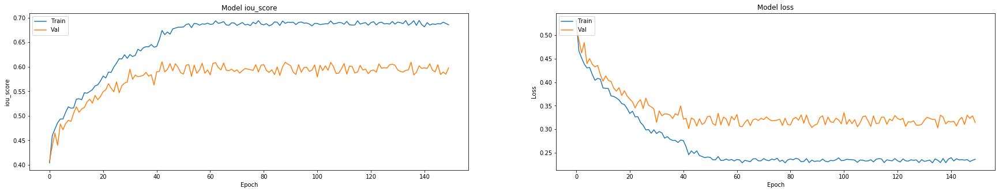

In [10]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

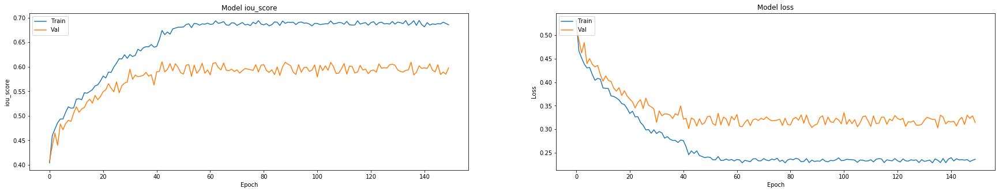

In [11]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.savefig(mdirir+'iou_and_loss.png')

Unknown metric


UnboundLocalError: local variable 'met_str' referenced before assignment

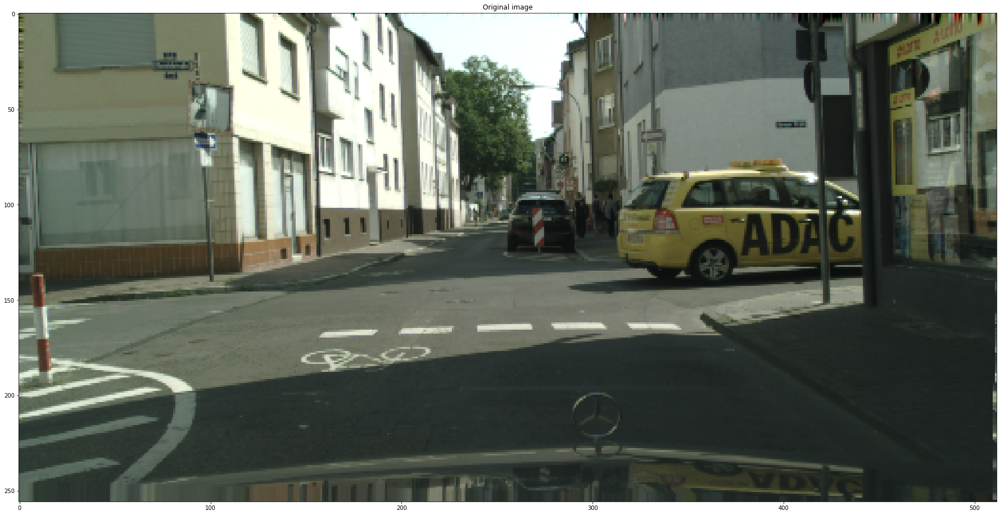

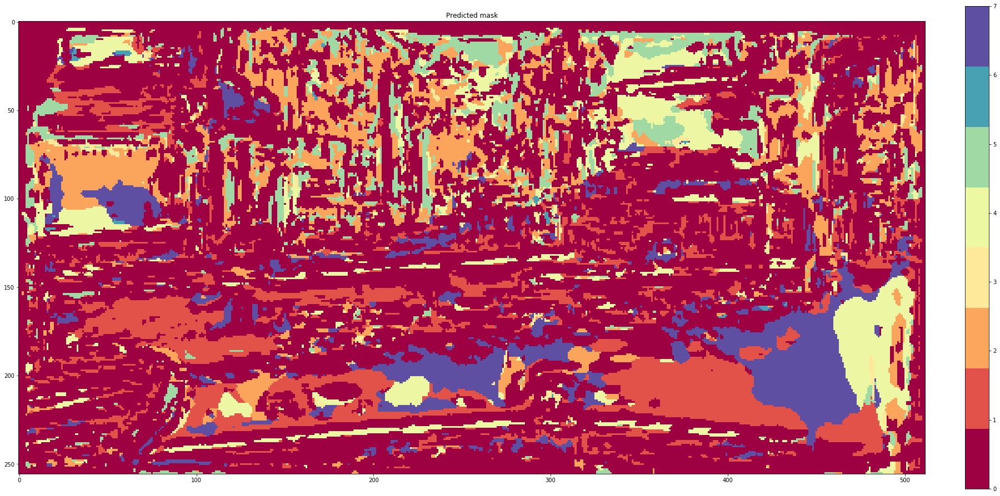

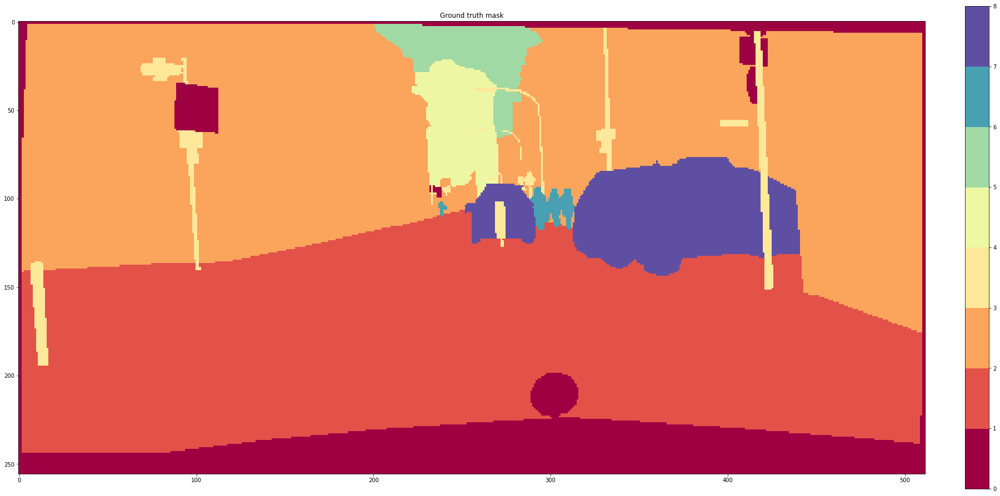

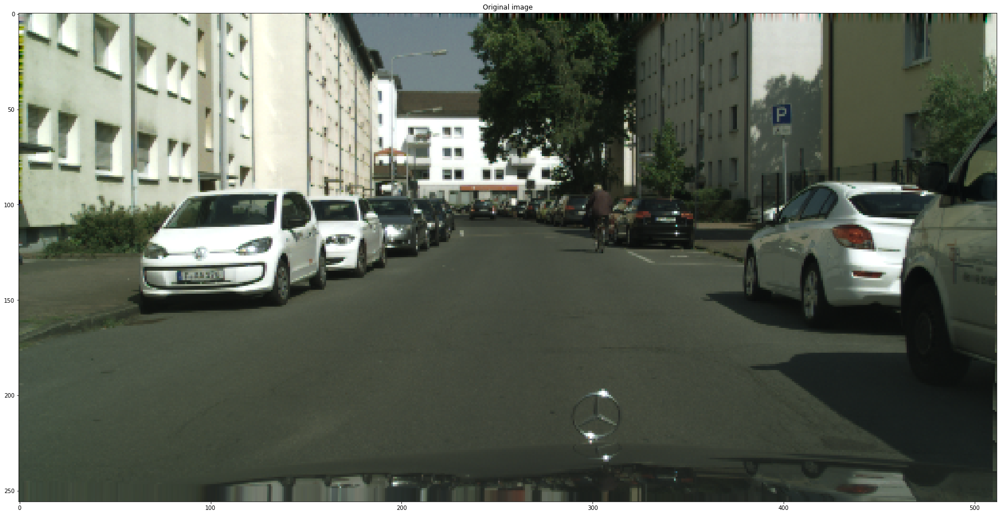

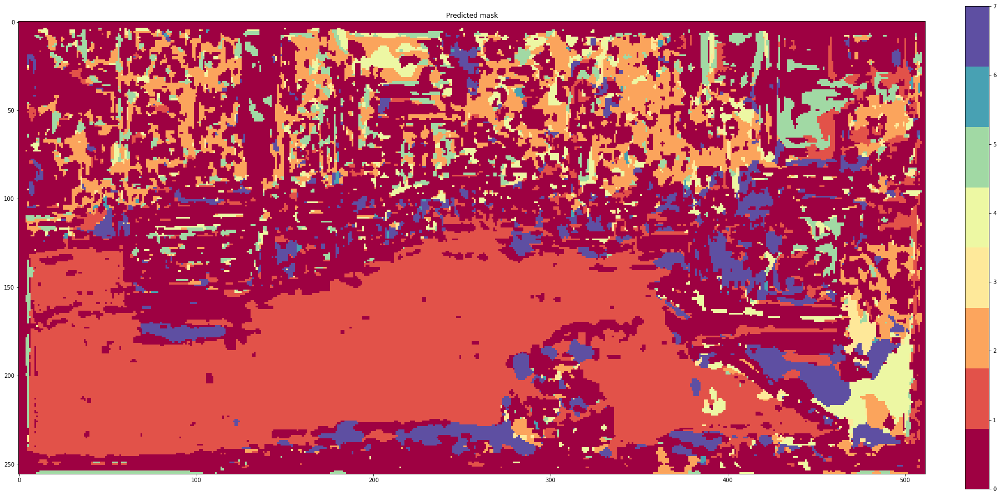

...

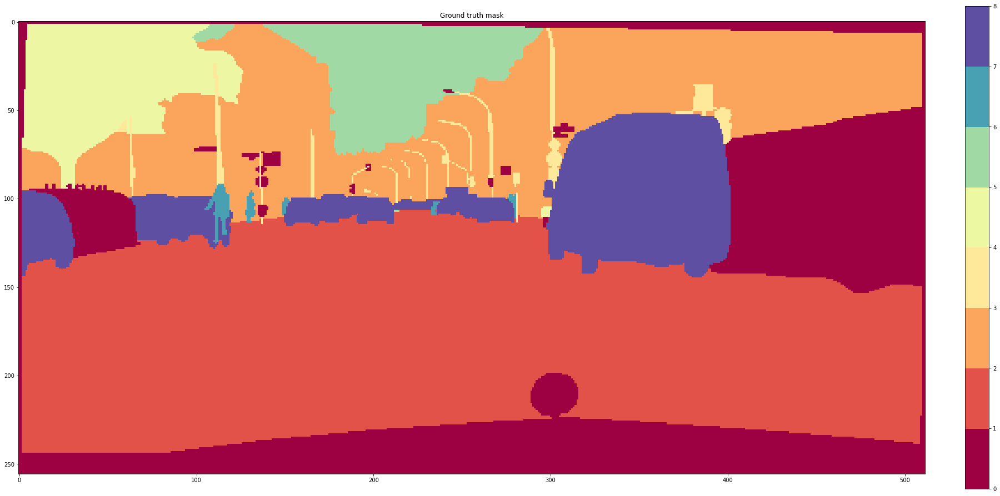

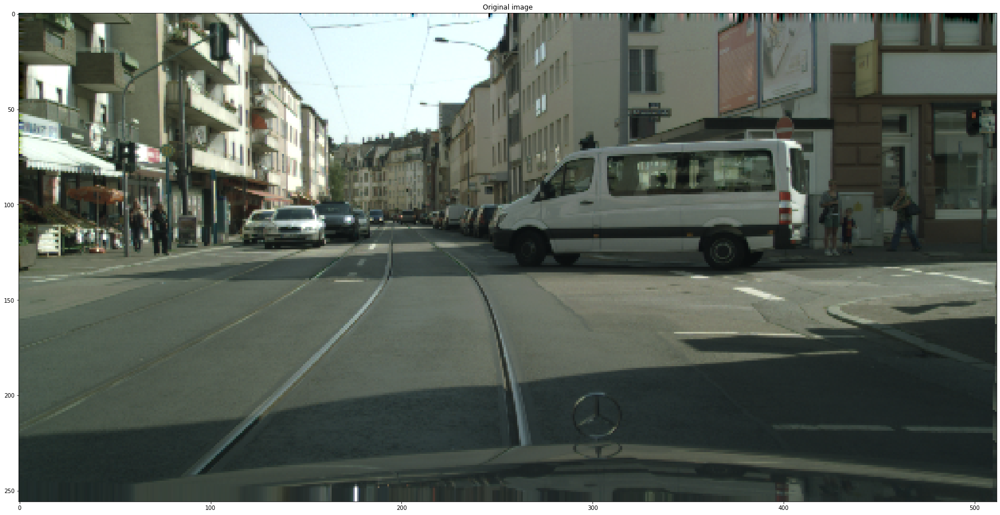

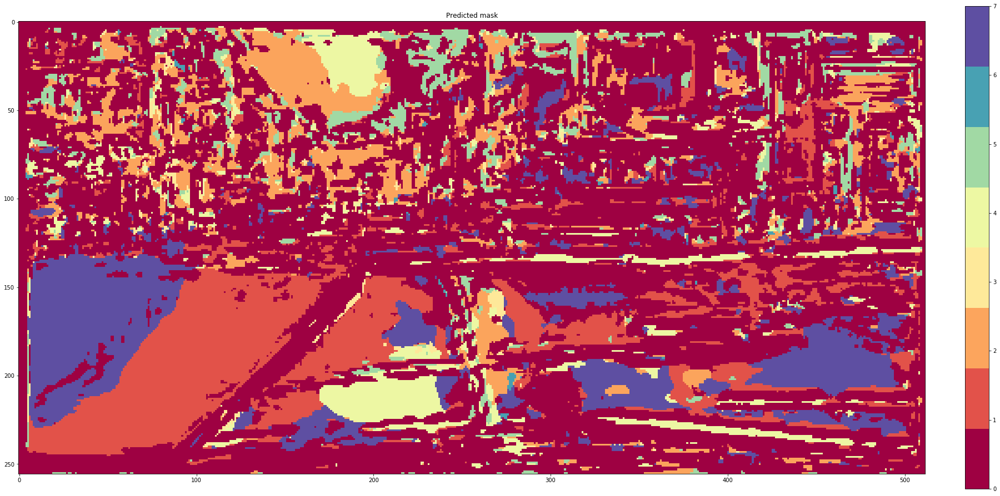

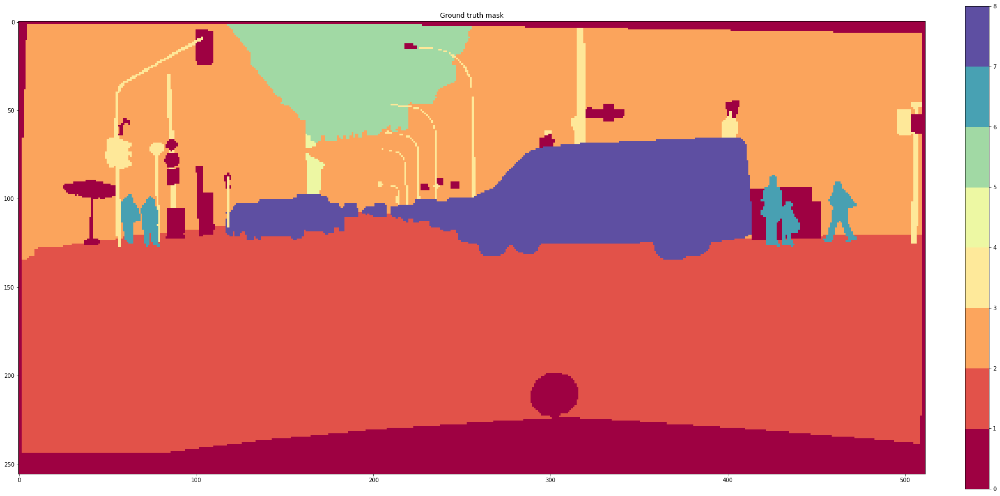

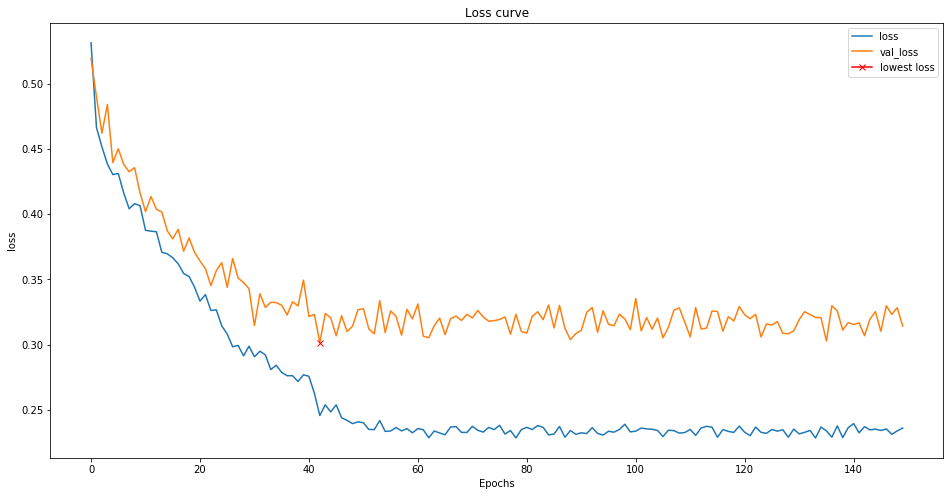

In [12]:
plot_predict_and_gt(model, valset.X, valset.Y, range(6), mdir, n_classes)
# plot loss and other metrics
plot_loss(history,mdir)
plot_metric(metrics, history,mdir)

In [7]:
model.load_weights(mdir+'best_model.h5')

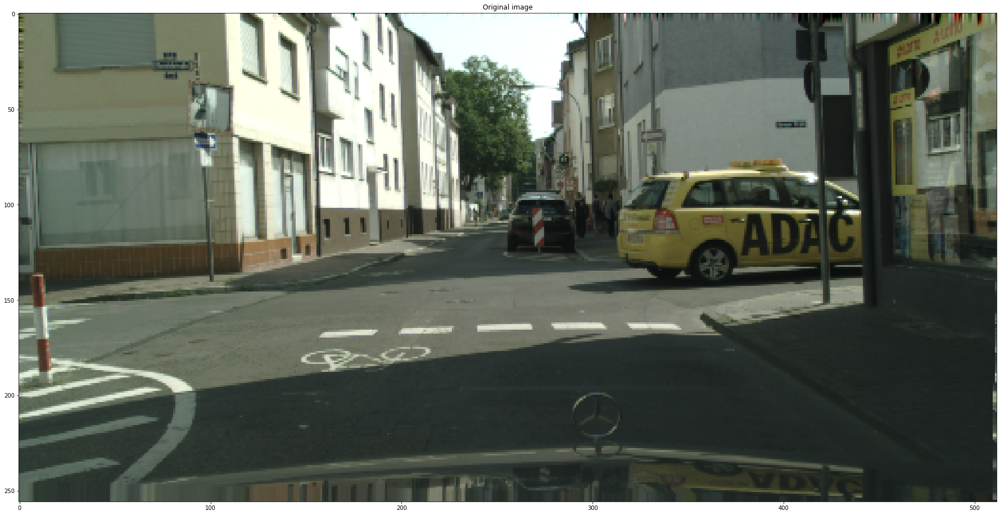

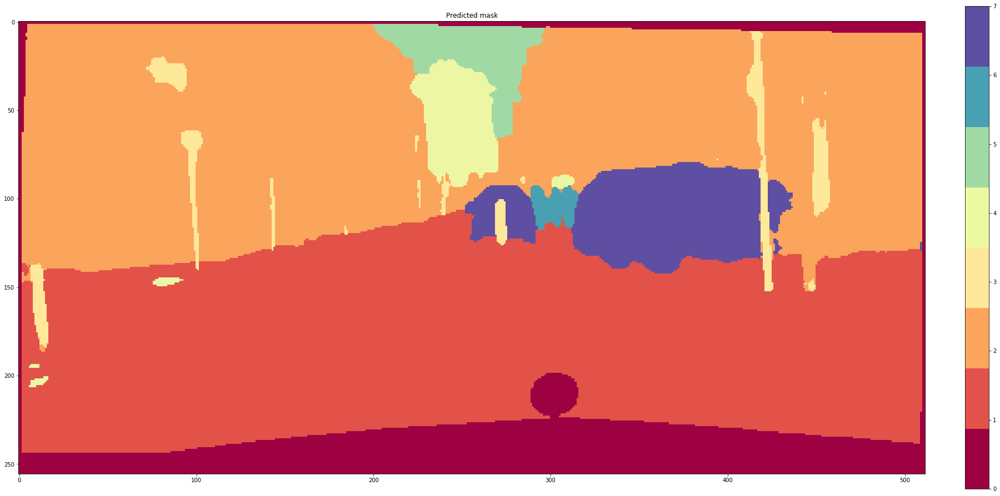

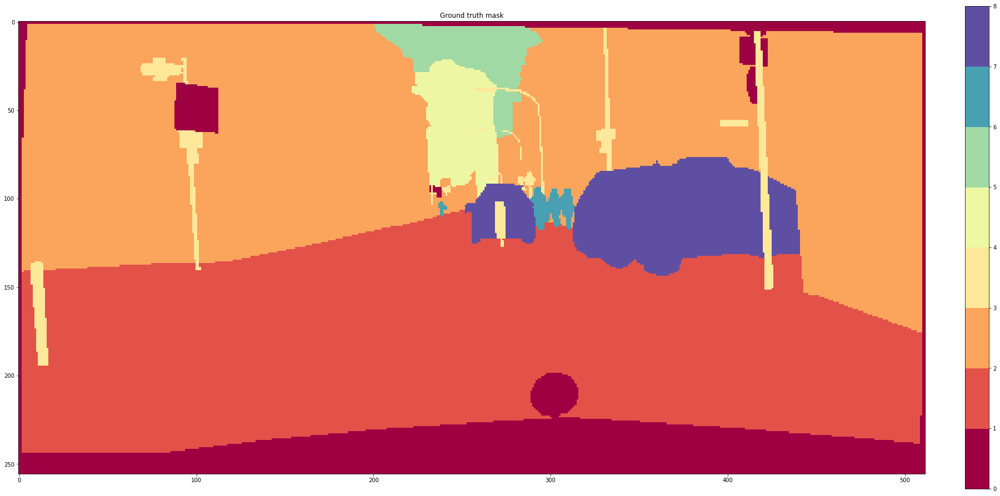

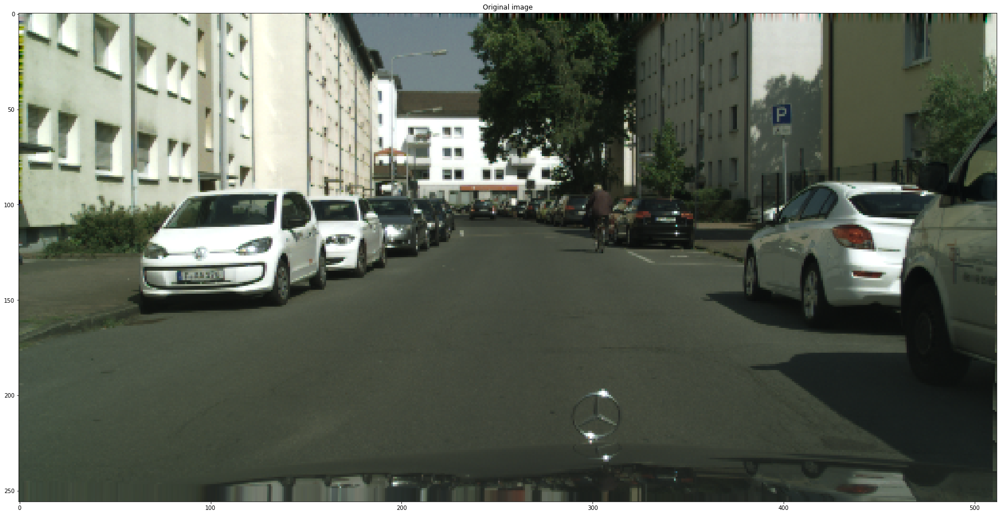

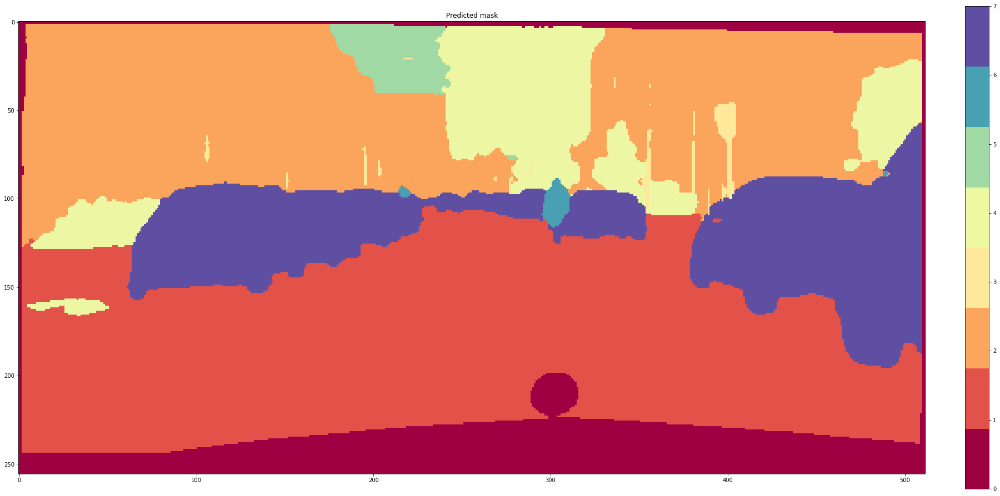

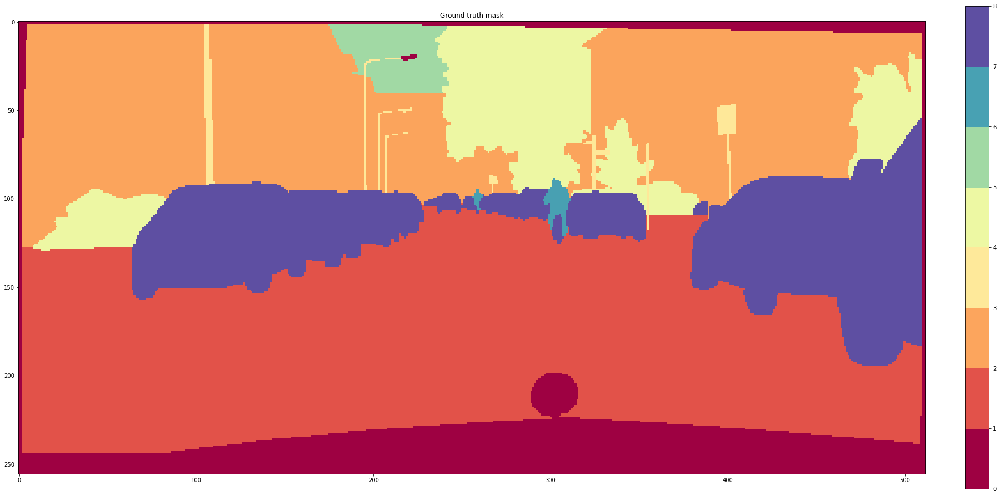

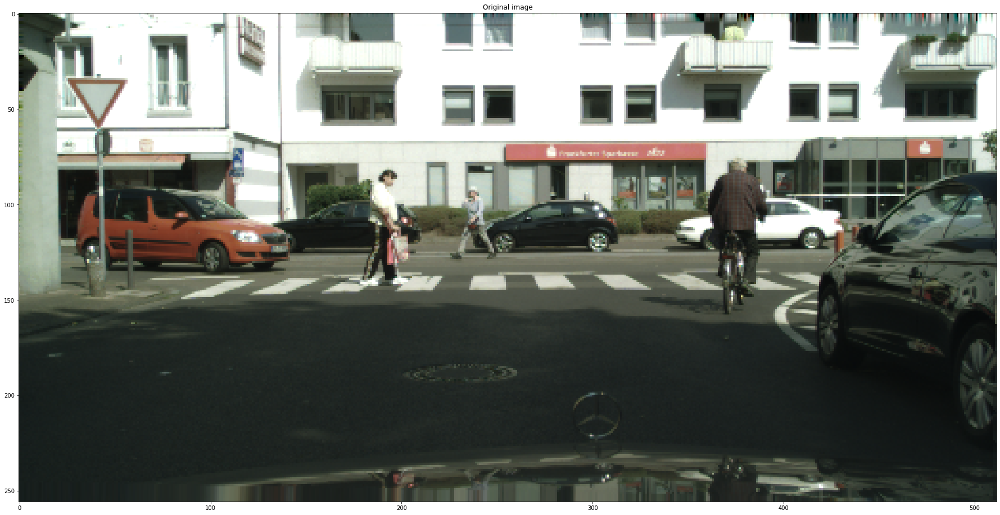

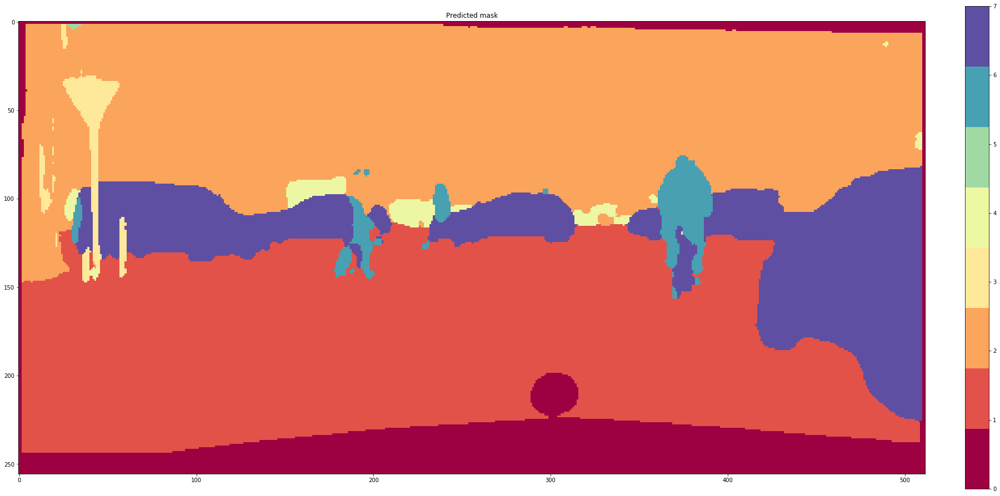

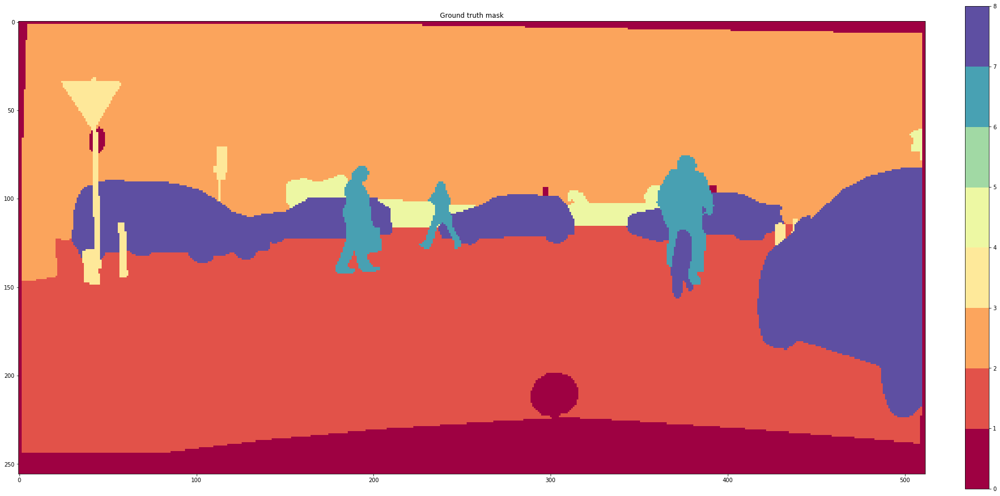

In [9]:
plot_predict_and_gt(model, valset.X, valset.Y, range(3), mdir, n_classes)

In [1]:
valset.X/255.

NameError: name 'valset' is not defined